# Project Details

## Author Details
- **Name:** ONAOLAPO Francis Olawale  
  

## Data Source
The dataset used in this project is sourced from Kaggle. You can access it here:  
[Bank Loan Approval Classification Dataset on Kaggle](https://www.kaggle.com/datasets/vikramamin/bank-loan-approval-lr-dt-rf-and-auc/data)

# ICA Requirement
1. Define the problem for the selected data set and identify the machine learning algorithms that are applicable to this problem.
2. Data exploration and preparation: The nature of the dataset may dictate some data exploration and preparation that can help inform the solutions. For example, higher- dimensional datasets (those with too many attributes/columns) may require applying a data reduction method like Principal Component Analysis (PCA).
3. Propose solutions: In this step, you will propose three machine learning algorithms that are applicable to the selected data set/problem.
4. Design, implementation, modelling, and evaluation: design, model and implement the proposed solutions and critically evaluate the solutions. Use appropriate visualization for the results.
5. Reflect on professional, ethical, and legal issues in relation to the problem and the data set.

# DEFINING THE PROBLEM

# Selected data set problem definition
- Developing a model to predict if a personal loan should be approved or rejected by a bank for customers.

# Applicable Machine Learning Algorithm
- Algorithms applicable for supervised classification tasks will be considered, depending on the data pre-processing observations
- Examples of algorithms applicable for supervised classification tasks are 

- Logistic Regression
- Support Vector Machines
- Naïve Bayesian Classifier
- K-Nearest-Neighbour algorithm (KNN)
- Logistic regression
- Decision trees
- Random forests
- Gradient Boosting Classifier
• CNNs (deep learning)

# Importing Libraries

In [1]:
# Importing Libraries

# Data Manipulation and Analysis
import pandas as pd  # For data handling, manipulation, and working with DataFrames
import numpy as np  # For numerical operations, array handling, and mathematical computations

# Data Visualization
import matplotlib.pyplot as plt  # For creating plots, graphs, and visualizations
import seaborn as sns  # For enhanced statistical visualizations and heatmaps
#from adjustText import adjust_text  # For adjusting text labels to avoid overlap in plots
from IPython.display import display, HTML  # For displaying formatted outputs (e.g., tables, HTML) in Jupyter notebooks

# Machine Learning - Data Preprocessing and Model Building
from sklearn.model_selection import train_test_split  # For splitting data into training and test sets
from sklearn.model_selection import GridSearchCV  # For hyperparameter tuning using grid search
from sklearn.preprocessing import RobustScaler  # For scaling features robust to outliers
from sklearn.compose import ColumnTransformer  # For applying different preprocessing steps to different columns
from sklearn.pipeline import Pipeline  # For creating machine learning pipelines to streamline preprocessing and modeling

# Machine Learning - Models
from sklearn.linear_model import LogisticRegression  # For Logistic Regression classification model
from sklearn.tree import DecisionTreeClassifier  # For Decision Tree classification model
from sklearn.ensemble import RandomForestClassifier  # For Random Forest ensemble classification model
from sklearn.ensemble import GradientBoostingClassifier  # For Gradient Boosting ensemble classification model

# Machine Learning - Evaluation Metrics
from sklearn.metrics import accuracy_score  # For calculating classification accuracy
from sklearn.metrics import classification_report  # For generating detailed classification metrics (precision, recall, f1-score)
from sklearn.metrics import confusion_matrix  # For computing confusion matrices
from sklearn.metrics import roc_curve  # For computing Receiver Operating Characteristic (ROC) curve data
from sklearn.metrics import auc  # For calculating Area Under the Curve (AUC) for ROC curves
from sklearn.metrics import ConfusionMatrixDisplay  # For visualizing confusion matrices

# Handling Imbalanced Data
from imblearn.over_sampling import SMOTENC  # For oversampling imbalanced datasets with categorical features using SMOTE-NC

# Model Interpretability
from lime.lime_tabular import LimeTabularExplainer  # For explaining predictions of tabular data models using LIME

# Statistical Analysis
from statsmodels.stats.outliers_influence import variance_inflation_factor  # For calculating Variance Inflation Factor (VIF) to detect multicollinearity

# Model Persistence
import joblib  # For saving and loading trained machine learning models to/from disk

# File System Operations
import os  # For interacting with the operating system, e.g., file and directory management

# Dynamically sets the current working directory to the location of the script, ensuring file operations use relative paths and avoiding issues with absolute paths

In [2]:
# Setting the working directory
try:
    PATH_TO_THIS_FILE = os.path.dirname(__file__)
except NameError:
    PATH_TO_THIS_FILE = os.getcwd()

os.chdir(PATH_TO_THIS_FILE)
print("CURRENT WORKING DIRECTORY: ", os.getcwd())

CURRENT WORKING DIRECTORY:  c:\Users\OMEN 16\Desktop\teesside_ds_courses\projects\machine_learning_projects\zip9x_bankloan


# DATA EXPLORATION AND PREPARATION

# Loading the dataset

In [3]:
# Reading the data 
df_bankloan = pd.read_csv("bankloan.csv")
print()
print(f'THE FIRST 7 ROWS OF THE DATASET: \n\n {df_bankloan.head(7)}\n\n') # Previewing the first 7 rows
print(f'THE LAST 5 ROWS OF THE DATASET: \n\n {df_bankloan.tail()}\n\n') # Previewing the last 5 rows


THE FIRST 7 ROWS OF THE DATASET: 

    ID  Age  Experience  Income  ZIP.Code  Family  CCAvg  Education  Mortgage  \
0   1   25           1      49     91107       4    1.6          1         0   
1   2   45          19      34     90089       3    1.5          1         0   
2   3   39          15      11     94720       1    1.0          1         0   
3   4   35           9     100     94112       1    2.7          2         0   
4   5   35           8      45     91330       4    1.0          2         0   
5   6   37          13      29     92121       4    0.4          2       155   
6   7   53          27      72     91711       2    1.5          2         0   

   Personal.Loan  Securities.Account  CD.Account  Online  CreditCard  
0              0                   1           0       0           0  
1              0                   1           0       0           0  
2              0                   0           0       0           0  
3              0                   0  

# Data Pre-Processing
## Potential problems with raw data checked
- Missing data
- Data corruption
- Incorrect data for field type
- Different naming conventions
- Different classification techniques

In [4]:
# Count the number of missing values in the DataFrame
num_missing_values = df_bankloan.isnull().sum()

# Display the number of missing values
print(f"Number of missing values: \n\n{num_missing_values}\n")

Number of missing values: 

ID                    0
Age                   0
Experience            0
Income                0
ZIP.Code              0
Family                0
CCAvg                 0
Education             0
Mortgage              0
Personal.Loan         0
Securities.Account    0
CD.Account            0
Online                0
CreditCard            0
dtype: int64



# Prior information from the data source about the data
## https://www.kaggle.com/datasets/vikramamin/bank-loan-approval-lr-dt-rf-and-auc/data
## About this file
- File contains 14 columns and 5000 rows. Description of the columns are as follows:
- •	ID: Customer ID
- •	Age : Customer Age
- •	Experience : Customer Experience
- •	Income : Income of the Customer
- •	ZipCode: Customer's residence zipcode
- •	Family : No of Family members of the customer
- •	CCAvg: Credit Card Average Score
- •	Education: Education of the customer
- •	Mortgage: Mortgage taken or not taken by the customer
- •	Personal Loan: 0 = No personal loan given , 1 = personal loan given
- •	Securities Account : Having or not having a Securities Account
- •	CD Account : Having or not having a CD Account
- •	Online : Having or not having online banking
- •	Credit Card : Having or not having a credit card

# Checking for duplicated rows
- No duplicated rows found

In [5]:
# Count the number of duplicated rows in the DataFrame
num_duplicated_rows = df_bankloan.duplicated().sum()

# Display the number of duplicated rows
print(f"Number of duplicated rows: {num_duplicated_rows}")

Number of duplicated rows: 0


In [6]:
df_bankloan.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 14 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   ID                  5000 non-null   int64  
 1   Age                 5000 non-null   int64  
 2   Experience          5000 non-null   int64  
 3   Income              5000 non-null   int64  
 4   ZIP.Code            5000 non-null   int64  
 5   Family              5000 non-null   int64  
 6   CCAvg               5000 non-null   float64
 7   Education           5000 non-null   int64  
 8   Mortgage            5000 non-null   int64  
 9   Personal.Loan       5000 non-null   int64  
 10  Securities.Account  5000 non-null   int64  
 11  CD.Account          5000 non-null   int64  
 12  Online              5000 non-null   int64  
 13  CreditCard          5000 non-null   int64  
dtypes: float64(1), int64(13)
memory usage: 547.0 KB


# Checking for features with low variance / unit value or high cardinality categorical features
- The ZIP.Code cardinality is high (for a categorical feature)
- The ID is non-predictive feature. it will be removed

In [7]:
unique_counts = df_bankloan.nunique()
print(unique_counts)

ID                    5000
Age                     45
Experience              47
Income                 162
ZIP.Code               467
Family                   4
CCAvg                  108
Education                3
Mortgage               347
Personal.Loan            2
Securities.Account       2
CD.Account               2
Online                   2
CreditCard               2
dtype: int64


# The `ID` feature is removed. It does not have predictive influence.

In [8]:
df_bankloan.drop(columns=["ID"], inplace=True, errors='ignore')

# Checking the statistical summary for the numerical features
- `ZIP.Code`, `Personal.Loan`, `Education`, `Securities.Account`,  `CD.Account`, `Online` and `CreditCard` statistics displayed are not assessed as they are categorical feature. Other features are assessed.
- `Experience` has values that are negative, which is illogical. Assumption will not be made to convert the negative values to positive values. The negative values will be removed.

In [9]:
# Display summary statistics for non-numeric features
print(df_bankloan.describe(include=['number']))

               Age   Experience       Income      ZIP.Code       Family  \
count  5000.000000  5000.000000  5000.000000   5000.000000  5000.000000   
mean     45.338400    20.104600    73.774200  93152.503000     2.396400   
std      11.463166    11.467954    46.033729   2121.852197     1.147663   
min      23.000000    -3.000000     8.000000   9307.000000     1.000000   
25%      35.000000    10.000000    39.000000  91911.000000     1.000000   
50%      45.000000    20.000000    64.000000  93437.000000     2.000000   
75%      55.000000    30.000000    98.000000  94608.000000     3.000000   
max      67.000000    43.000000   224.000000  96651.000000     4.000000   

             CCAvg    Education     Mortgage  Personal.Loan  \
count  5000.000000  5000.000000  5000.000000    5000.000000   
mean      1.937938     1.881000    56.498800       0.096000   
std       1.747659     0.839869   101.713802       0.294621   
min       0.000000     1.000000     0.000000       0.000000   
25%      

- checking the unique values in the `experience` feature to know the extent of the negative values in the feature

In [10]:
np.sort(df_bankloan["Experience"].unique())[:50]

array([-3, -2, -1,  0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13,
       14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30,
       31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43])

In [11]:
# Count rows with negative Experience
negative_experience_count = len(df_bankloan[df_bankloan["Experience"] < 0])
print(f"Number of rows with negative experience: {negative_experience_count}")

# Display 10 rows with negative Experience
negative_experience_rows = df_bankloan[df_bankloan["Experience"] < 0]
print("\nThe rows with negative experience:")
print(negative_experience_rows.head(55))

Number of rows with negative experience: 52

The rows with negative experience:
      Age  Experience  Income  ZIP.Code  Family  CCAvg  Education  Mortgage  \
89     25          -1     113     94303       4   2.30          3         0   
226    24          -1      39     94085       2   1.70          2         0   
315    24          -2      51     90630       3   0.30          3         0   
451    28          -2      48     94132       2   1.75          3        89   
524    24          -1      75     93014       4   0.20          1         0   
536    25          -1      43     92173       3   2.40          2       176   
540    25          -1     109     94010       4   2.30          3       314   
576    25          -1      48     92870       3   0.30          3         0   
583    24          -1      38     95045       2   1.70          2         0   
597    24          -2     125     92835       2   7.20          1         0   
649    25          -1      82     92677       4   2

# Dropping the negative values in the `experience` feature, as it is illogical for `experience` to be negative.

In [12]:
# Get unique negative Experience values before dropping
unique_negative_experience = df_bankloan[df_bankloan["Experience"] < 0]["Experience"].unique()
print("Unique negative Experience values before dropping:")
print(unique_negative_experience)

# Count rows with negative Experience before dropping
negative_experience_count = len(df_bankloan[df_bankloan["Experience"] < 0])
print(f"Number of rows with negative Experience: {negative_experience_count}")

# Drop rows with negative Experience, keeping the Experience column
df_bankloan = df_bankloan[df_bankloan["Experience"] >= 0]

# Verify the result
print(f"\nNew total rows after dropping: {len(df_bankloan)}")
print("Min Experience after dropping:", df_bankloan["Experience"].min())

Unique negative Experience values before dropping:
[-1 -2 -3]
Number of rows with negative Experience: 52

New total rows after dropping: 4948
Min Experience after dropping: 0


# Checking for potential data inconsistency in the `ZIP.Code` feature
- `4-digits` and `5-digits` values present in the `ZIP.Code` feature. The `ZIP.Code` will be made consistent.


In [13]:
np.sort(df_bankloan["ZIP.Code"].unique())[:100]

array([ 9307, 90005, 90007, 90009, 90011, 90016, 90018, 90019, 90024,
       90025, 90027, 90028, 90029, 90032, 90033, 90034, 90035, 90036,
       90037, 90041, 90044, 90045, 90048, 90049, 90057, 90058, 90059,
       90064, 90065, 90066, 90068, 90071, 90073, 90086, 90089, 90095,
       90210, 90212, 90230, 90232, 90245, 90250, 90254, 90266, 90272,
       90274, 90275, 90277, 90280, 90291, 90304, 90401, 90404, 90405,
       90502, 90503, 90504, 90505, 90509, 90601, 90623, 90630, 90638,
       90639, 90640, 90650, 90717, 90720, 90740, 90745, 90747, 90755,
       90813, 90840, 91006, 91007, 91016, 91024, 91030, 91040, 91101,
       91103, 91105, 91107, 91109, 91116, 91125, 91129, 91203, 91207,
       91301, 91302, 91304, 91311, 91320, 91326, 91330, 91335, 91342,
       91343])

In [14]:
np.sort(df_bankloan["ZIP.Code"].unique())[350:]

array([94606, 94607, 94608, 94609, 94610, 94611, 94612, 94618, 94701,
       94703, 94704, 94705, 94706, 94707, 94708, 94709, 94710, 94720,
       94801, 94803, 94806, 94901, 94904, 94920, 94923, 94928, 94939,
       94949, 94960, 94965, 94970, 94998, 95003, 95005, 95006, 95008,
       95010, 95014, 95020, 95023, 95032, 95035, 95037, 95039, 95045,
       95051, 95053, 95054, 95060, 95064, 95070, 95112, 95120, 95123,
       95125, 95126, 95131, 95133, 95134, 95135, 95136, 95138, 95192,
       95193, 95207, 95211, 95307, 95348, 95351, 95354, 95370, 95403,
       95405, 95422, 95449, 95482, 95503, 95518, 95521, 95605, 95616,
       95617, 95621, 95630, 95670, 95678, 95741, 95747, 95758, 95762,
       95812, 95814, 95816, 95817, 95818, 95819, 95820, 95821, 95822,
       95825, 95827, 95828, 95831, 95833, 95841, 95842, 95929, 95973,
       96001, 96003, 96008, 96064, 96091, 96094, 96145, 96150, 96651])

- Checking the number of rows with `4-digit` values in the `ZIP.Code` feature. 1 row is found with `4-digit` values.
- While there are zip codes with 4 digits and zip codes with 5 digits in the United States of America, hence, this inconsistency is not an error in itself.

In [15]:
# Filter rows where ZIP.Code is 4 digits
four_digit_rows = df_bankloan[df_bankloan["ZIP.Code"].astype(str).str.len() == 4]
print(four_digit_rows)

     Age  Experience  Income  ZIP.Code  Family  CCAvg  Education  Mortgage  \
384   51          25      21      9307       4    0.6          3         0   

     Personal.Loan  Securities.Account  CD.Account  Online  CreditCard  
384              0                   0           0       1           1  


# Removing the data inconsistency in the `ZIP.Code` feature by setting the all the values to `4-digit`
- combination of `4-digit` and `5-digit` values in the `ZIP.Code` is not necessarily an error, in some countries such as the United States of America, with refernece: https://www.geopostcodes.com/blog/international-zip-code-format/
- The number of unique values in the `ZIP.Code` has reduced to `221`. However, the cluster size of the houses will be increased by grouping the `applicants` based on the first `2-digits` in their `ZIP.Code`. More information on `ZIP.Code`, with focus on the United States of America can be found here: - https://en.wikipedia.org/wiki/ZIP_Code

In [16]:
# Convert ZIP.Code to string and take the first 4 characters, then overwrite the column
df_bankloan["ZIP.Code"] = df_bankloan["ZIP.Code"].astype(str).str[:4]

In [17]:
df_bankloan["ZIP.Code"].describe()

count     4948
unique     221
top       9430
freq       254
Name: ZIP.Code, dtype: object

- The number of unique values in the `ZIP.Code` has reduced to `7`
- `One-hot encoding` method will be used to encode the `ZIP.Code` because `ZIP.Code` is not considered as high cardinal features with `7` unique values.

In [18]:
# Convert ZIP.Code to string and take the first 4 characters, then overwrite the column
df_bankloan["ZIP.Code"] = df_bankloan["ZIP.Code"].astype(str).str[:2]
df_bankloan["ZIP.Code"].describe()

count     4948
unique       7
top         94
freq      1456
Name: ZIP.Code, dtype: object

In [19]:
unique_counts = df_bankloan.nunique()
print(unique_counts)

Age                    44
Experience             44
Income                162
ZIP.Code                7
Family                  4
CCAvg                 108
Education               3
Mortgage              347
Personal.Loan           2
Securities.Account      2
CD.Account              2
Online                  2
CreditCard              2
dtype: int64


- Grouping the applicants `ZIP.Code` with the first `2-digits` in their `ZIP.Code` resulted in 2 applicants having identical features. One of the rows is dropped.

In [20]:
# Count the number of duplicated rows in the DataFrame
num_duplicated_rows = df_bankloan.duplicated().sum()

# Display the number of duplicated rows
print(f"Number of duplicated rows: {num_duplicated_rows}")

Number of duplicated rows: 1


In [21]:
print(df_bankloan[df_bankloan.duplicated()])  # Show duplicate rows

      Age  Experience  Income ZIP.Code  Family  CCAvg  Education  Mortgage  \
1526   36          10      80       94       4    2.2          2         0   

      Personal.Loan  Securities.Account  CD.Account  Online  CreditCard  
1526              0                   0           0       1           0  


In [22]:
# Show duplicate rows before dropping
print("Duplicate rows before dropping:")
print(df_bankloan[df_bankloan.duplicated()])

# Count duplicates before dropping
duplicate_count = df_bankloan.duplicated().sum()
print(f"Number of duplicated rows: {duplicate_count}")

# Drop duplicated rows, keeping the first occurrence
df_bankloan = df_bankloan.drop_duplicates(keep='first')

# Reset the index after dropping duplicates
df_bankloan = df_bankloan.reset_index(drop=True)

# Verify the new row count
print(f"New total rows after dropping duplicates: {len(df_bankloan)}")

Duplicate rows before dropping:
      Age  Experience  Income ZIP.Code  Family  CCAvg  Education  Mortgage  \
1526   36          10      80       94       4    2.2          2         0   

      Personal.Loan  Securities.Account  CD.Account  Online  CreditCard  
1526              0                   0           0       1           0  
Number of duplicated rows: 1
New total rows after dropping duplicates: 4947


# Checking the values in the features for any potential data corruption. 
- No corrupt data was found.

In [23]:
np.sort(df_bankloan["Mortgage"].unique())[:100]

array([  0,  75,  76,  77,  78,  79,  80,  81,  82,  83,  84,  85,  86,
        87,  88,  89,  90,  91,  92,  93,  94,  95,  96,  97,  98,  99,
       100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112,
       113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125,
       126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138,
       139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151,
       152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164,
       165, 166, 167, 168, 169, 170, 171, 172, 173])

In [24]:
np.sort(df_bankloan["Mortgage"].unique())[250:]

array([337, 341, 342, 343, 344, 345, 351, 352, 353, 354, 355, 357, 358,
       359, 360, 361, 364, 366, 368, 372, 373, 374, 378, 380, 381, 382,
       383, 385, 389, 391, 392, 394, 396, 397, 398, 400, 402, 403, 405,
       406, 408, 410, 412, 415, 416, 419, 421, 422, 427, 428, 429, 431,
       432, 433, 437, 442, 446, 449, 452, 455, 458, 461, 464, 466, 467,
       470, 475, 477, 481, 483, 485, 496, 500, 505, 508, 509, 522, 524,
       535, 541, 547, 550, 553, 565, 567, 569, 571, 577, 581, 582, 587,
       589, 590, 601, 612, 617, 635])

# Checking the data to have insight into the data distribution prior to visualizing it

In [25]:
Mortgage_Nil = df_bankloan["Mortgage"] == 0
print(Mortgage_Nil.sum())

3421


In [26]:
grouped_addresses_count = df_bankloan.groupby('Mortgage')
grouped_addresses_count.count()['Personal.Loan'].sort_values(ascending=False).tail(10)

Mortgage
577    1
581    1
582    1
587    1
589    1
590    1
601    1
612    1
617    1
635    1
Name: Personal.Loan, dtype: int64

In [27]:
grouped_addresses_count = df_bankloan.groupby('Mortgage')
grouped_addresses_count.count()['Personal.Loan'].sort_values(ascending=False).head(10)

Mortgage
0      3421
98       17
91       16
83       16
119      16
103      16
78       15
102      15
89       15
101      14
Name: Personal.Loan, dtype: int64

In [28]:
unique_counts = df_bankloan.nunique()
print(unique_counts)

Age                    44
Experience             44
Income                162
ZIP.Code                7
Family                  4
CCAvg                 108
Education               3
Mortgage              347
Personal.Loan           2
Securities.Account      2
CD.Account              2
Online                  2
CreditCard              2
dtype: int64


In [29]:
df_bankloan.describe(include=['number'])

,Age,Experience,Income,Family,CCAvg,Education,Mortgage,Personal.Loan,Securities.Account,CD.Account,Online,CreditCard
count,4947.000000,4947.000000,4947.000000,4947.000000,4947.000000,4947.000000,4947.000000,4947.000000,4947.000000,4947.000000,4947.000000,4947.000000
mean,45.559127,20.333131,73.813220,2.391146,1.935872,1.878917,56.645846,0.097029,0.104306,0.061047,0.596927,0.294118
std,11.321064,11.312163,46.117173,1.148333,1.747867,0.839828,101.835994,0.296026,0.305688,0.239441,0.490565,0.455691
min,24.000000,0.000000,8.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,36.000000,11.000000,39.000000,1.000000,0.700000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,46.000000,20.000000,64.000000,2.000000,1.500000,2.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
75%,55.000000,30.000000,98.000000,3.000000,2.600000,3.000000,101.000000,0.000000,0.000000,0.000000,1.000000,1.000000
max,67.000000,43.000000,224.000000,4.000000,10.000000,3.000000,635.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [30]:
df_bankloan.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4947 entries, 0 to 4946
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Age                 4947 non-null   int64  
 1   Experience          4947 non-null   int64  
 2   Income              4947 non-null   int64  
 3   ZIP.Code            4947 non-null   object 
 4   Family              4947 non-null   int64  
 5   CCAvg               4947 non-null   float64
 6   Education           4947 non-null   int64  
 7   Mortgage            4947 non-null   int64  
 8   Personal.Loan       4947 non-null   int64  
 9   Securities.Account  4947 non-null   int64  
 10  CD.Account          4947 non-null   int64  
 11  Online              4947 non-null   int64  
 12  CreditCard          4947 non-null   int64  
dtypes: float64(1), int64(11), object(1)
memory usage: 502.6+ KB


In [31]:
df_bankloan["Education"].unique()

array([1, 2, 3])

In [32]:
df_bankloan["Securities.Account"].unique()

array([1, 0])

In [33]:
df_bankloan["CD.Account"].unique()

array([0, 1])

In [34]:
df_bankloan["Online"].unique()

array([0, 1])

In [35]:
df_bankloan["CreditCard"].unique()

array([0, 1])

In [36]:
df_bankloan["Personal.Loan"].unique()

array([0, 1])

# Inverse Encoding for visualization purpose. For easy visual interpretation and understanding.
- `education` will be treated as a ordinal categorical feature
- `ZIP.Code` will be treated as nominal categorical feature (non-binary feature). However, it is not inverse encoded 
- The other categorical features will be treated as binary feature


In [37]:
# Replace numeric values with strings
df_bankloan["Education"] = df_bankloan["Education"].replace({1: 'High.School', 2: 'Bachelors', 3: 'Masters_&_Above'})
df_bankloan["Securities.Account"] = df_bankloan["Securities.Account"].replace({0: 'No.Securities.Account', 1: 'Have.Securities.Account'})
df_bankloan["CD.Account"] = df_bankloan["CD.Account"].replace({0: 'No.CD.Account', 1: 'Have.CD.Account'})
df_bankloan["Online"] = df_bankloan["Online"].replace({0: 'No.Online.Banking', 1: 'Have.Online.Banking'})
df_bankloan["CreditCard"] = df_bankloan["CreditCard"].replace({0: 'No.CreditCard', 1: 'Have.CreditCard'})
df_bankloan["Personal.Loan"] = df_bankloan["Personal.Loan"].replace({0: 'Personal.Loan.Rejected', 1: 'Personal.Loan.Approved'})

# Check the result
df_bankloan.head()

,Age,Experience,Income,ZIP.Code,Family,CCAvg,Education,Mortgage,Personal.Loan,Securities.Account,CD.Account,Online,CreditCard
0,25,1,49,91,4,1.6,High.School,0,Personal.Loan.Rejected,Have.Securities.Account,No.CD.Account,No.Online.Banking,No.CreditCard
1,45,19,34,90,3,1.5,High.School,0,Personal.Loan.Rejected,Have.Securities.Account,No.CD.Account,No.Online.Banking,No.CreditCard
2,39,15,11,94,1,1.0,High.School,0,Personal.Loan.Rejected,No.Securities.Account,No.CD.Account,No.Online.Banking,No.CreditCard
3,35,9,100,94,1,2.7,Bachelors,0,Personal.Loan.Rejected,No.Securities.Account,No.CD.Account,No.Online.Banking,No.CreditCard
4,35,8,45,91,4,1.0,Bachelors,0,Personal.Loan.Rejected,No.Securities.Account,No.CD.Account,No.Online.Banking,Have.CreditCard


# Features renaming
- `Personal.Loan` feature is renamed `Personal.Loan.Status` and `CD.Account`  feature is renamed `Certificate.Deposit.Account`

In [38]:
df_bankloan = df_bankloan.rename(columns={'Personal.Loan': 'Personal.Loan.Status', 'CD.Account': 'Certificate.Deposit.Account'})

# Verify the change
print(df_bankloan.columns)

Index(['Age', 'Experience', 'Income', 'ZIP.Code', 'Family', 'CCAvg',
       'Education', 'Mortgage', 'Personal.Loan.Status', 'Securities.Account',
       'Certificate.Deposit.Account', 'Online', 'CreditCard'],
      dtype='object')


In [39]:
df_bankloan.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4947 entries, 0 to 4946
Data columns (total 13 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Age                          4947 non-null   int64  
 1   Experience                   4947 non-null   int64  
 2   Income                       4947 non-null   int64  
 3   ZIP.Code                     4947 non-null   object 
 4   Family                       4947 non-null   int64  
 5   CCAvg                        4947 non-null   float64
 6   Education                    4947 non-null   object 
 7   Mortgage                     4947 non-null   int64  
 8   Personal.Loan.Status         4947 non-null   object 
 9   Securities.Account           4947 non-null   object 
 10  Certificate.Deposit.Account  4947 non-null   object 
 11  Online                       4947 non-null   object 
 12  CreditCard                   4947 non-null   object 
dtypes: float64(1), int

# Checking the descriptive summary of the categorical features
- No high cardinal feature (Already knew from above analysis)
- No "constant feature" or "zero-variance feature" (Already knew from above analysis)
- `Personal.Loan.Status`,	`Securities.Account` and	`Certificate.Deposit.Account` are highly imbalance with `4467 Personal.Loan.Rejected`, `4431 No.Securities.Account` and `4645 No.CD.Account`. 
- The target feature will be balanced for the main model development while the variance threshold of the independent features will be checked prior to final selection of the features.

In [40]:
df_bankloan.describe(include=['object'])

,ZIP.Code,Education,Personal.Loan.Status,Securities.Account,Certificate.Deposit.Account,Online,CreditCard
count,4947,4947,4947,4947,4947,4947,4947
unique,7,3,2,2,2,2,2
top,94,High.School,Personal.Loan.Rejected,No.Securities.Account,No.CD.Account,Have.Online.Banking,No.CreditCard
freq,1455,2080,4467,4431,4645,2953,3492


In [41]:
pd.set_option("display.float_format", "{:.2f}".format)
df_bankloan.describe()

,Age,Experience,Income,Family,CCAvg,Mortgage
count,4947.00,4947.00,4947.00,4947.00,4947.00,4947.00
mean,45.56,20.33,73.81,2.39,1.94,56.65
std,11.32,11.31,46.12,1.15,1.75,101.84
min,24.00,0.00,8.00,1.00,0.00,0.00
25%,36.00,11.00,39.00,1.00,0.70,0.00
50%,46.00,20.00,64.00,2.00,1.50,0.00
75%,55.00,30.00,98.00,3.00,2.60,101.00
max,67.00,43.00,224.00,4.00,10.00,635.00


# The functions that will be used for the plotting the differnet visualization types

In [42]:
def plot_histogram_chart(feature, bins, feature_2=None, rotation=0, freq_norm=False, num_type=int, colormap="coolwarm", color="blue"):
    """
    Plots a histogram for a given feature, optionally with a stacked or normalized histogram based on a second feature.

    Parameters:
    -----------
    feature : pandas.Series or array-like
        The primary feature for which the histogram is plotted.
    bins : int
        The number of bins to divide the data into.
    feature_2 : pandas.Series or array-like, optional
        A secondary feature used to create a stacked or normalized histogram. If provided, the histogram will be grouped by the unique values of this feature. Default is None.
    rotation : int, optional
        The rotation angle for x-axis labels. Default is 0.
    freq_norm : bool, optional
        If True, the histogram will be normalized by frequency (probability density). If False, the histogram will show raw counts. Default is False.
    num_type : type, optional
        The numeric type used for formatting x-axis tick labels (e.g., int, float). Default is int.
    colormap : str, optional
        The name of the colormap used to generate colors for the stacked histogram when `feature_2` is provided. Default is "coolwarm".
    color : str, optional
        The color of the histogram bars when `feature_2` is not provided. Default is "blue".

    Returns:
    --------
    None
        Displays the histogram plot using matplotlib.

    Notes:
    ------
    - If `feature_2` is provided, the histogram will be stacked or normalized based on the unique values of `feature_2`.
    - The x-axis ticks are aligned with the bin edges and formatted for better readability.
    - The y-axis represents either frequency or normalized frequency, depending on the value of `freq_norm`.
    - The plot includes grid lines on the y-axis for better visualization.
    """
    
    plt.figure(figsize=(10, 6))

    # Calculate bin edges
    bin_edges = np.linspace(feature.min(), feature.max(), bins + 1)

    if feature_2 is not None:
        # Get unique categories from feature_2
        unique_values = feature_2.unique()
        
        # Dynamically generate colors based on number of categories
        palette_colors = sns.color_palette(colormap, len(unique_values))   
        palette = dict(zip(unique_values, palette_colors))  # Map values to colors
        
        # Create a stacked histogram with hue
        sns.histplot(
            x=feature,
            hue=feature_2,
            bins=bin_edges,  # Use explicit bin edges
            multiple="fill" if freq_norm else "stack",  # Normalize by frequency if freq_norm is True
            stat="probability" if freq_norm else "count",  
            palette=palette,  # Use dynamically generated color palette
            edgecolor="black"
        )
        # Set title based on normalization
        title = f'Normalized Histogram of {feature.name} (Hue: {feature_2.name})' if freq_norm else f'Histogram of {feature.name} (Hue: {feature_2.name})'
        plt.title(title, fontsize=12)
        
        # Move the legend outside the plot 
        sns.move_legend(plt.gca(), "upper left", bbox_to_anchor=(1, 1))
    else:
        # Create a standard histogram
        plt.hist(
            feature,
            bins=bin_edges,  # Use explicit bin edges
            color=color,
            edgecolor="black",
            density=freq_norm  # Normalize by frequency if freq_norm is True
        )
        plt.title(f'Histogram of {feature.name}', fontsize=14)

    # Formatting the plot
    plt.xlabel(feature.name, fontsize=12)
    plt.ylabel("Normalized Frequency" if freq_norm else "Frequency", fontsize=12)
    plt.xticks(rotation=rotation)

    # Set x-axis ticks to align with bin edges
    plt.xticks(bin_edges)

    # Format x-axis labels with commas for better readability
    plt.ticklabel_format(style="plain", axis="x")
    plt.gca().xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f"{num_type(x):,}"))

    # Add grid lines for better visualization
    plt.grid(axis="y", linestyle="--", alpha=0.5)

    plt.tight_layout()
    plt.show()

In [43]:
def plot_boxplot_chart(feature_1, feature_2=None, palette='coolwarm', color='skyblue', orient='v', notch=False):
    """
    Plots a box plot for a given feature, optionally grouped by a second feature.

    Parameters:
    -----------
    feature_1 : pandas.Series or array-like
        The primary feature for which the box plot is plotted.
    feature_2 : pandas.Series or array-like, optional
        A secondary feature used to group the box plot. If provided, the box plot will be grouped by the unique values of this feature. Default is None.
    palette : str, optional
        The name of the color palette used for grouping when `feature_2` is provided. Default is 'coolwarm'.
    color : str, optional
        The color of the box plot when `feature_2` is not provided. Default is 'skyblue'.
    orient : str, optional
        The orientation of the box plot. Use 'v' for vertical or 'h' for horizontal. Default is 'v'.
    notch : bool, optional
        If True, the box plot will display notches to indicate confidence intervals around the median. Default is False.

    Returns:
    --------
    None
        Displays the box plot using matplotlib.

    Notes:
    ------
    - If `feature_2` is provided, the box plot will be grouped by the unique values of `feature_2`, and the `palette` parameter will determine the color scheme.
    - If `feature_2` is not provided, the box plot will use a single color specified by the `color` parameter.
    - The `orient` parameter controls the orientation of the box plot ('v' for vertical, 'h' for horizontal).
    - The `notch` parameter adds notches to the box plot to visualize confidence intervals around the median.
    - The plot includes a title and axis labels based on the input features and orientation.
    """
  
    plt.figure(figsize=(5, 5))
    
    # Create the box plot with or without grouping
    if feature_2 is not None:
        if orient == 'v':
            sns.boxplot(x=feature_2, y=feature_1, notch=notch, hue=feature_2, palette=palette, legend=False)
        else:
            sns.boxplot(x=feature_1, y=feature_2, notch=notch, hue=feature_2, palette=palette, legend=False)
    else:
        if orient == 'v':
            sns.boxplot(y=feature_1, notch=notch, color=color)  # Use a single color for no grouping
        else:
            sns.boxplot(x=feature_1, notch=notch, color=color)  # Use a single color for no grouping

    # Add title and labels
    plt.title(f'Box Plot of {feature_1.name}')
    if orient == 'v':
        plt.xlabel(feature_2.name if feature_2 is not None else 'Distribution')
        plt.ylabel(feature_1.name)
    else:
        plt.xlabel(feature_1.name)
        plt.ylabel(feature_2.name if feature_2 is not None else 'Distribution')

    # Show the plot
    plt.xticks(rotation=0) if feature_2 is not None and orient == 'v' else None
    plt.show()

In [44]:
def plot_bar_chart(feature, feature_2=None, normalize=False, rotation=0, colormap='coolwarm', color='tan'):
    """
    Plots a bar chart for the provided feature with optional hue.
    If normalize=True and feature_2 is provided, the bars are stacked and normalized by percentage.
    
    Parameters:
    feature (pd.Series): The primary categorical feature to plot.
    feature_2 (pd.Series, optional): The secondary categorical feature for hue.
    normalize (bool): If True, plots a normalized (percentage-based) bar chart.
    rotation (int): Rotation angle for x-axis labels.
    colormap (str): Colormap for the bars.
    color (str): Color for the bars when feature_2 is not provided.
    """
    # Ensure feature is a pandas Series
    if not isinstance(feature, pd.Series):
        raise ValueError("The 'feature' parameter must be a pandas Series.")
    
    plt.figure(figsize=(7, 5))
    
    if feature_2 is not None:
        # Get the unique values of feature_2 in the order they appear in the data
        hue_order = feature_2.unique()
        
        if normalize:
            # Create a normalized cross-tabulation of feature and feature_2
            cross_tab = pd.crosstab(feature, feature_2, normalize='index') * 100
            
            # Reorder columns according to hue_order
            cross_tab = cross_tab[hue_order]
            
            # Define colors explicitly to match sns.countplot
            colors = sns.color_palette(colormap, n_colors=len(cross_tab.columns))
            
            ax = cross_tab.plot(kind='bar', stacked=True, color=colors, edgecolor="black", figsize=(7, 5))
            
            plt.ylabel('Percentage')
            plt.title(f'Stacked Bar Chart of {feature.name} (Normalized) (Hue: {feature_2.name})', fontsize=14)
            
            # Annotate normalized values on top of each stack
            for i, (index, row) in enumerate(cross_tab.iterrows()):
                cumulative_height = 0
                for j, value in enumerate(row):
                    if value > 0:
                        ax.text(i, cumulative_height + value / 2, f'{value:.1f}%', 
                                ha='center', va='center', fontsize=9, color='black')
                        cumulative_height += value
            
            # Move legend outside the plot (to the right)
            plt.legend(title=feature_2.name, bbox_to_anchor=(1.05, 1), loc='upper left')
        else:
            # Standard bar chart with hue, using the same hue_order
            ax = sns.countplot(x=feature, hue=feature_2, palette=colormap, edgecolor='black', hue_order=hue_order)
            plt.ylabel('Frequency')
            plt.title(f'Bar Chart of {feature.name} (Hue: {feature_2.name})', fontsize=14)
            
            # Annotate count values on top of each bar
            for p in ax.patches:
                ax.annotate(str(int(p.get_height())), 
                            (p.get_x() + p.get_width() / 2., p.get_height()), 
                            ha='center', va='center', fontsize=9, color='black', 
                            xytext=(0, 5), textcoords='offset points')
            
            # Move legend outside the plot (to the right)
            sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1), title=feature_2.name)
    else:
        if normalize:
            # Normalize the frequency values
            feature_counts = feature.value_counts(normalize=True) * 100
            ax = feature_counts.plot(kind='bar', color=color, edgecolor='black', figsize=(7, 5))
            plt.ylabel('Percentage')
            plt.title(f'Normalized Bar Chart of {feature.name}', fontsize=14)
            
            # Annotate percentage values on top of each bar
            for p in ax.patches:
                ax.annotate(f'{p.get_height():.1f}%', 
                            (p.get_x() + p.get_width() / 2., p.get_height()), 
                            ha='center', va='center', fontsize=9, color='black', 
                            xytext=(0, 5), textcoords='offset points')
        else:
            # Standard frequency bar chart
            feature_counts = feature.value_counts()
            ax = feature_counts.plot(kind='bar', color=color, edgecolor='black', figsize=(7, 5))
            plt.ylabel('Frequency')
            plt.title(f'Bar Chart of {feature.name}', fontsize=14)
            
            # Calculate percentage distribution for annotations
            total = feature_counts.sum()
            percentages = (feature_counts / total) * 100
            
            # Annotate percentage values inside the bars at the center
            for i, p in enumerate(ax.patches):
                height = p.get_height()
                ax.annotate(f'{percentages.iloc[i]:.1f}%', 
                            (p.get_x() + p.get_width() / 2., height / 2), 
                            ha='center', va='center', fontsize=9, color='black')
                
                # Annotate count values on top of each bar
                ax.annotate(str(int(p.get_height())), 
                            (p.get_x() + p.get_width() / 2., height), 
                            ha='center', va='center', fontsize=9, color='black', 
                            xytext=(0, 5), textcoords='offset points')
    
    # Formatting
    plt.xlabel(feature.name, fontsize=12)
    plt.xticks(rotation=rotation)
    ax.get_yaxis().set_ticks([])  # Hide y-axis ticks for cleaner visualization
    plt.tight_layout()
    plt.show()

In [45]:
def plot_pairwise_numeric(df, palette="coolwarm", hue=None, color='skyblue', height=2.5):
    """
    Plots pairwise relationships between numeric columns in a DataFrame, optionally using a hue for grouping.

    Parameters:
    -----------
    df : pandas.DataFrame
        The DataFrame containing the data to plot.
    palette : str, optional
        The name of the color palette used for grouping when `hue` is provided. Default is 'coolwarm'.
    hue : str or pandas.Series, optional
        A column name or Series used to group the data by color. If provided, the data points will be colored based on the unique values of `hue`. Default is None.
    color : str, optional
        The color used for all data points when `hue` is not provided. Default is 'skyblue'.
    height : float, optional
        The height (in inches) of each subplot in the pair plot. Default is 2.5.

    Returns:
    --------
    None
        Displays the pairwise plot using seaborn and matplotlib.

    Notes:
    ------
    - Only numeric columns in the DataFrame are included in the pairwise plot.
    - If `hue` is provided, it must be a non-numeric column or Series. If it is numeric, the function will ignore it and plot without grouping.
    - The diagonal plots show kernel density estimates (KDE) for each numeric column.
    - The `palette` parameter controls the color scheme for grouping when `hue` is provided.
    - The `color` parameter is used to set the color of all data points when `hue` is not provided.
    - The `height` parameter adjusts the size of each subplot in the pair plot.
    - The function includes error handling for invalid `hue` inputs and ensures the indices match when `hue` is a Series.
    - A title is added to the plot to indicate it shows pairwise relationships for numeric columns.
    """
    
    # Filter numeric columns
    numeric_cols = df.select_dtypes(include=[np.number]).columns.tolist()

    if not numeric_cols:
        print("No numeric columns found in the DataFrame.")
        return

    # Check if hue is provided as a string or Series
    if hue is not None:
        if isinstance(hue, str):  # If hue is a column name
            if hue in df.columns:
                # Ensure the hue column is non-numeric
                if not np.issubdtype(df[hue].dtype, np.number):
                    sns.pairplot(df, vars=numeric_cols, hue=hue, palette=palette, diag_kind="kde", height=height)
                else:
                    print(f"The column '{hue}' is numeric. Please provide a non-numeric column for hue.")
                    sns.pairplot(df, vars=numeric_cols, diag_kind="kde", height=height)
            else:
                print(f"The column '{hue}' does not exist in the DataFrame.")
                sns.pairplot(df, vars=numeric_cols, diag_kind="kde", height=height)
        elif isinstance(hue, pd.Series):  # If hue is a Series
            if hue.index.equals(df.index):  # Ensure the indices match
                if not np.issubdtype(hue.dtype, np.number):  # Ensure the hue series is non-numeric
                    sns.pairplot(df.assign(hue=hue), vars=numeric_cols, hue='hue', palette=palette, diag_kind="kde", height=height)
                else:
                    print("The provided hue Series is numeric. Please provide a non-numeric Series for hue.")
                    sns.pairplot(df, vars=numeric_cols, diag_kind="kde", height=height)
            else:
                print("The index of the provided hue Series does not match the DataFrame index.")
                sns.pairplot(df, vars=numeric_cols, diag_kind="kde", height=height)
        else:
            print("The hue parameter must be either a column name (string) or a Series.")
            sns.pairplot(df, vars=numeric_cols, diag_kind="kde", height=height)
    else:
        # Manually set the color for all points when hue=None
        sns.pairplot(df, vars=numeric_cols, diag_kind="kde", height=height, plot_kws={'color': color})

    # Add title
    plt.suptitle("Pairwise Charts for Numeric Columns", y=1.02, fontsize=10)

    plt.show()

# Reviewing data to extract feature names for visualization input.

In [46]:
df_bankloan.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4947 entries, 0 to 4946
Data columns (total 13 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Age                          4947 non-null   int64  
 1   Experience                   4947 non-null   int64  
 2   Income                       4947 non-null   int64  
 3   ZIP.Code                     4947 non-null   object 
 4   Family                       4947 non-null   int64  
 5   CCAvg                        4947 non-null   float64
 6   Education                    4947 non-null   object 
 7   Mortgage                     4947 non-null   int64  
 8   Personal.Loan.Status         4947 non-null   object 
 9   Securities.Account           4947 non-null   object 
 10  Certificate.Deposit.Account  4947 non-null   object 
 11  Online                       4947 non-null   object 
 12  CreditCard                   4947 non-null   object 
dtypes: float64(1), int

In [47]:
df_bankloan.describe()

,Age,Experience,Income,Family,CCAvg,Mortgage
count,4947.00,4947.00,4947.00,4947.00,4947.00,4947.00
mean,45.56,20.33,73.81,2.39,1.94,56.65
std,11.32,11.31,46.12,1.15,1.75,101.84
min,24.00,0.00,8.00,1.00,0.00,0.00
25%,36.00,11.00,39.00,1.00,0.70,0.00
50%,46.00,20.00,64.00,2.00,1.50,0.00
75%,55.00,30.00,98.00,3.00,2.60,101.00
max,67.00,43.00,224.00,4.00,10.00,635.00


# **Univariate analysis** 
## Insight from the univariate analysis
- The numerical features are visualized with the box plot and histrogram charts while the categorical features are visualized with bar chart.
- The categorical distribution aligns with previous observations from the prior summary description.
- Age and Experience has no outlier and not highly skewed 
- The outliers in CCAvg, income and mortgage are assessed. Kindly continue reviewing the code to see the details.

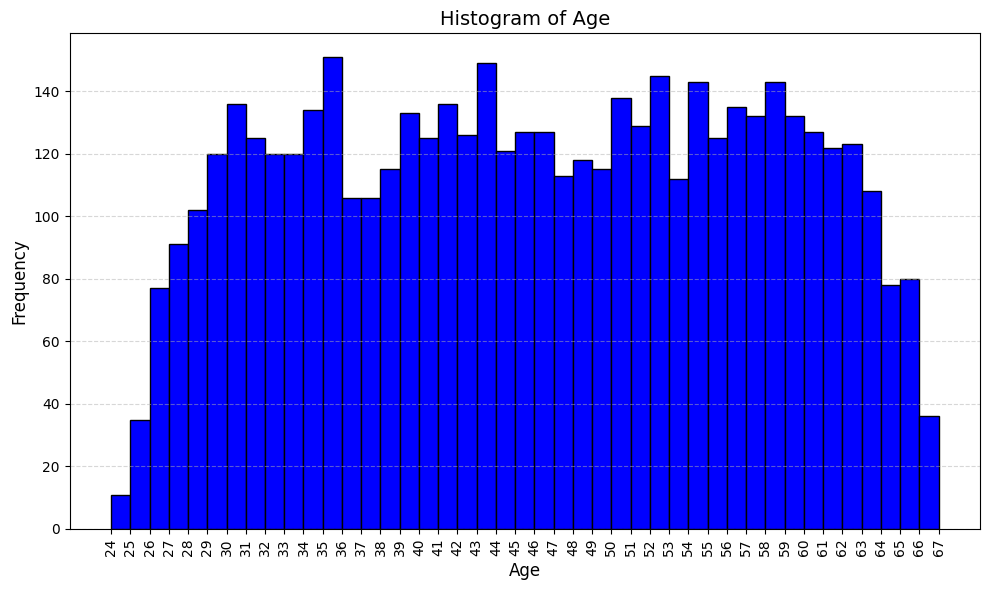

In [48]:
plot_histogram_chart(feature=df_bankloan['Age'], bins=43, feature_2=None, rotation=90, freq_norm=False, num_type=int, colormap="coolwarm", color="blue")

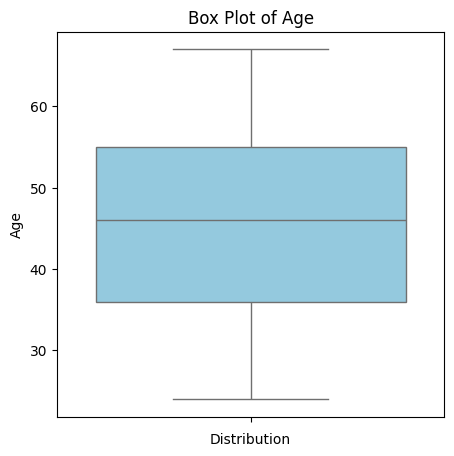

In [49]:
plot_boxplot_chart(feature_1=df_bankloan['Age'], feature_2=None, palette='coolwarm', color='skyblue', orient='v', notch=False)

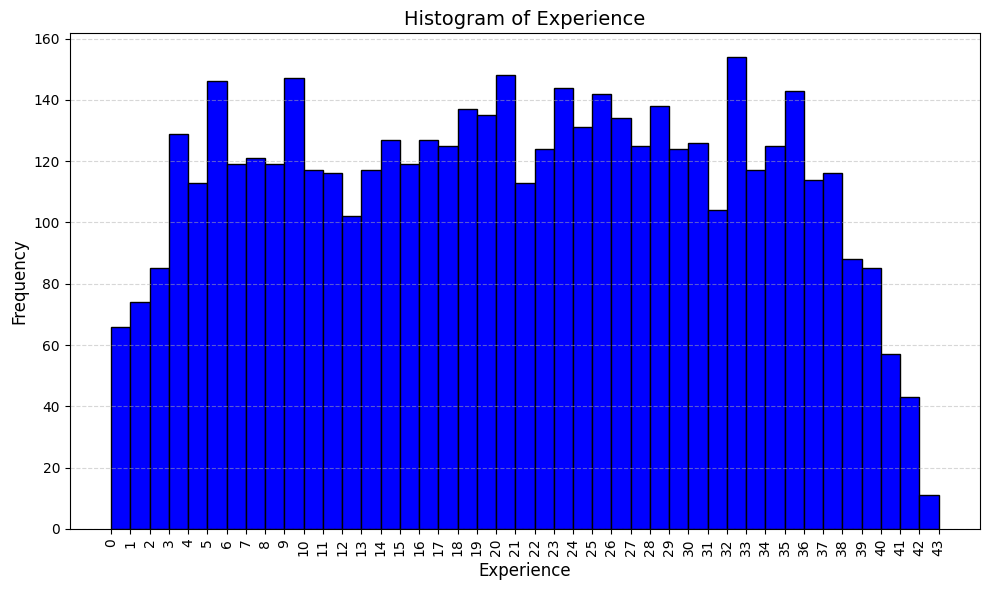

In [50]:
plot_histogram_chart(feature=df_bankloan['Experience'], bins=43, feature_2=None, rotation=90, freq_norm=False, num_type=int, colormap="coolwarm", color="blue")

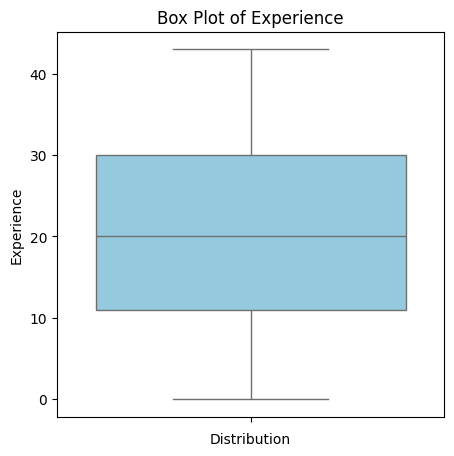

In [51]:
plot_boxplot_chart(feature_1=df_bankloan['Experience'], feature_2=None, palette='coolwarm', color='skyblue', orient='v', notch=False)

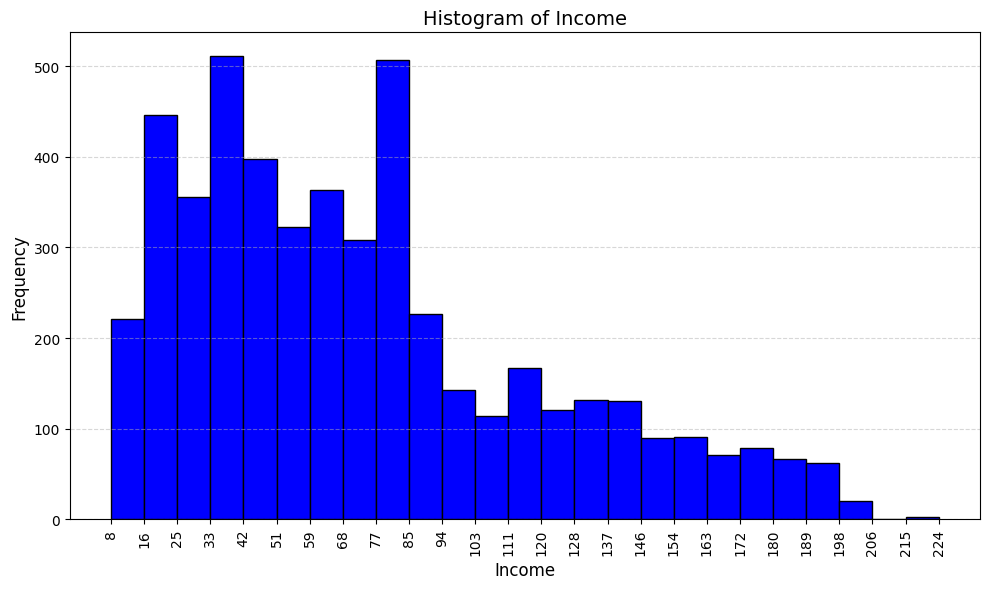

In [52]:
plot_histogram_chart(feature=df_bankloan['Income'], bins=25, feature_2=None, rotation=90, freq_norm=False, num_type=int, colormap="coolwarm", color="blue")

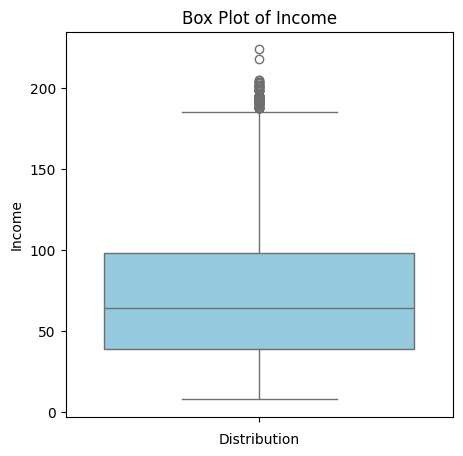

In [53]:
plot_boxplot_chart(feature_1=df_bankloan['Income'], feature_2=None, palette='coolwarm', color='skyblue', orient='v', notch=False)

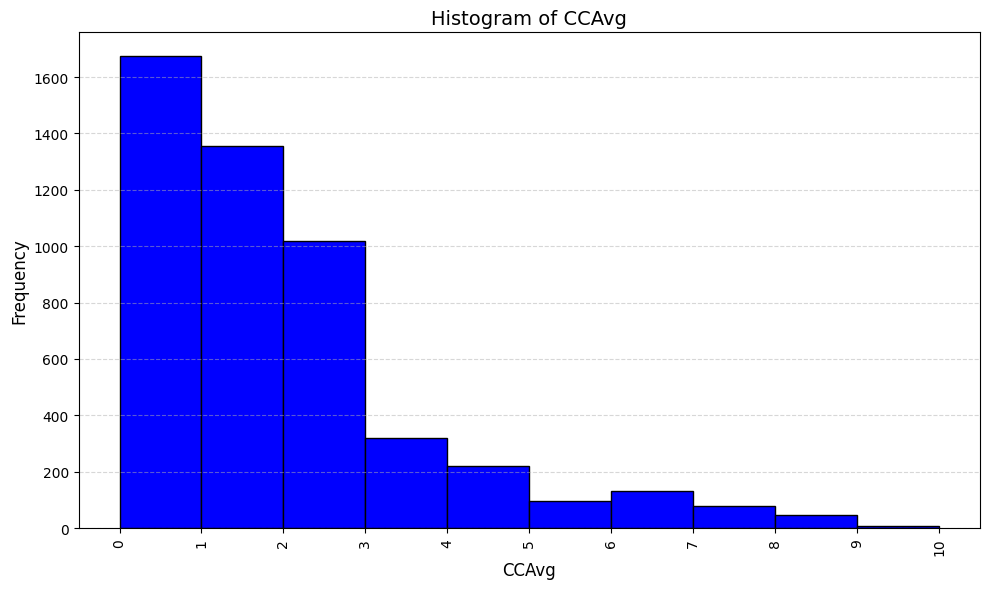

In [54]:
plot_histogram_chart(feature=df_bankloan['CCAvg'], bins=10, feature_2=None, rotation=90, freq_norm=False, num_type=int, colormap="coolwarm", color="blue")

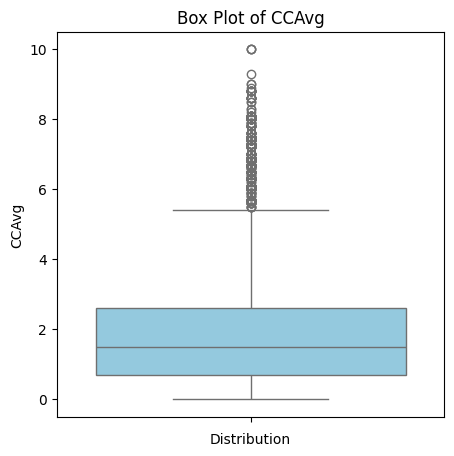

In [55]:
plot_boxplot_chart(feature_1=df_bankloan['CCAvg'], feature_2=None, palette='coolwarm', color='skyblue', orient='v', notch=False)

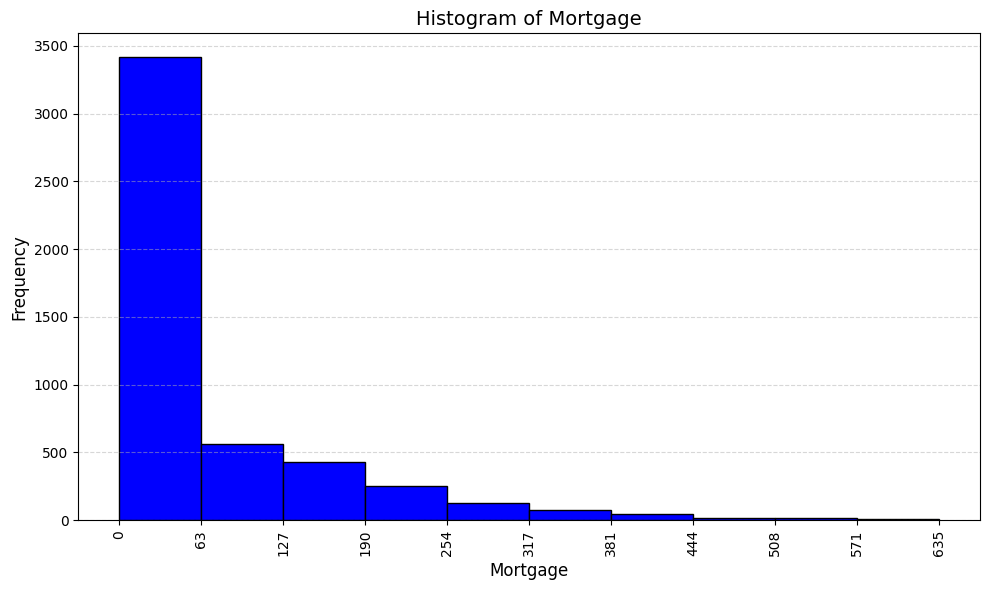

In [56]:
plot_histogram_chart(feature=df_bankloan['Mortgage'], bins=10, feature_2=None, rotation=90, freq_norm=False, num_type=int, colormap="coolwarm", color="blue")

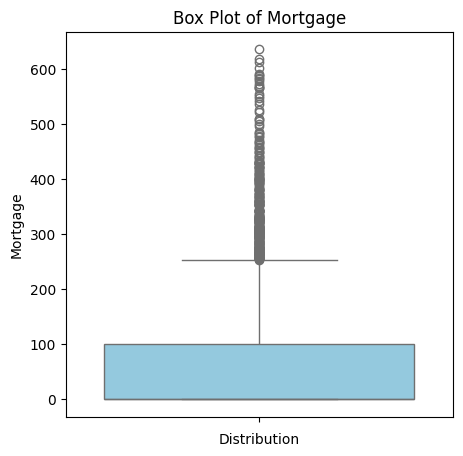

In [57]:
plot_boxplot_chart(feature_1=df_bankloan['Mortgage'], feature_2=None, palette='coolwarm', color='skyblue', orient='v', notch=False)

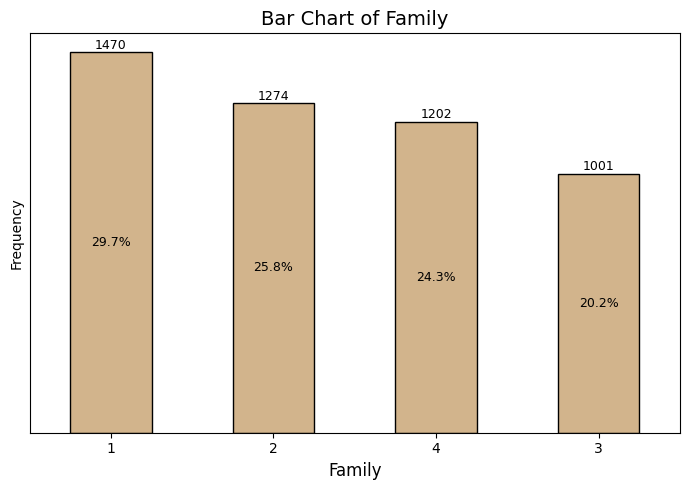

In [58]:
plot_bar_chart(feature=df_bankloan['Family'], feature_2=None, normalize=False, rotation=0, colormap='coolwarm', color='tan')

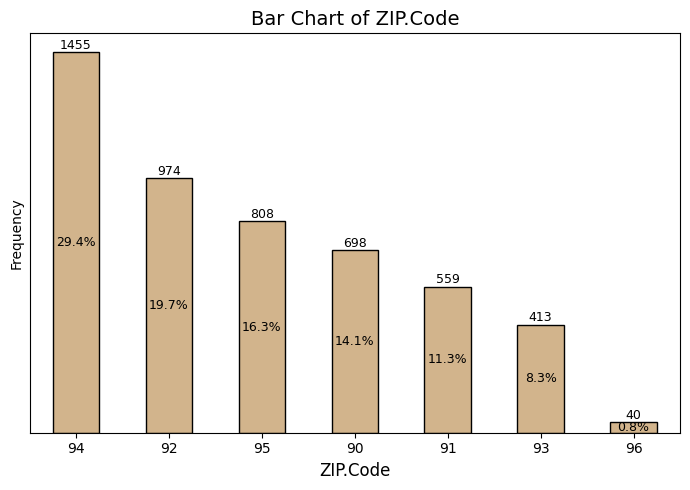

In [59]:
plot_bar_chart(feature=df_bankloan['ZIP.Code'], feature_2=None, normalize=False, rotation=0, colormap='coolwarm', color='tan')

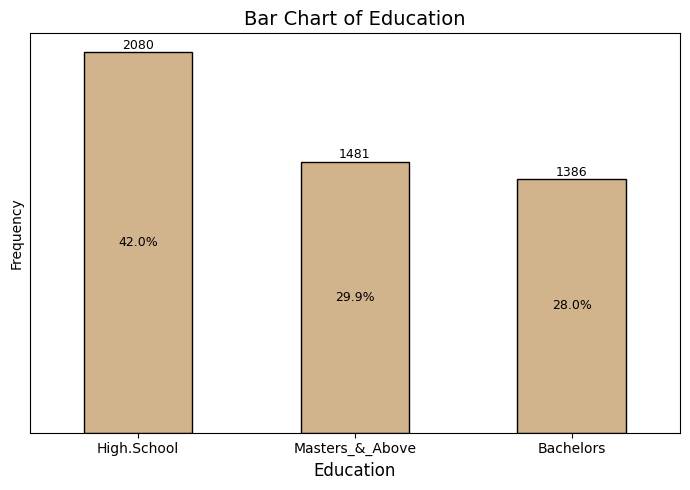

In [60]:
plot_bar_chart(feature=df_bankloan['Education'], feature_2=None, normalize=False, rotation=0, colormap='coolwarm', color='tan')

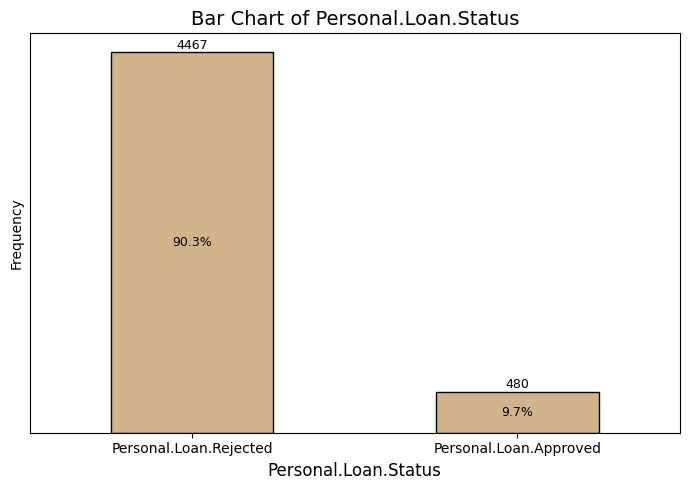

In [61]:
plot_bar_chart(feature=df_bankloan['Personal.Loan.Status'], feature_2=None, normalize=False, rotation=0, colormap='coolwarm', color='tan')

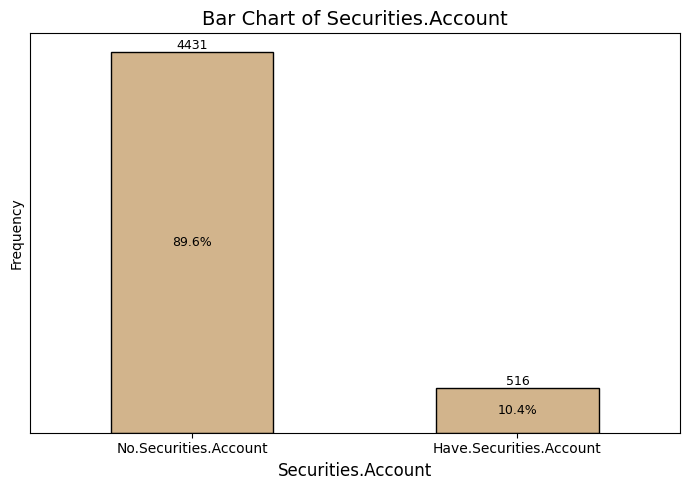

In [62]:
plot_bar_chart(feature=df_bankloan['Securities.Account'], feature_2=None, normalize=False, rotation=0, colormap='coolwarm', color='tan')

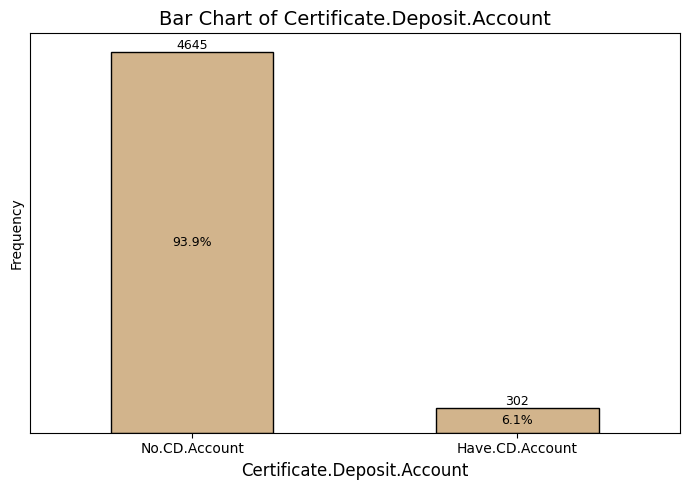

In [63]:
plot_bar_chart(feature=df_bankloan['Certificate.Deposit.Account'], feature_2=None, normalize=False, rotation=0, colormap='coolwarm', color='tan')

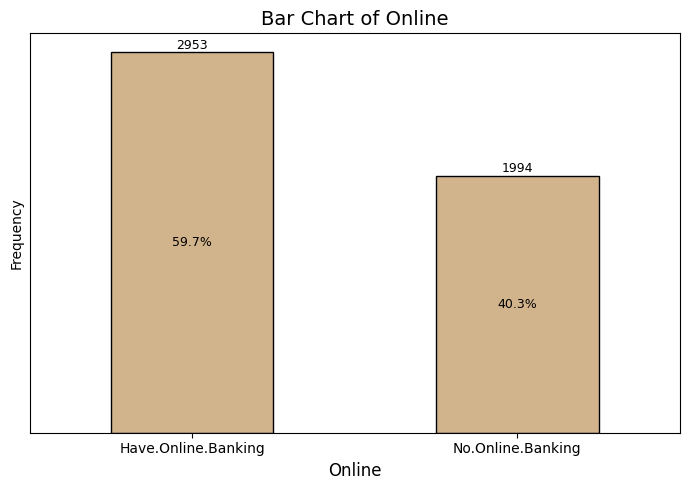

In [64]:
plot_bar_chart(feature=df_bankloan['Online'], feature_2=None, normalize=False, rotation=0, colormap='coolwarm', color='tan')

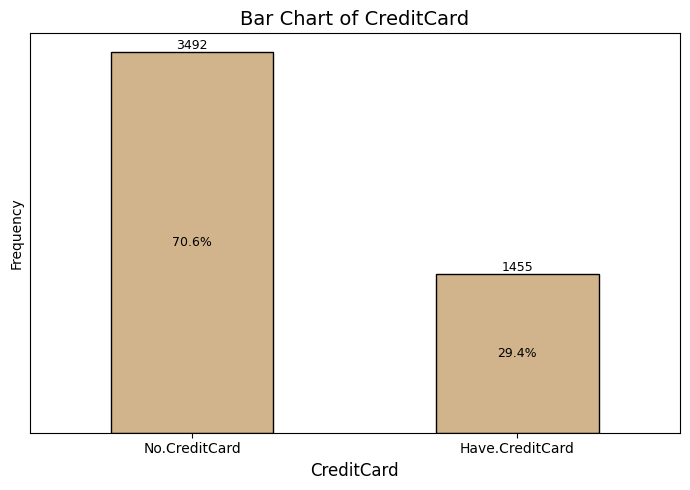

In [65]:
plot_bar_chart(feature=df_bankloan['CreditCard'], feature_2=None, normalize=False, rotation=0, colormap='coolwarm', color='tan')

# The Outliers are removed with Robust Z-Score (Modified Z-Score) Method which is robust to skewed distribution

---

# The univariate analysis will be checked again to determine if any undesired changes has occured in the features

In [66]:
# Function to calculate modified Z-score and remove outliers
def remove_outliers_modified_zscore(df, column, threshold=3.5):
    # Calculate median and MAD
    median = df[column].median()
    mad = np.median(np.abs(df[column] - median))
    
    # Avoid division by zero
    if mad == 0:
        mad = 1e-10  # Small constant to prevent division by zero
    
    # Calculate modified Z-score
    modified_z_scores = 0.6745 * (df[column] - median) / mad
    
    # Keep rows where absolute modified Z-score is below threshold
    df_filtered = df[modified_z_scores.abs() <= threshold]
    return df_filtered


df_bankloan_w_Mort_n_Inc = df_bankloan.copy()

# Check the number of rows before removing outliers
initial_rows = len(df_bankloan_w_Mort_n_Inc)
print(f"Number of rows before removing outliers: {initial_rows}")

# Remove outliers in 'Mortgage'
df_bankloan_w_Mort_n_Inc = remove_outliers_modified_zscore(df_bankloan_w_Mort_n_Inc, 'Mortgage', threshold=3.5)

# Check the number of rows after removing 'Mortgage' outliers
rows_after_mortgage = len(df_bankloan_w_Mort_n_Inc)
print(f"Number of rows after removing 'Mortgage' outliers: {rows_after_mortgage}")

# Remove outliers in 'Income'
df_bankloan_w_Mort_n_Inc = remove_outliers_modified_zscore(df_bankloan_w_Mort_n_Inc, 'Income', threshold=3.5)

# Check the number of rows after removing 'Income' outliers
rows_after_income = len(df_bankloan_w_Mort_n_Inc)
print(f"Number of rows after removing 'Income' outliers: {rows_after_income}")

Number of rows before removing outliers: 4947
Number of rows after removing 'Mortgage' outliers: 3421
Number of rows after removing 'Income' outliers: 3419


In [67]:
df_bankloan_w_Mort_n_Inc.describe()

,Age,Experience,Income,Family,CCAvg,Mortgage
count,3419.00,3419.00,3419.00,3419.00,3419.00,3419.00
mean,45.66,20.42,73.84,2.39,1.95,0.00
std,11.32,11.32,45.44,1.15,1.75,0.00
min,24.00,0.00,8.00,1.00,0.00,0.00
25%,36.00,11.00,39.00,1.00,0.70,0.00
50%,46.00,20.00,64.00,2.00,1.60,0.00
75%,55.00,30.00,98.50,3.00,2.60,0.00
max,67.00,43.00,204.00,4.00,10.00,0.00


# Insight after removing outliers
- The `Mortgage` feature has been reduced to people without mortgage `0`, with the **"min"** being `0` and **"max"** being `0`, after the outliers from both the `Mortgage` and `Income` is removed. Hence, The `Mortgage` will have to be dropped, unless `Mortgage` is feature engineered.  
- To prevent removing the `Mortgage` feature, the Mortgage will be changed to categorical feature, with `0` as applicants without mortage, `No.Mortgage` and values greater than `0` as applicants with Mortgage, `Have.Mortgage`.

---

- The `Income` and the `CCAvg`outliers will be removed without removing the outliers from `Mortgage` to recheck the features description and distribution. 
- After the `Income` and the `CCAvg`outliers were removed, the `Mortgage` feature has other values other than `0`. Hence, the `Mortgage` feature will be categorized, and renamed `Mortgage.Category` while the existing `Mortgage` will be dropped after it has been engineered.

In [68]:
# Create a copy of the DataFrame
df_bankloan_w_Inc = df_bankloan.copy()

# Check the number of rows before removing outliers
initial_rows = len(df_bankloan_w_Inc)
print(f"Number of rows before removing outliers: {initial_rows}")

# Remove outliers in 'Income'
df_bankloan_w_Inc = remove_outliers_modified_zscore(df_bankloan_w_Inc, 'Income', threshold=3.5)

# Reset the index after outlier removal
df_bankloan_w_Inc = df_bankloan_w_Inc.reset_index(drop=True)

# Check the number of rows after removing 'Income' outliers
rows_after_income = len(df_bankloan_w_Inc)
print(f"Number of rows after removing 'Income' outliers: {rows_after_income}")

Number of rows before removing outliers: 4947
Number of rows after removing 'Income' outliers: 4945


In [69]:
# Create a copy of the DataFrame
df_bankloan_w_CCAvg = df_bankloan_w_Inc.copy()

# Check the number of rows before removing outliers
initial_rows2 = len(df_bankloan_w_CCAvg)
print(f"Number of rows before removing outliers: {initial_rows2}")

# Remove outliers in 'Credit Card Average Score'
df_bankloan_w_CCAvg = remove_outliers_modified_zscore(df_bankloan_w_CCAvg, 'CCAvg', threshold=3.5)

# Reset the index after outlier removal
df_bankloan_w_CCAvg = df_bankloan_w_CCAvg.reset_index(drop=True)

# Check the number of rows after removing 'Credit Card Average Score' outliers
rows_after_income2 = len(df_bankloan_w_CCAvg)
print(f"Number of rows after removing 'Credit Card Average Score' outliers: {rows_after_income2}")

Number of rows before removing outliers: 4945
Number of rows after removing 'Credit Card Average Score' outliers: 4725


In [70]:
df_bankloan_w_CCAvg.describe()

,Age,Experience,Income,Family,CCAvg,Mortgage
count,4725.00,4725.00,4725.00,4725.00,4725.00,4725.00
mean,45.64,20.41,69.73,2.41,1.68,55.10
std,11.36,11.36,42.70,1.16,1.32,97.84
min,24.00,0.00,8.00,1.00,0.00,0.00
25%,36.00,11.00,38.00,1.00,0.60,0.00
50%,46.00,21.00,61.00,2.00,1.50,0.00
75%,56.00,30.00,91.00,4.00,2.40,101.00
max,67.00,43.00,204.00,4.00,6.10,617.00


In [71]:
df_bankloan_w_CCAvg.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4725 entries, 0 to 4724
Data columns (total 13 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Age                          4725 non-null   int64  
 1   Experience                   4725 non-null   int64  
 2   Income                       4725 non-null   int64  
 3   ZIP.Code                     4725 non-null   object 
 4   Family                       4725 non-null   int64  
 5   CCAvg                        4725 non-null   float64
 6   Education                    4725 non-null   object 
 7   Mortgage                     4725 non-null   int64  
 8   Personal.Loan.Status         4725 non-null   object 
 9   Securities.Account           4725 non-null   object 
 10  Certificate.Deposit.Account  4725 non-null   object 
 11  Online                       4725 non-null   object 
 12  CreditCard                   4725 non-null   object 
dtypes: float64(1), int

The dataframe after the outliers from `Income` and the `CCAvg` are removed will be renamed as df_bankloan and the univariate analysis will be checked again to know if no unwanted changes occured in the features

In [72]:
df_bankloan = df_bankloan_w_CCAvg.copy()
df_bankloan.head()

,Age,Experience,Income,ZIP.Code,Family,CCAvg,Education,Mortgage,Personal.Loan.Status,Securities.Account,Certificate.Deposit.Account,Online,CreditCard
0,25,1,49,91,4,1.60,High.School,0,Personal.Loan.Rejected,Have.Securities.Account,No.CD.Account,No.Online.Banking,No.CreditCard
1,45,19,34,90,3,1.50,High.School,0,Personal.Loan.Rejected,Have.Securities.Account,No.CD.Account,No.Online.Banking,No.CreditCard
2,39,15,11,94,1,1.00,High.School,0,Personal.Loan.Rejected,No.Securities.Account,No.CD.Account,No.Online.Banking,No.CreditCard
3,35,9,100,94,1,2.70,Bachelors,0,Personal.Loan.Rejected,No.Securities.Account,No.CD.Account,No.Online.Banking,No.CreditCard
4,35,8,45,91,4,1.00,Bachelors,0,Personal.Loan.Rejected,No.Securities.Account,No.CD.Account,No.Online.Banking,Have.CreditCard


# Categorizing Mortage
- The `Mortgage` feature is dropped and the categorized `Mortgage` is named `Mortgage.Category`

In [73]:
# Create a new column 'Mortgage.Category' based on 'Mortgage' values
df_bankloan['Mortgage.Category'] = df_bankloan['Mortgage'].apply(
    lambda x: 'No.Mortgage' if x == 0 else 'Have.Mortgage'
)

# Verify the categorization
print(df_bankloan[['Mortgage', 'Mortgage.Category']].head())

# Drop the 'Mortgage' column
df_bankloan = df_bankloan.drop(columns=['Mortgage'])

# Verify the column was dropped
print("Columns in DataFrame after dropping 'Mortgage':")
print(df_bankloan.columns)

# Check the first few rows to confirm 'Mortgage.Category' remains
print("\nFirst few rows after dropping 'Mortgage':")
print(df_bankloan.head())

   Mortgage Mortgage.Category
0         0       No.Mortgage
1         0       No.Mortgage
2         0       No.Mortgage
3         0       No.Mortgage
4         0       No.Mortgage
Columns in DataFrame after dropping 'Mortgage':
Index(['Age', 'Experience', 'Income', 'ZIP.Code', 'Family', 'CCAvg',
       'Education', 'Personal.Loan.Status', 'Securities.Account',
       'Certificate.Deposit.Account', 'Online', 'CreditCard',
       'Mortgage.Category'],
      dtype='object')

First few rows after dropping 'Mortgage':
   Age  Experience  Income ZIP.Code  Family  CCAvg    Education  \
0   25           1      49       91       4   1.60  High.School   
1   45          19      34       90       3   1.50  High.School   
2   39          15      11       94       1   1.00  High.School   
3   35           9     100       94       1   2.70    Bachelors   
4   35           8      45       91       4   1.00    Bachelors   

     Personal.Loan.Status       Securities.Account  \
0  Personal.Loan.Rejecte

In [74]:
# Get the distribution of unique values in 'Mortgage_Category'
# Absolute counts
print("Absolute counts of Mortgage.Category:")
print(df_bankloan['Mortgage.Category'].value_counts())

# Relative frequencies (proportions)
print("\nRelative frequencies of Mortgage.Category:")
print(df_bankloan['Mortgage.Category'].value_counts(normalize=True))

Absolute counts of Mortgage.Category:
Mortgage.Category
No.Mortgage      3265
Have.Mortgage    1460
Name: count, dtype: int64

Relative frequencies of Mortgage.Category:
Mortgage.Category
No.Mortgage     0.69
Have.Mortgage   0.31
Name: proportion, dtype: float64


# **Reimplementation of the Univariate Analysis**

In [75]:
df_bankloan.describe()

,Age,Experience,Income,Family,CCAvg
count,4725.00,4725.00,4725.00,4725.00,4725.00
mean,45.64,20.41,69.73,2.41,1.68
std,11.36,11.36,42.70,1.16,1.32
min,24.00,0.00,8.00,1.00,0.00
25%,36.00,11.00,38.00,1.00,0.60
50%,46.00,21.00,61.00,2.00,1.50
75%,56.00,30.00,91.00,4.00,2.40
max,67.00,43.00,204.00,4.00,6.10


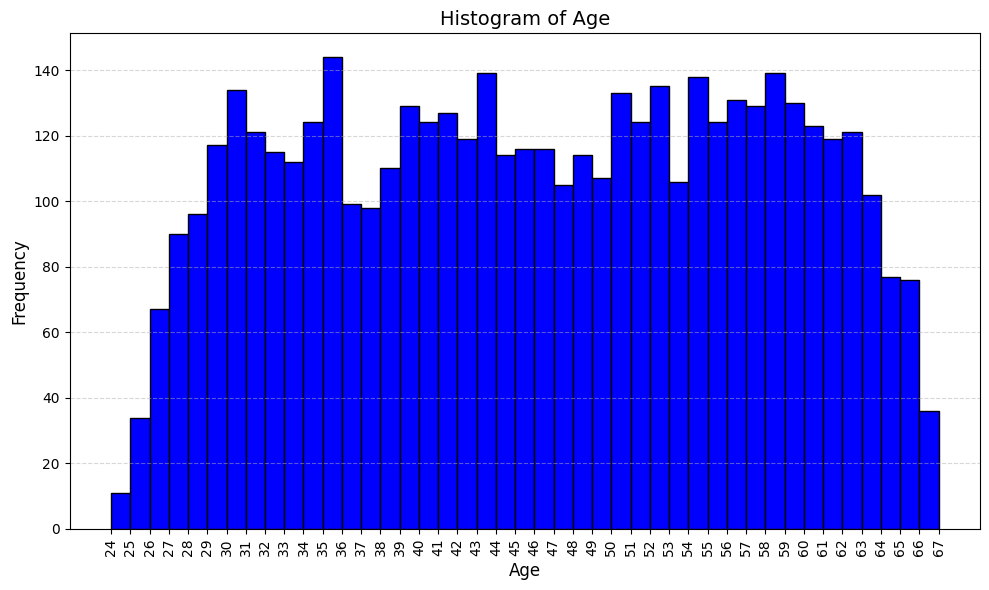

In [76]:
plot_histogram_chart(feature=df_bankloan['Age'], bins=43, feature_2=None, rotation=90, freq_norm=False, num_type=int, colormap="coolwarm", color="blue")

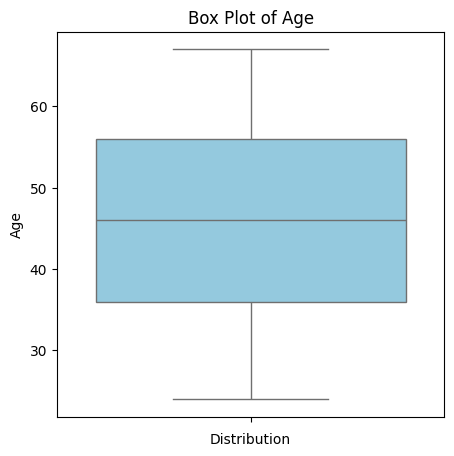

In [77]:
plot_boxplot_chart(feature_1=df_bankloan['Age'], feature_2=None, palette='coolwarm', color='skyblue', orient='v', notch=False)


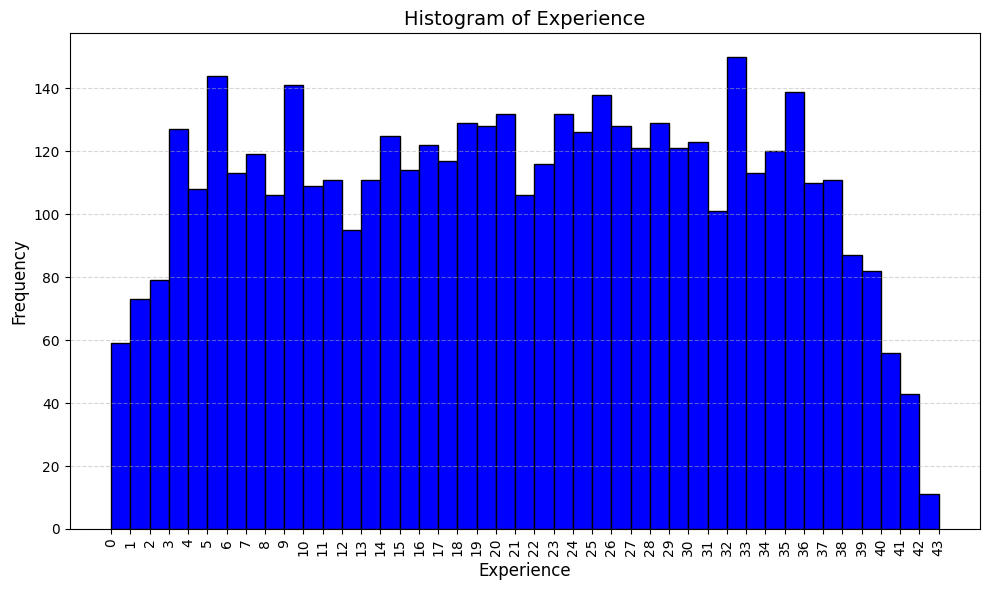

In [78]:
plot_histogram_chart(feature=df_bankloan['Experience'], bins=43, feature_2=None, rotation=90, freq_norm=False, num_type=int, colormap="coolwarm", color="blue")


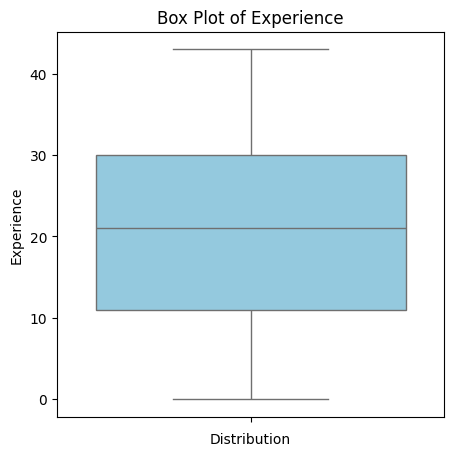

In [79]:
plot_boxplot_chart(feature_1=df_bankloan['Experience'], feature_2=None, palette='coolwarm', color='skyblue', orient='v', notch=False)


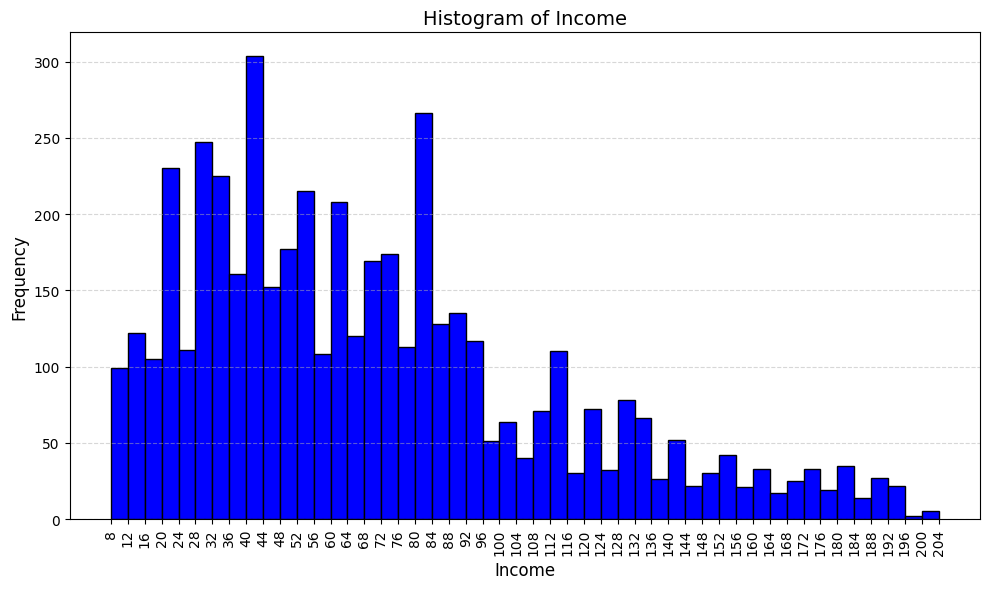

In [80]:
plot_histogram_chart(feature=df_bankloan['Income'], bins=49, feature_2=None, rotation=90, freq_norm=False, num_type=int, colormap="coolwarm", color="blue")


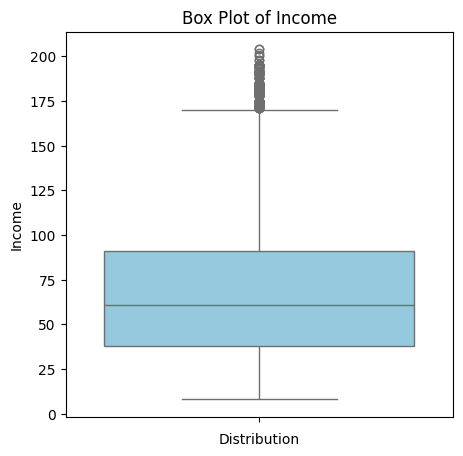

In [81]:
plot_boxplot_chart(feature_1=df_bankloan['Income'], feature_2=None, palette='coolwarm', color='skyblue', orient='v', notch=False)

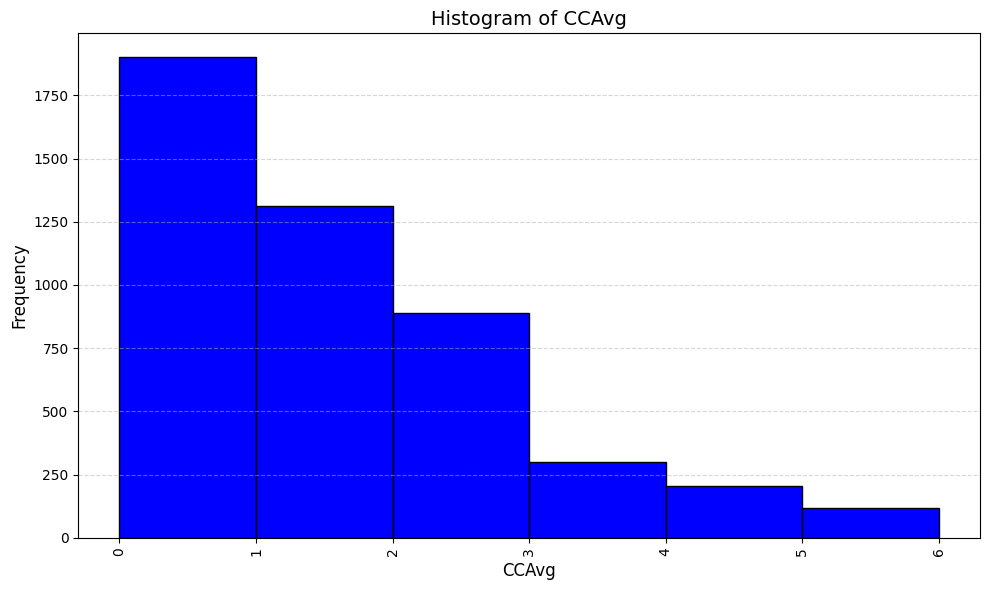

In [82]:
plot_histogram_chart(feature=df_bankloan['CCAvg'], bins=6, feature_2=None, rotation=90, freq_norm=False, num_type=int, colormap="coolwarm", color="blue")

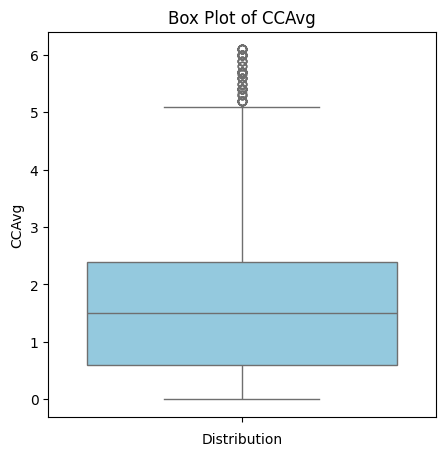

In [83]:
plot_boxplot_chart(feature_1=df_bankloan['CCAvg'], feature_2=None, palette='coolwarm', color='skyblue', orient='v', notch=False)

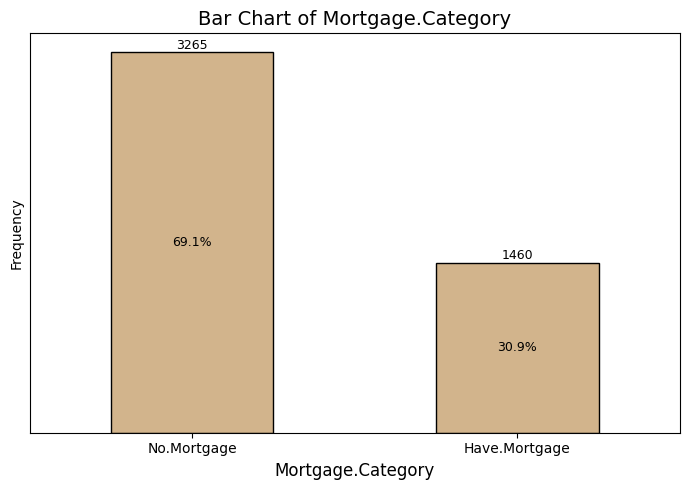

In [84]:
plot_bar_chart(feature=df_bankloan['Mortgage.Category'], feature_2=None, normalize=False, rotation=0, colormap='coolwarm', color='tan')

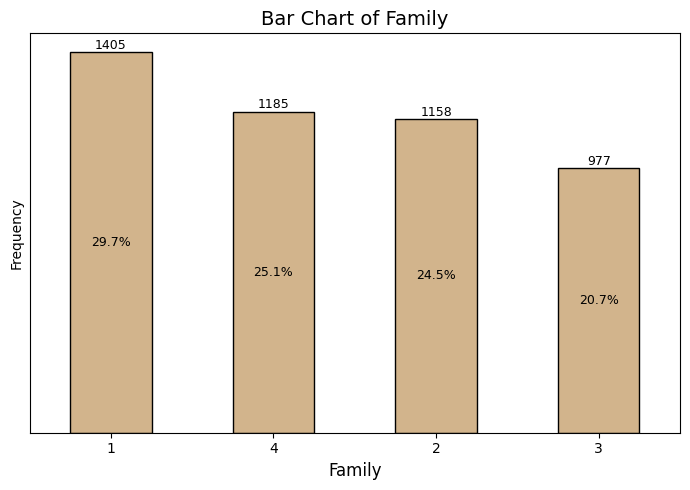

In [85]:
plot_bar_chart(feature=df_bankloan['Family'], feature_2=None, normalize=False, rotation=0, colormap='coolwarm', color='tan')

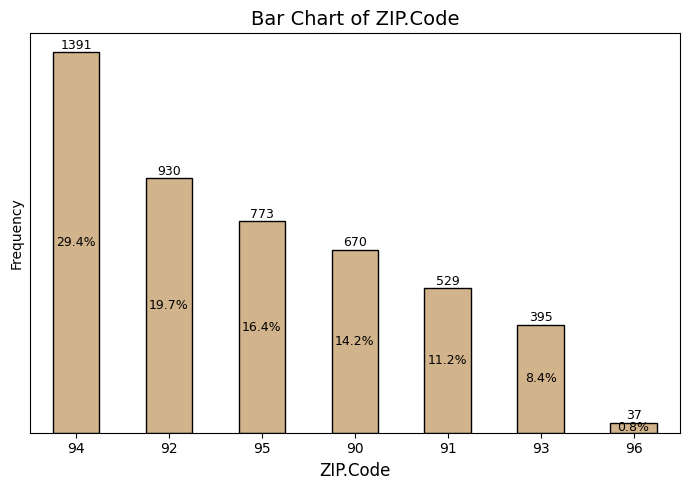

In [86]:
plot_bar_chart(feature=df_bankloan['ZIP.Code'], feature_2=None, normalize=False, rotation=0, colormap='coolwarm', color='tan')

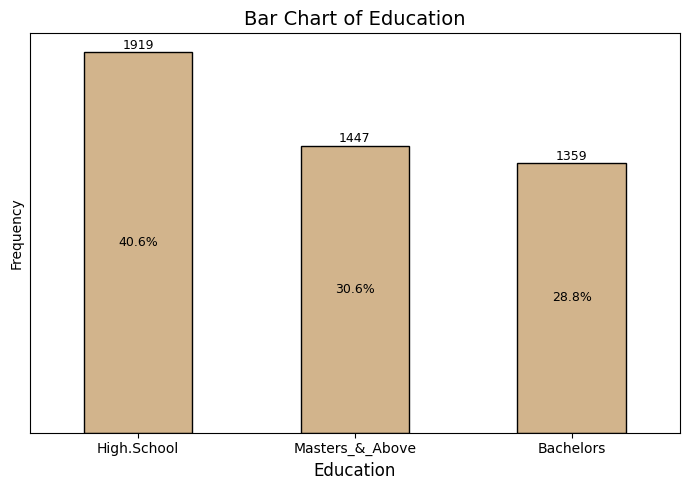

In [87]:
plot_bar_chart(feature=df_bankloan['Education'], feature_2=None, normalize=False, rotation=0, colormap='coolwarm', color='tan')

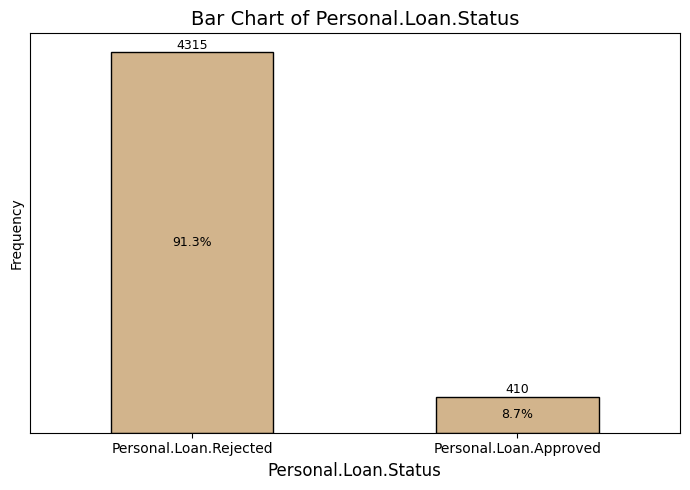

In [88]:
plot_bar_chart(feature=df_bankloan['Personal.Loan.Status'], feature_2=None, normalize=False, rotation=0, colormap='coolwarm', color='tan')

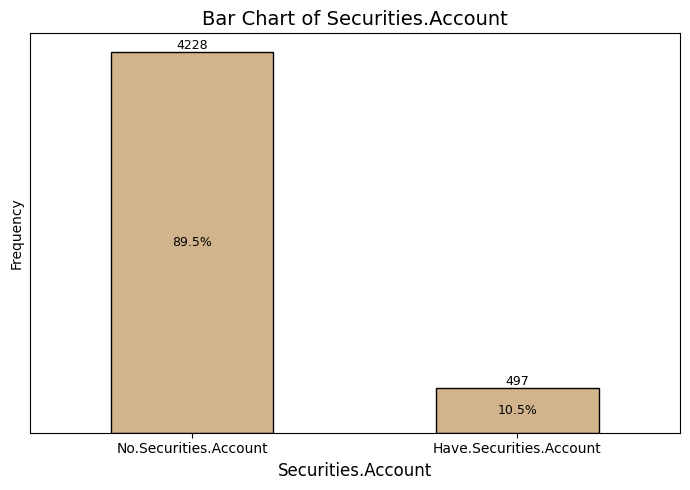

In [89]:
plot_bar_chart(feature=df_bankloan['Securities.Account'], feature_2=None, normalize=False, rotation=0, colormap='coolwarm', color='tan')

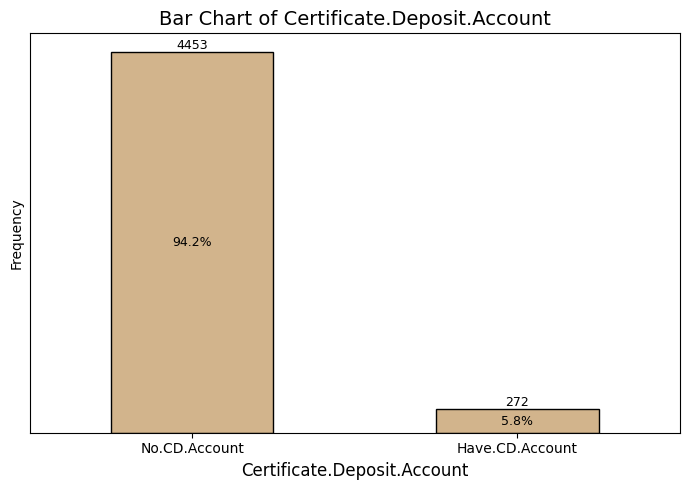

In [90]:
plot_bar_chart(feature=df_bankloan['Certificate.Deposit.Account'], feature_2=None, normalize=False, rotation=0, colormap='coolwarm', color='tan')

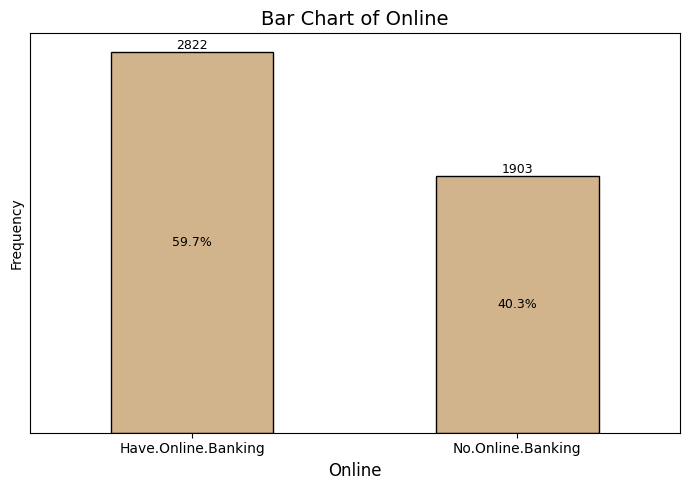

In [91]:
plot_bar_chart(feature=df_bankloan['Online'], feature_2=None, normalize=False, rotation=0, colormap='coolwarm', color='tan')

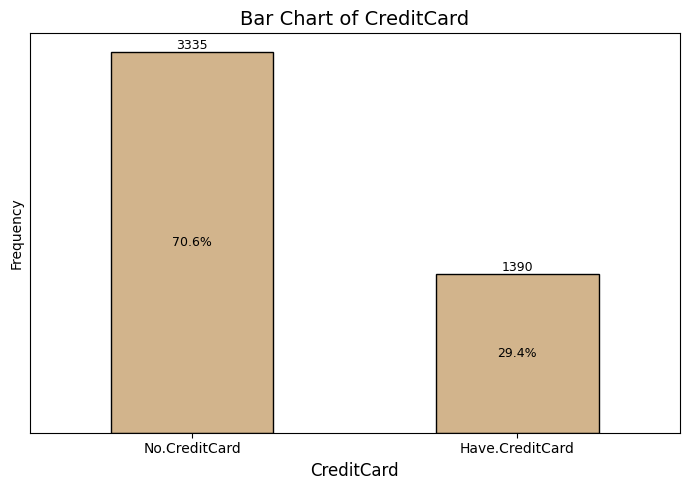

In [92]:
plot_bar_chart(feature=df_bankloan['CreditCard'], feature_2=None, normalize=False, rotation=0, colormap='coolwarm', color='tan')

- The univariate analysis was revisualized, and the insights confirm that removing outliers from CCAvg and Income had minimal impact on the distribution of other features.

# **Bivariate Analysis**
- The numerical features are visualized with the box plot and histrogram charts while the categorical features are visualized with bar chart. The independent features are hued with the target feature.
- The bivariate analysis is implemented to get insight regarding features with high or low predictive influence, hence, useful for feature selection decision
- Useful to get insight of the potential correlation between the features, especially from the scatter plot matrix chart

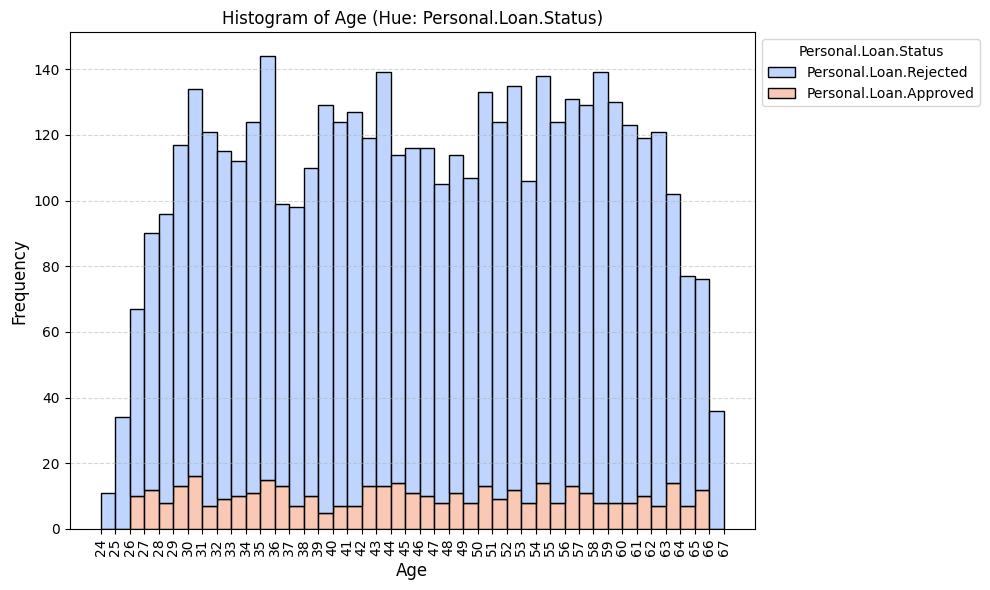

In [93]:
plot_histogram_chart(feature=df_bankloan['Age'], bins=43, feature_2=df_bankloan['Personal.Loan.Status'], rotation=90, freq_norm=False, num_type=int, 
                     colormap="coolwarm", color="blue")

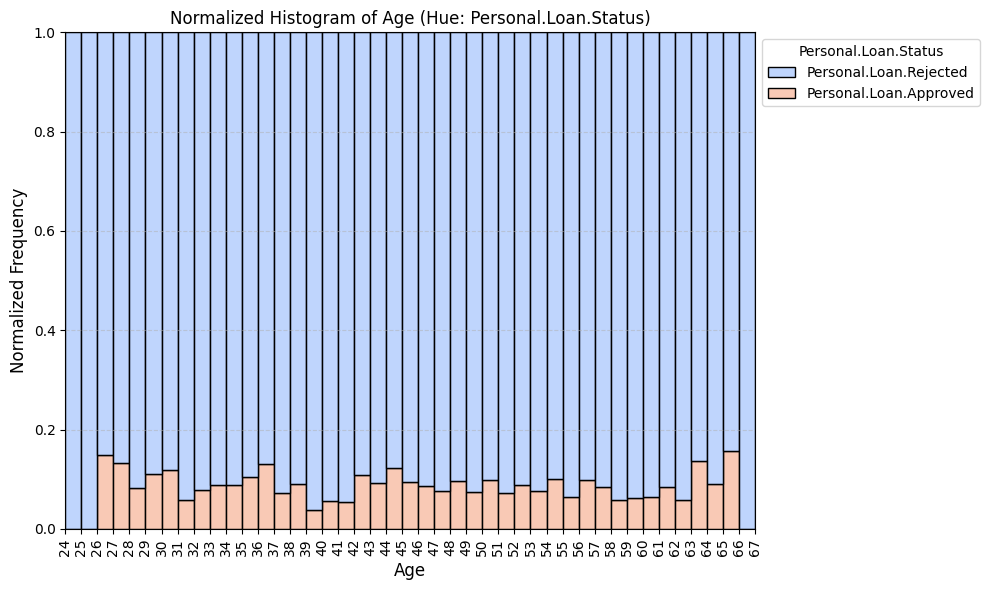

In [94]:
plot_histogram_chart(feature=df_bankloan['Age'], bins=43, feature_2=df_bankloan['Personal.Loan.Status'], rotation=90, freq_norm=True, 
                     num_type=int, colormap="coolwarm", color="blue")

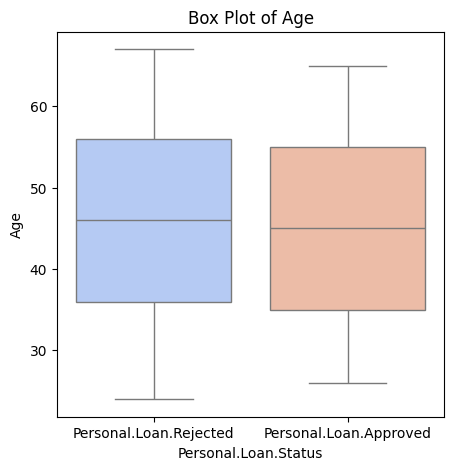

In [95]:
plot_boxplot_chart(feature_1=df_bankloan['Age'], feature_2=df_bankloan['Personal.Loan.Status'], color='skyblue', orient='v', notch=False)

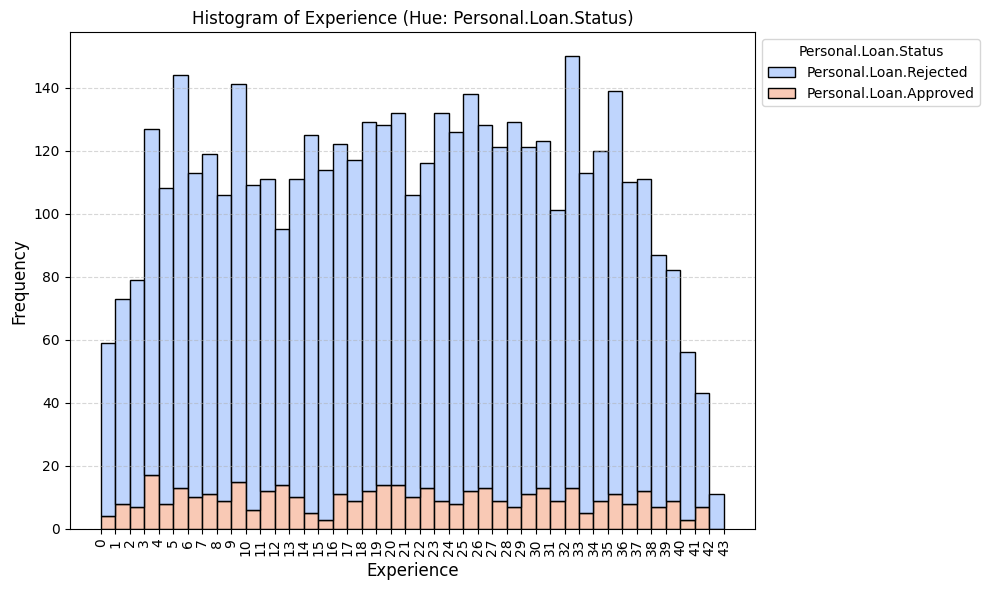

In [96]:
plot_histogram_chart(feature=df_bankloan['Experience'], bins=43, feature_2=df_bankloan['Personal.Loan.Status'], rotation=90, freq_norm=False, num_type=int, 
                     colormap="coolwarm", color="blue")

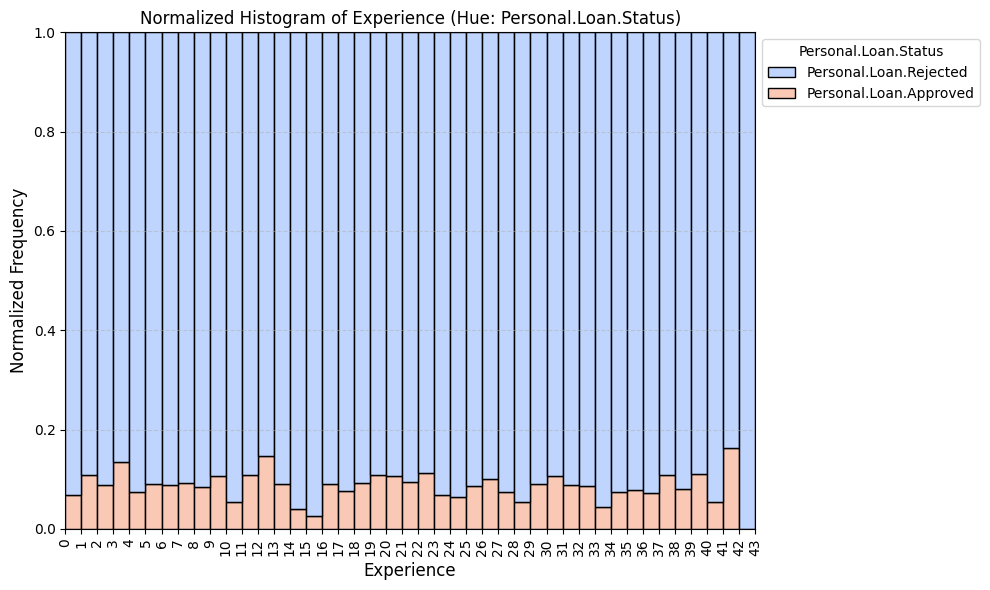

In [97]:
plot_histogram_chart(feature=df_bankloan['Experience'], bins=43, feature_2=df_bankloan['Personal.Loan.Status'], rotation=90, freq_norm=True, num_type=int, 
                     colormap="coolwarm", color="blue")

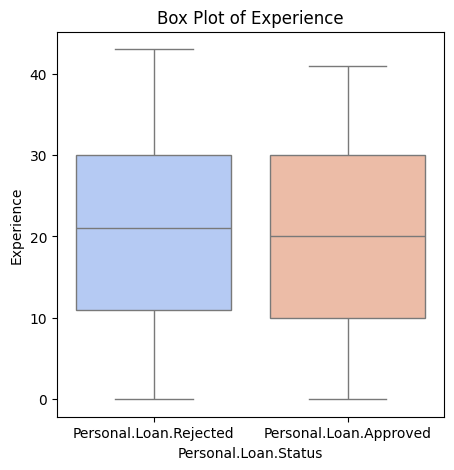

In [98]:
plot_boxplot_chart(feature_1=df_bankloan['Experience'], feature_2=df_bankloan['Personal.Loan.Status'], palette='coolwarm', 
                   color='skyblue', orient='v', notch=False)

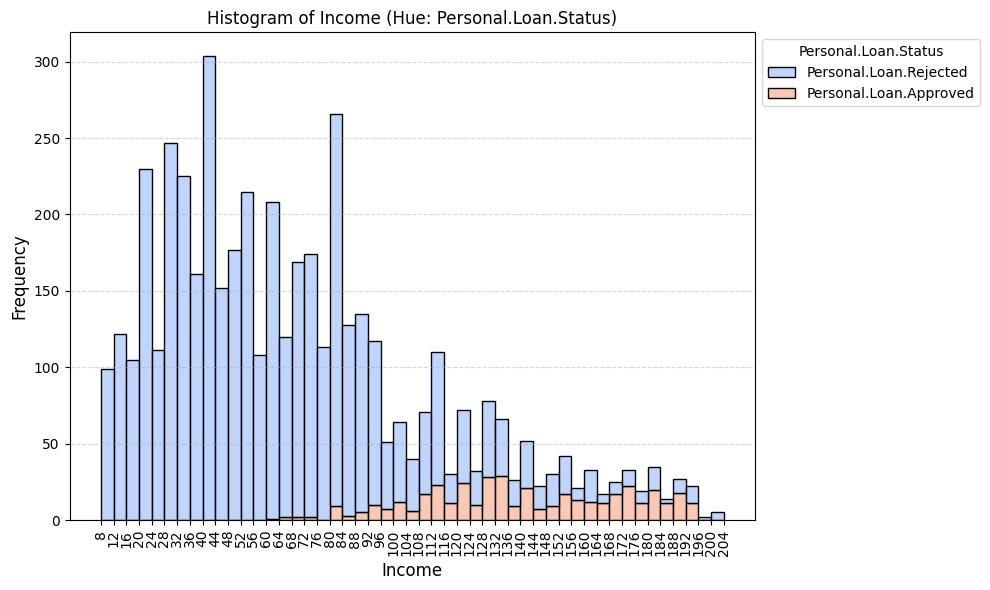

In [99]:
plot_histogram_chart(feature=df_bankloan['Income'], bins=49, feature_2=df_bankloan['Personal.Loan.Status'], rotation=90, freq_norm=False, num_type=int, 
                     colormap="coolwarm", color="blue")

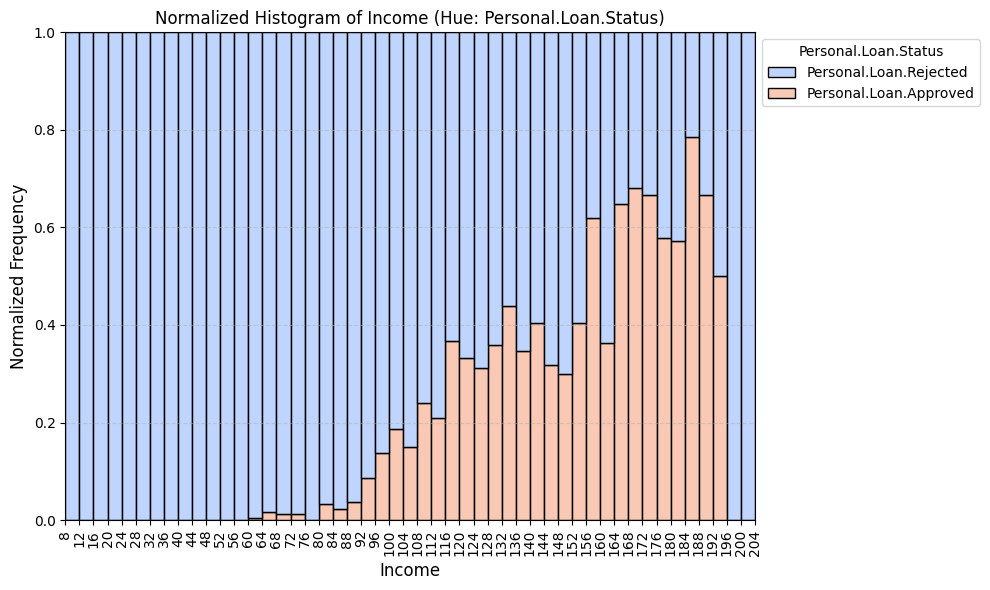

In [100]:
plot_histogram_chart(feature=df_bankloan['Income'], bins=49, feature_2=df_bankloan['Personal.Loan.Status'], rotation=90, freq_norm=True, num_type=int, 
                     colormap="coolwarm", color="blue")

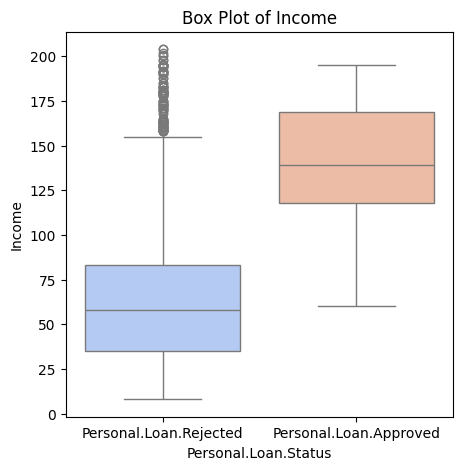

In [101]:
plot_boxplot_chart(feature_1=df_bankloan['Income'], feature_2=df_bankloan['Personal.Loan.Status'], palette='coolwarm', 
                   color='skyblue', orient='v', notch=False)

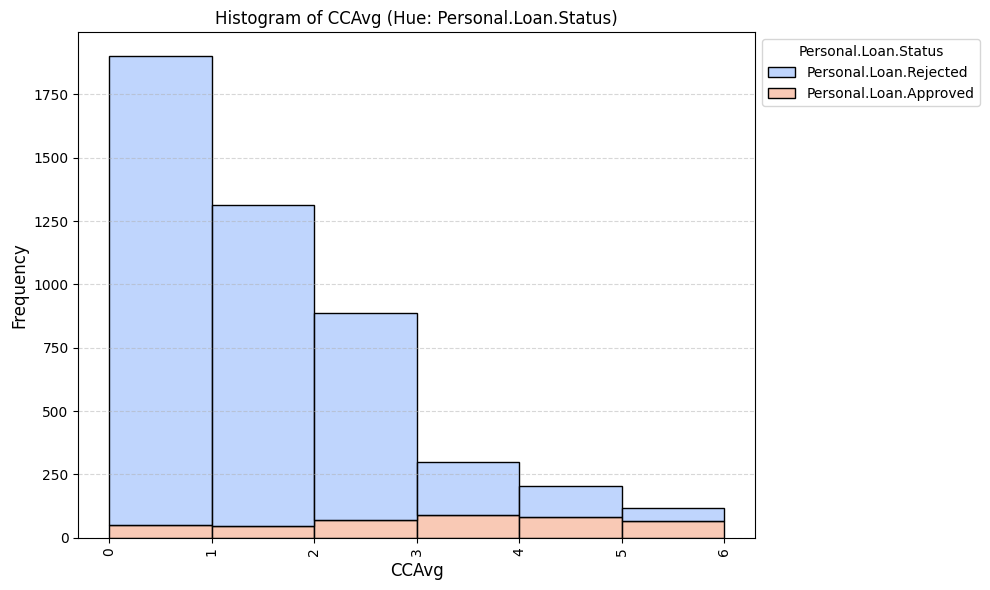

In [102]:
plot_histogram_chart(feature=df_bankloan['CCAvg'], bins=6, feature_2=df_bankloan['Personal.Loan.Status'], rotation=90, freq_norm=False, num_type=int, 
                     colormap="coolwarm", color="blue")

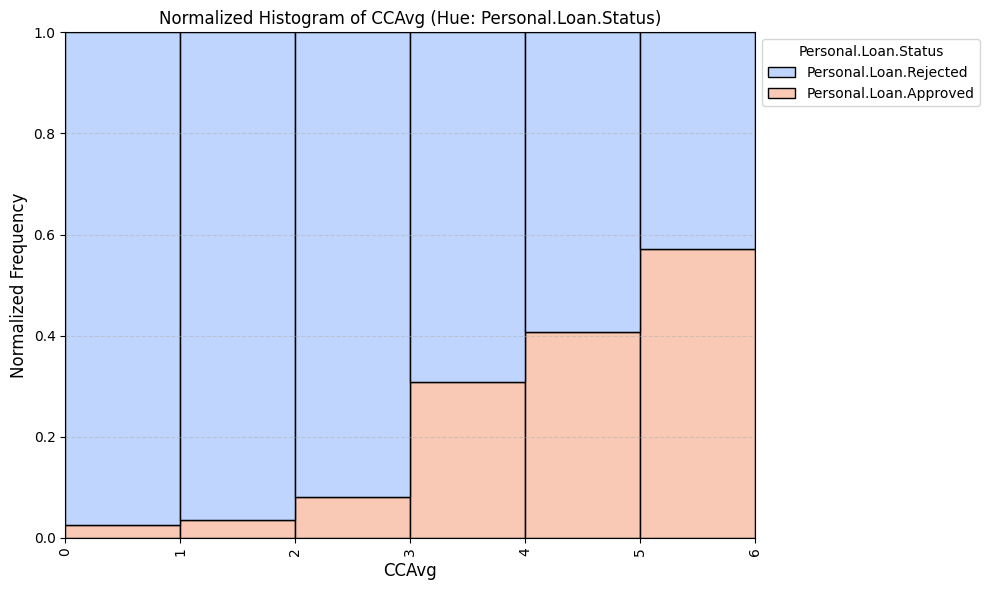

In [103]:
plot_histogram_chart(feature=df_bankloan['CCAvg'], bins=6, feature_2=df_bankloan['Personal.Loan.Status'], rotation=90, freq_norm=True, num_type=int, 
                     colormap="coolwarm", color="blue")

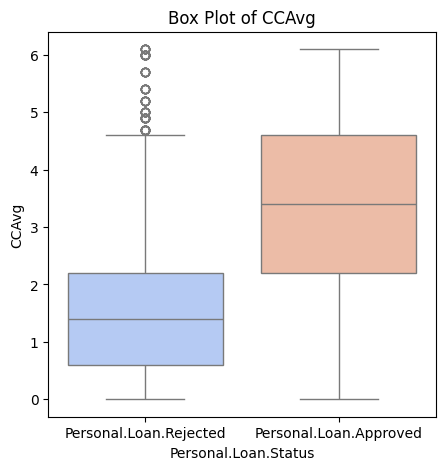

In [104]:
plot_boxplot_chart(feature_1=df_bankloan['CCAvg'], feature_2=df_bankloan['Personal.Loan.Status'], palette='coolwarm', 
                   color='skyblue', orient='v', notch=False)

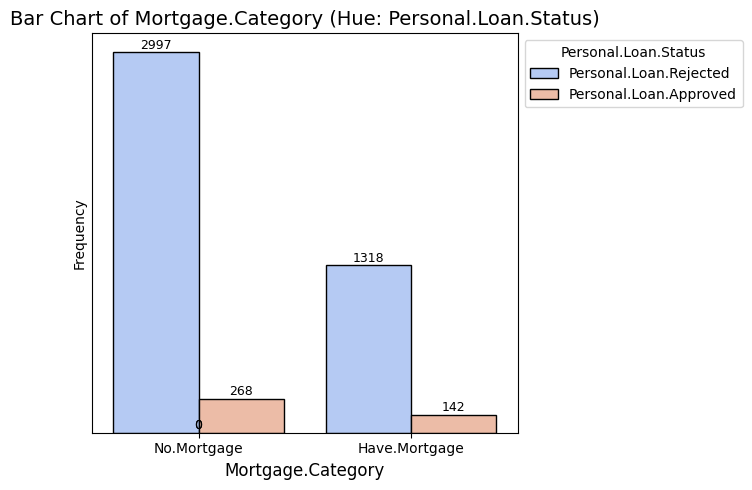

In [105]:
plot_bar_chart(feature=df_bankloan['Mortgage.Category'], feature_2=df_bankloan['Personal.Loan.Status'], normalize=False, 
               rotation=0, colormap='coolwarm', color='tan')

<Figure size 700x500 with 0 Axes>

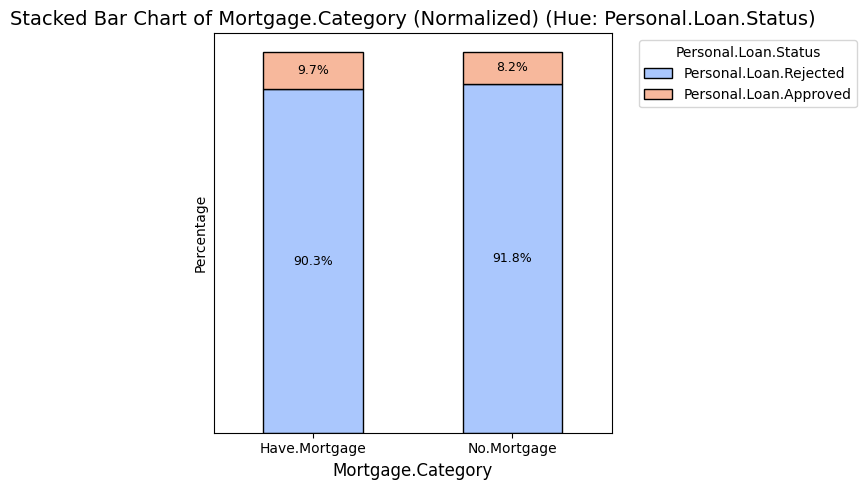

In [106]:
plot_bar_chart(feature=df_bankloan['Mortgage.Category'], feature_2=df_bankloan['Personal.Loan.Status'], normalize=True, 
               rotation=0, colormap='coolwarm', color='tan')

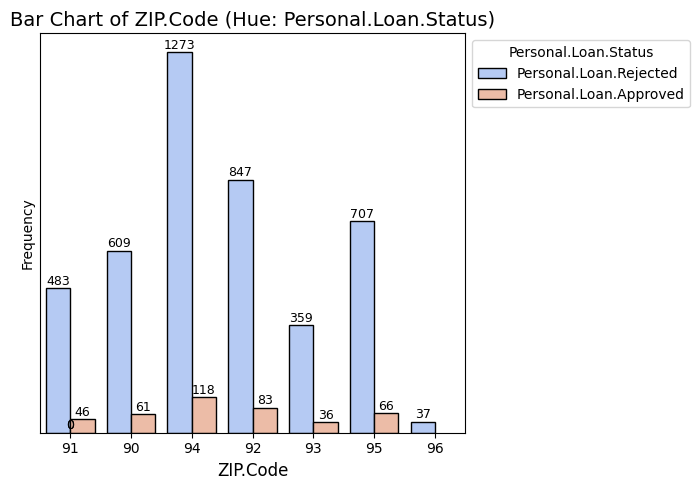

In [107]:
plot_bar_chart(feature=df_bankloan['ZIP.Code'], feature_2=df_bankloan['Personal.Loan.Status'], normalize=False, rotation=0, colormap='coolwarm', color='tan')

<Figure size 700x500 with 0 Axes>

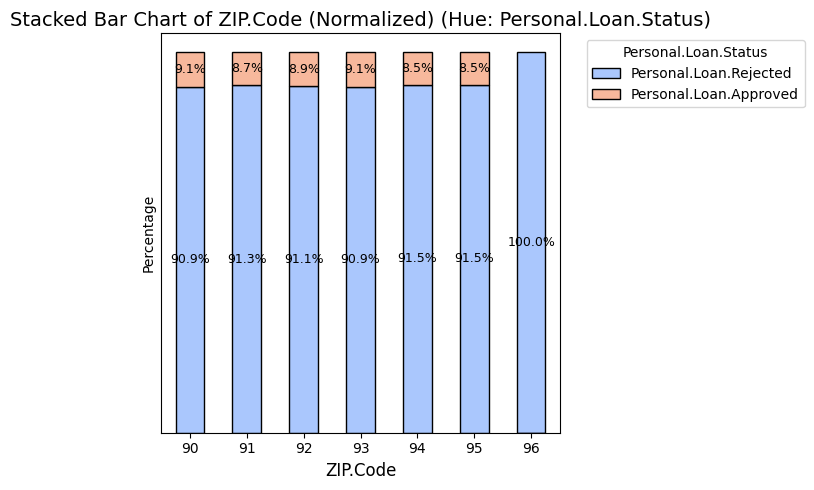

In [108]:
plot_bar_chart(feature=df_bankloan['ZIP.Code'], feature_2=df_bankloan['Personal.Loan.Status'], normalize=True, rotation=0, colormap='coolwarm', color='tan')

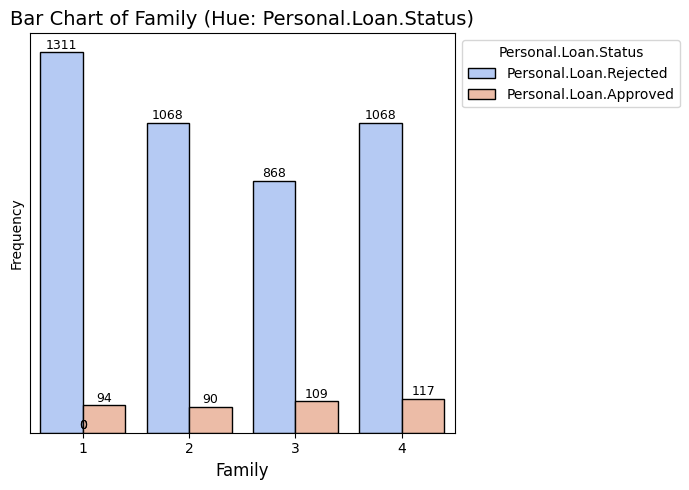

In [109]:
plot_bar_chart(feature=df_bankloan['Family'], feature_2=df_bankloan['Personal.Loan.Status'], normalize=False, rotation=0, colormap='coolwarm', color='tan')

<Figure size 700x500 with 0 Axes>

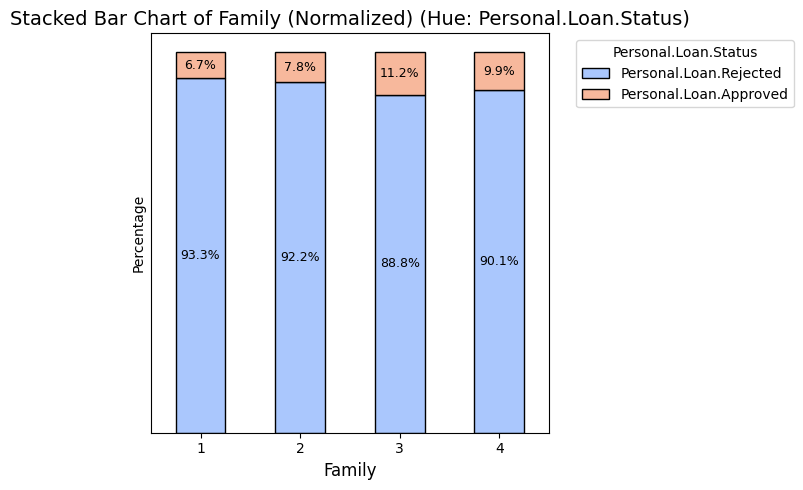

In [110]:
plot_bar_chart(feature=df_bankloan['Family'], feature_2=df_bankloan['Personal.Loan.Status'], normalize=True, rotation=0, colormap='coolwarm', color='tan')

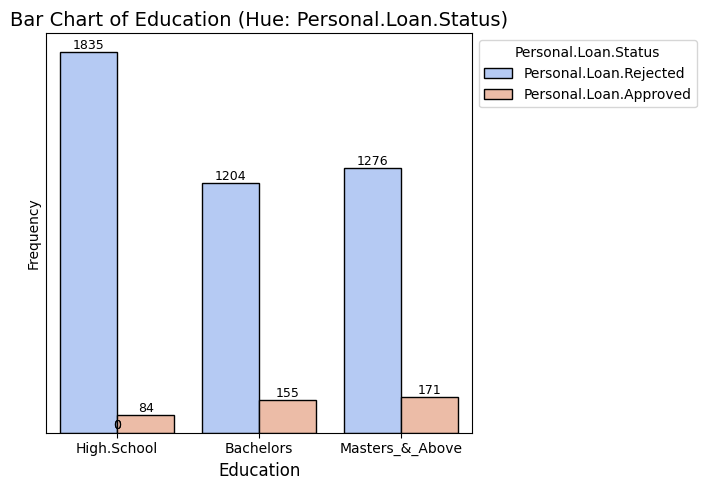

In [111]:
plot_bar_chart(feature=df_bankloan['Education'], feature_2=df_bankloan['Personal.Loan.Status'], normalize=False, rotation=0, colormap='coolwarm', color='tan')

<Figure size 700x500 with 0 Axes>

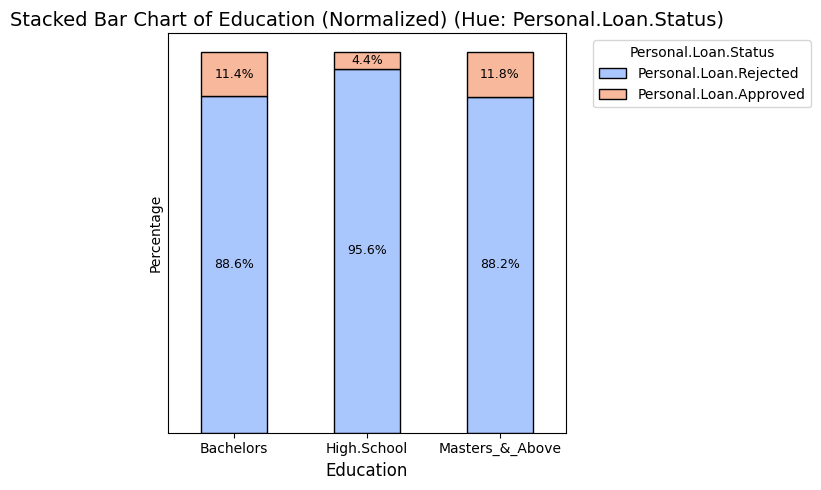

In [112]:
plot_bar_chart(feature=df_bankloan['Education'], feature_2=df_bankloan['Personal.Loan.Status'], normalize=True, rotation=0, colormap='coolwarm', color='tan')

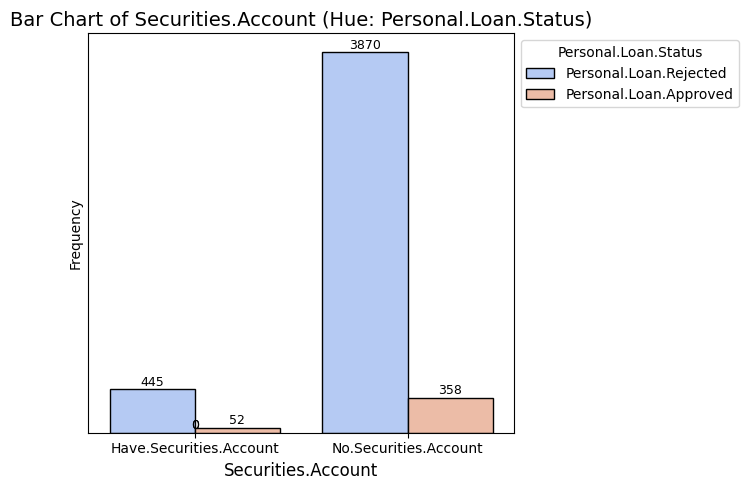

In [113]:
plot_bar_chart(feature=df_bankloan['Securities.Account'], feature_2=df_bankloan['Personal.Loan.Status'], normalize=False, rotation=0, 
               colormap='coolwarm', color='tan')

<Figure size 700x500 with 0 Axes>

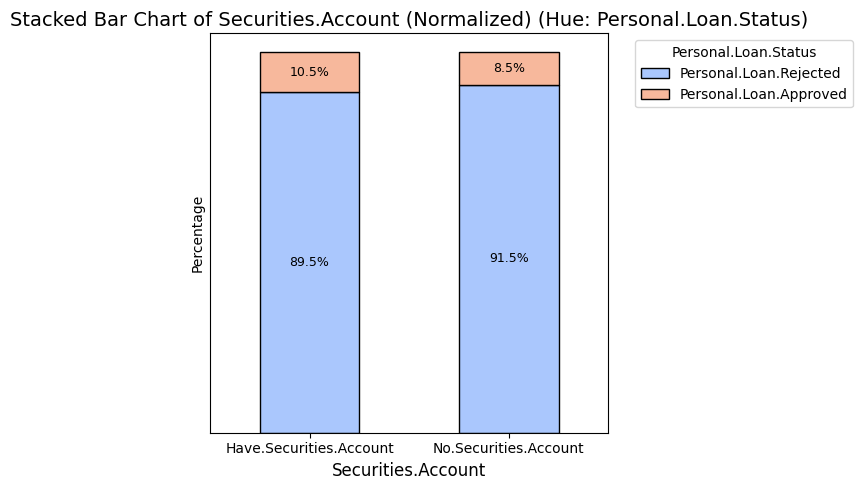

In [114]:
plot_bar_chart(feature=df_bankloan['Securities.Account'], feature_2=df_bankloan['Personal.Loan.Status'], normalize=True, rotation=0, 
               colormap='coolwarm', color='tan')

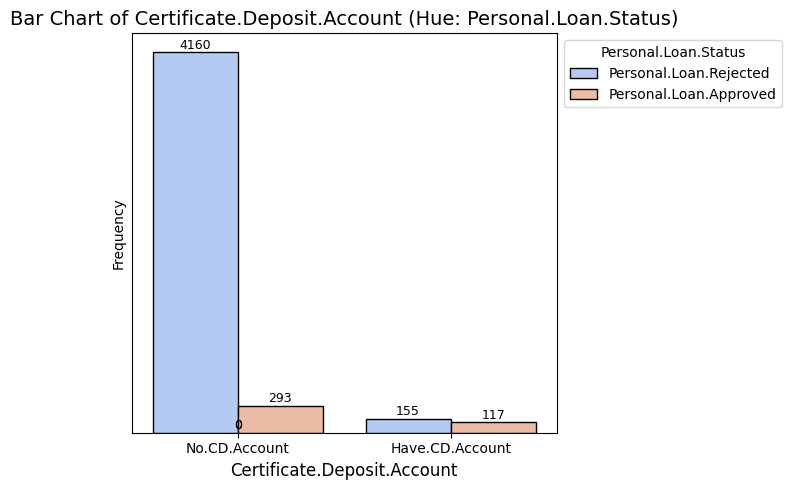

In [115]:
plot_bar_chart(feature=df_bankloan['Certificate.Deposit.Account'], feature_2=df_bankloan['Personal.Loan.Status'], normalize=False, rotation=0, 
               colormap='coolwarm', color='tan')

<Figure size 700x500 with 0 Axes>

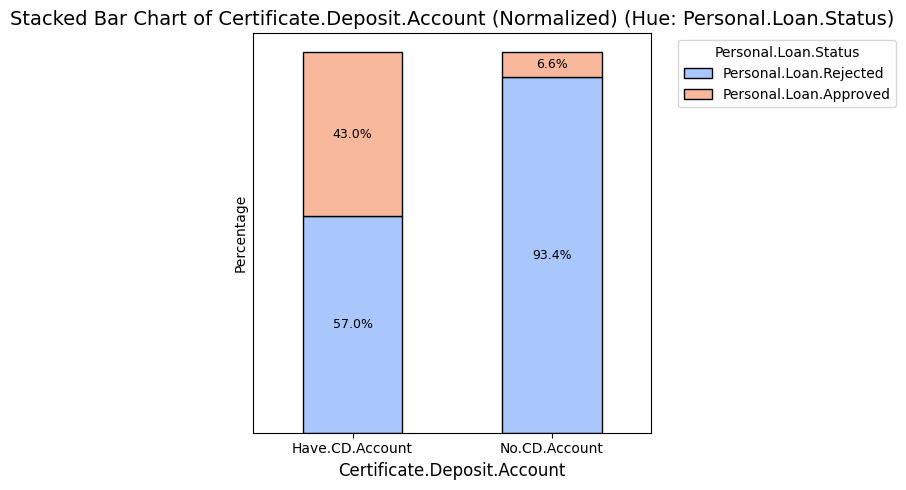

In [116]:
plot_bar_chart(feature=df_bankloan['Certificate.Deposit.Account'], feature_2=df_bankloan['Personal.Loan.Status'], normalize=True, rotation=0, 
               colormap='coolwarm', color='tan')

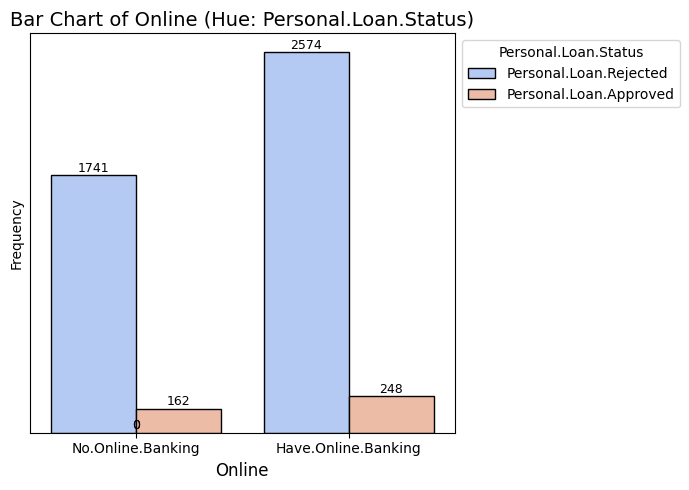

In [117]:
plot_bar_chart(feature=df_bankloan['Online'], feature_2=df_bankloan['Personal.Loan.Status'], normalize=False, rotation=0, colormap='coolwarm', color='tan')

<Figure size 700x500 with 0 Axes>

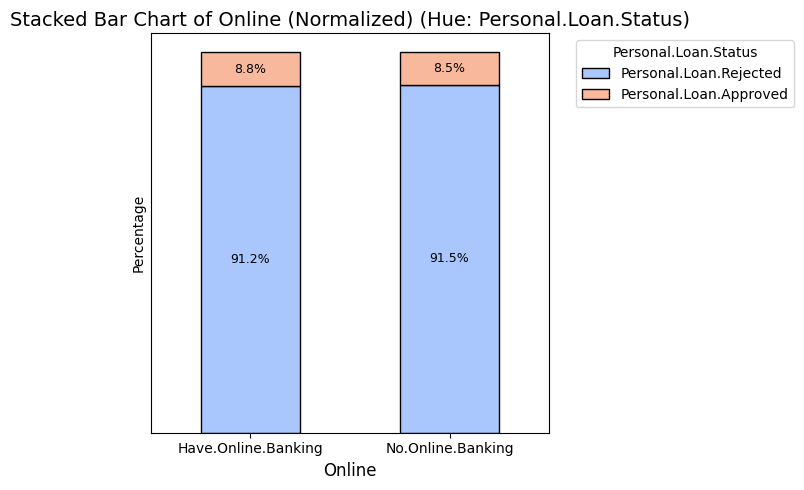

In [118]:
plot_bar_chart(feature=df_bankloan['Online'], feature_2=df_bankloan['Personal.Loan.Status'], normalize=True, rotation=0, colormap='coolwarm', color='tan')

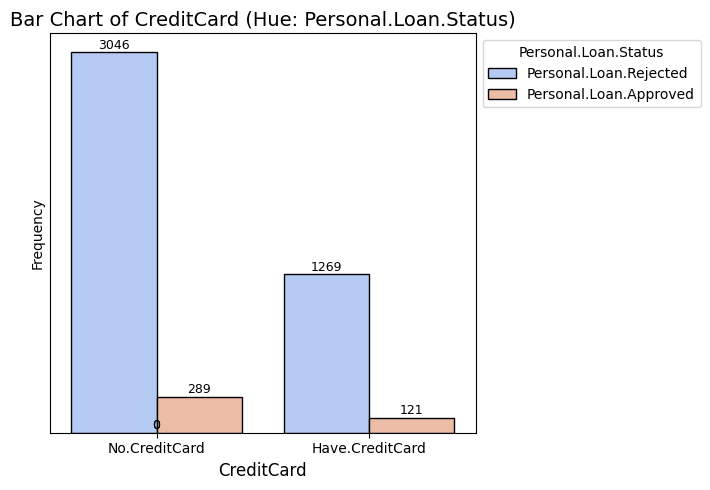

In [119]:
plot_bar_chart(feature=df_bankloan['CreditCard'], feature_2=df_bankloan['Personal.Loan.Status'], normalize=False, rotation=0, colormap='coolwarm', color='tan')

<Figure size 700x500 with 0 Axes>

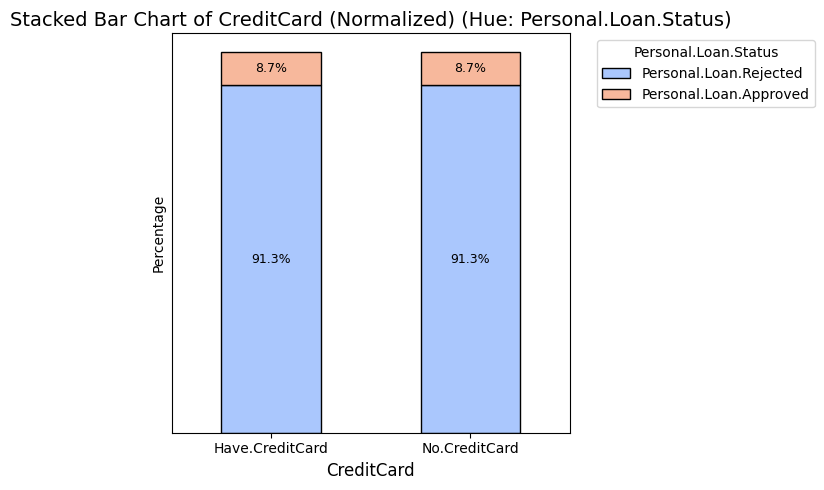

In [120]:
plot_bar_chart(feature=df_bankloan['CreditCard'], feature_2=df_bankloan['Personal.Loan.Status'], normalize=True, rotation=0, colormap='coolwarm', color='tan')

## *The scatter plot matrix chart shows potential strong positive correlation between `Age` and `Experience`. Income and CCAvg shows moderate correlation*

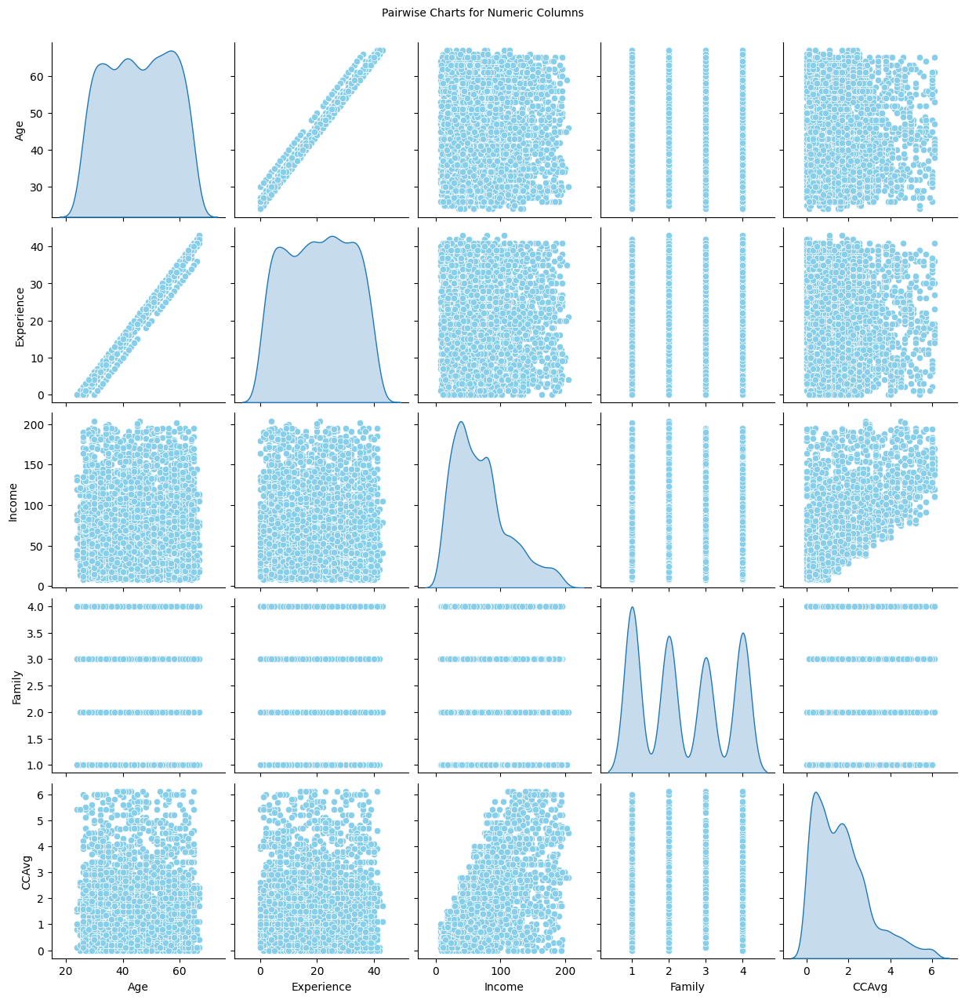

In [121]:
plot_pairwise_numeric(df=df_bankloan, palette="coolwarm", hue=None, color='skyblue', height=2.5)

# Multivariate Analysis
- The scatter plot matrix is hued with the target feature.
- Helps to visually assess feature distributions and how well classes are separated. Useful to gain insights to guide the choice of algorithm
- The separation between classes is not clearly linear across most features.
- Tree based algorithms will be considered. 
- K-Nearest neighbor (KNN) might work decently. However, with the presence of outlier in the income feature, robust scaler might be considered. Since Robust scaler will not ensure the scaled features have their range of values between `0` and `1`, KNN will not be used.
- Support Vector Machine (SVM) might perform decently with non-linear kernel, however, SVM might not be implemented for the purpose of the ICA.
- Logistic Regression (LR) might also perform decently, especially as the baseline model. LR will be considered. 

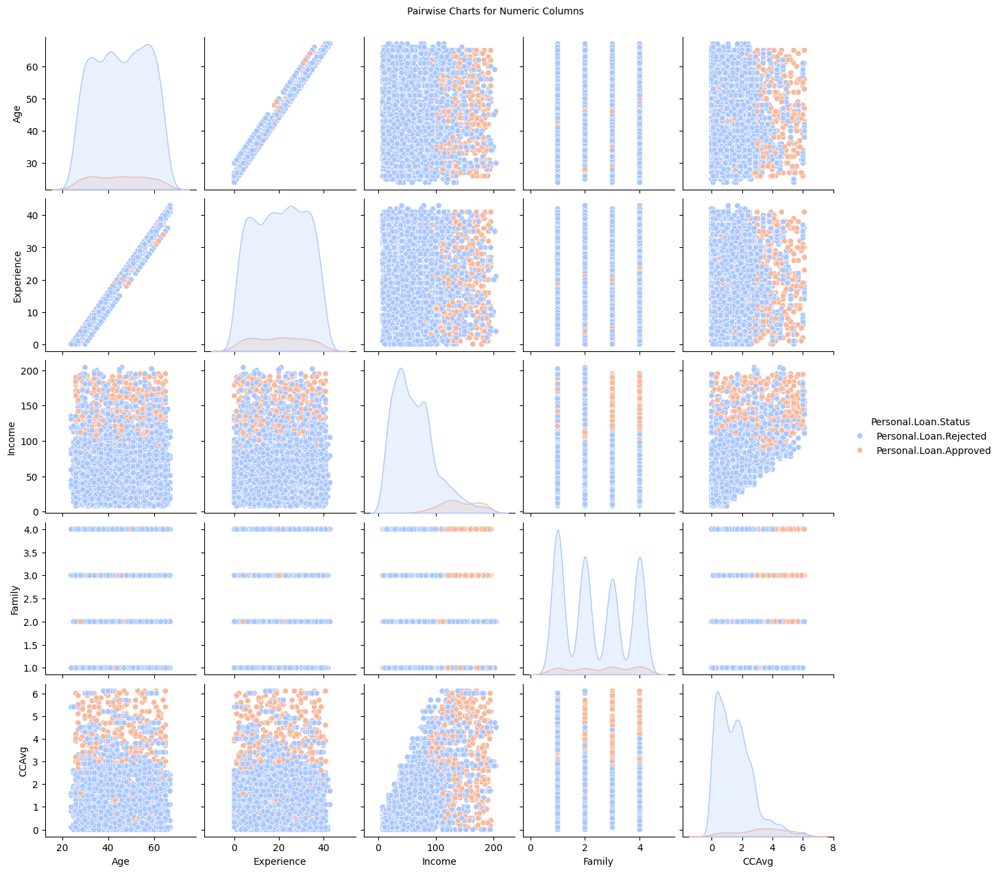

In [122]:
plot_pairwise_numeric(df=df_bankloan, palette="coolwarm", hue='Personal.Loan.Status', color='skyblue', height=2.5)

# Reviewing data to extract feature names as input for the feature encoding.

In [123]:
df_bankloan.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4725 entries, 0 to 4724
Data columns (total 13 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Age                          4725 non-null   int64  
 1   Experience                   4725 non-null   int64  
 2   Income                       4725 non-null   int64  
 3   ZIP.Code                     4725 non-null   object 
 4   Family                       4725 non-null   int64  
 5   CCAvg                        4725 non-null   float64
 6   Education                    4725 non-null   object 
 7   Personal.Loan.Status         4725 non-null   object 
 8   Securities.Account           4725 non-null   object 
 9   Certificate.Deposit.Account  4725 non-null   object 
 10  Online                       4725 non-null   object 
 11  CreditCard                   4725 non-null   object 
 12  Mortgage.Category            4725 non-null   object 
dtypes: float64(1), int

# Encoding the Categorical Features
- Reversing the categorical features to their initial numeric values
- The `Mortage.Category` is encoded. It is a binary categorical feature 

In [124]:
# Define mapping dictionaries
education_map = {'High.School': 1, 'Bachelors': 2, 'Masters_&_Above': 3}
securities_map = {'No.Securities.Account': 0, 'Have.Securities.Account': 1}
cd_map = {'No.CD.Account': 0, 'Have.CD.Account': 1}
online_map = {'No.Online.Banking': 0, 'Have.Online.Banking': 1}
creditcard_map = {'No.CreditCard': 0, 'Have.CreditCard': 1}
Mortgage_map = {'No.Mortgage': 0, 'Have.Mortgage': 1}
loan_map = {'Personal.Loan.Rejected': 0, 'Personal.Loan.Approved': 1}

# Replace strings with numeric values using map
df_bankloan["Education"] = df_bankloan["Education"].map(education_map).astype(int)
df_bankloan["Securities.Account"] = df_bankloan["Securities.Account"].map(securities_map).astype(int)
df_bankloan["Certificate.Deposit.Account"] = df_bankloan["Certificate.Deposit.Account"].map(cd_map).astype(int)  
df_bankloan["Online"] = df_bankloan["Online"].map(online_map).astype(int)
df_bankloan["CreditCard"] = df_bankloan["CreditCard"].map(creditcard_map).astype(int)
df_bankloan["Mortgage.Category"] = df_bankloan["Mortgage.Category"].map(Mortgage_map).astype(int)
df_bankloan["Personal.Loan.Status"] = df_bankloan["Personal.Loan.Status"].map(loan_map).astype(int)

# Check the result
df_bankloan.head()

,Age,Experience,Income,ZIP.Code,Family,CCAvg,Education,Personal.Loan.Status,Securities.Account,Certificate.Deposit.Account,Online,CreditCard,Mortgage.Category
0,25,1,49,91,4,1.60,1,0,1,0,0,0,0
1,45,19,34,90,3,1.50,1,0,1,0,0,0,0
2,39,15,11,94,1,1.00,1,0,0,0,0,0,0
3,35,9,100,94,1,2.70,2,0,0,0,0,0,0
4,35,8,45,91,4,1.00,2,0,0,0,0,1,0


## Implementing One-Hot Encoding for the `ZIP.Code`

In [125]:
np.sort(df_bankloan["ZIP.Code"].unique())

array(['90', '91', '92', '93', '94', '95', '96'], dtype=object)

# One Hot Encoding
- To avoid multicollinearity, the last column, `ZIP_96`, is excluded in favor of the first column, `ZIP_90`, as `ZIP_96` has low variance and minimal predictive impact on the target variable compared to other `ZIP.Code` values.

- The standard method for creating dummy variables is: df_bankloan = *pd.get_dummies(df_bankloan, columns=["ZIP.Code"], prefix="ZIP", drop_first=True, dtype=int)*.

In [126]:
# Create dummy variables without dropping any column
df_bankloan = pd.get_dummies(df_bankloan, columns=["ZIP.Code"], prefix="ZIP", drop_first=False, dtype=int)

# Get the list of dummy columns created for ZIP.Code
zip_columns = [col for col in df_bankloan.columns if col.startswith("ZIP_")]

In [127]:
df_bankloan.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4725 entries, 0 to 4724
Data columns (total 19 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Age                          4725 non-null   int64  
 1   Experience                   4725 non-null   int64  
 2   Income                       4725 non-null   int64  
 3   Family                       4725 non-null   int64  
 4   CCAvg                        4725 non-null   float64
 5   Education                    4725 non-null   int64  
 6   Personal.Loan.Status         4725 non-null   int64  
 7   Securities.Account           4725 non-null   int64  
 8   Certificate.Deposit.Account  4725 non-null   int64  
 9   Online                       4725 non-null   int64  
 10  CreditCard                   4725 non-null   int64  
 11  Mortgage.Category            4725 non-null   int64  
 12  ZIP_90                       4725 non-null   int64  
 13  ZIP_91            

- `ZIP_96` has variance threshold less than **"0.05"**. Hence, it is excluded in lieu of `ZIP_90`

In [128]:
# Checking for Multicollinearity
from sklearn.feature_selection import VarianceThreshold

df_bankloan_vt = df_bankloan.drop(columns=['Personal.Loan.Status']) # Dataframe variable set to check the variance threshold, df_bankloan_vt

# Identify features with low variance (<0.05) which might indicate multicollinearity
variance_threshold = VarianceThreshold(threshold=0.05)
features_to_keep = variance_threshold.fit_transform(df_bankloan_vt)
features_to_keep = df_bankloan_vt.columns[variance_threshold.get_support()]
print("\nFeatures to keep after Variance Thresholding:", features_to_keep)


Features to keep after Variance Thresholding: Index(['Age', 'Experience', 'Income', 'Family', 'CCAvg', 'Education',
       'Securities.Account', 'Certificate.Deposit.Account', 'Online',
       'CreditCard', 'Mortgage.Category', 'ZIP_90', 'ZIP_91', 'ZIP_92',
       'ZIP_93', 'ZIP_94', 'ZIP_95'],
      dtype='object')


- Dropping `ZIP_96`

In [129]:
# Drop the last zip code column (Zip_96)
df_bankloan = df_bankloan.drop(columns=zip_columns[-1])

# Now df_bankloan has Zip_90, Zip_91, Zip_92, Zip_93, Zip_94, Zip_95 (6 columns)

In [130]:
df_bankloan.head()

,Age,Experience,Income,Family,CCAvg,Education,Personal.Loan.Status,Securities.Account,Certificate.Deposit.Account,Online,CreditCard,Mortgage.Category,ZIP_90,ZIP_91,ZIP_92,ZIP_93,ZIP_94,ZIP_95
0,25,1,49,4,1.60,1,0,1,0,0,0,0,0,1,0,0,0,0
1,45,19,34,3,1.50,1,0,1,0,0,0,0,1,0,0,0,0,0
2,39,15,11,1,1.00,1,0,0,0,0,0,0,0,0,0,0,1,0
3,35,9,100,1,2.70,2,0,0,0,0,0,0,0,0,0,0,1,0
4,35,8,45,4,1.00,2,0,0,0,0,1,0,0,1,0,0,0,0


# Some of the references read on Correlation and Multicollinearity
- Dormann, C.F. et al. (2013) ‘Collinearity: a review of methods to deal with it and a simulation study evaluating their performance’, Ecography, 36(1), pp. 27–46. Available at: https://doi.org/10.1111/j.1600-0587.2012.07348.x.
- Chan, J.Y.-L. et al. (2022) ‘Mitigating the Multicollinearity Problem and Its Machine Learning Approach: A Review’, Mathematics, 10, pp.1283. Available at: https://doi.org/10.3390/math10081283.

# Checking for correlation
- The `Age` and `Experience` is **strongly correlated.**
- There is **moderate correlation** between `Income` and `CCAvg`.


 Correlation matrix:
                              Age  Experience  Income  Family  CCAvg  \
Age                          1.00        0.99   -0.04   -0.04  -0.04   
Experience                   0.99        1.00   -0.04   -0.05  -0.04   
Income                      -0.04       -0.04    1.00   -0.14   0.55   
Family                      -0.04       -0.05   -0.14    1.00  -0.07   
CCAvg                       -0.04       -0.04    0.55   -0.07   1.00   
Education                    0.04        0.02   -0.16    0.05  -0.08   
Personal.Loan.Status        -0.01       -0.01    0.51    0.05   0.38   
Securities.Account          -0.00       -0.00    0.00    0.02   0.03   
Certificate.Deposit.Account  0.00        0.01    0.16    0.01   0.14   
Online                       0.01        0.01    0.01    0.01  -0.00   
CreditCard                   0.01        0.01   -0.00    0.01  -0.01   
Mortgage.Category           -0.01       -0.01   -0.00    0.00  -0.01   
ZIP_90                       0.01        0

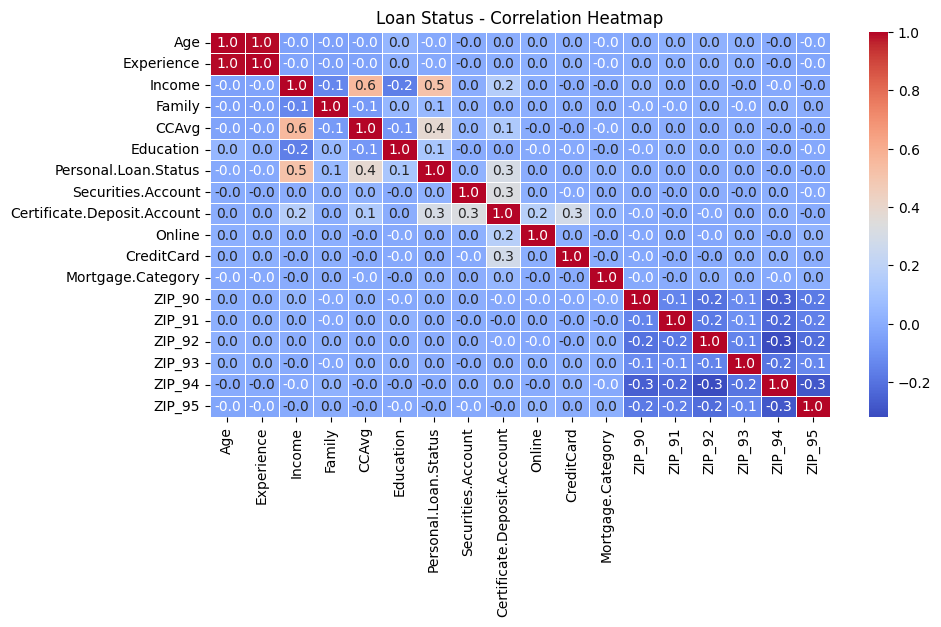

In [131]:
df_bankloan_cor = df_bankloan.copy() # Dataframe variable set to check for correlation, df_bankloan_cor

# Checking for Correlation
print("\n Correlation matrix:")
correlation_matrix = df_bankloan_cor.corr()
print(correlation_matrix)

# Visualize correlation using heatmap
plt.figure(figsize=(10, 5))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".1f", linewidths=0.5)
plt.title("Loan Status - Correlation Heatmap")
plt.show()

## Checking for the Condition Index (CI)
- The features have moderate multicollinearity with the `Condition Index` being `19`.
- CI < 10: No significant multicollinearity. Predictors are relatively independent.
- CI 10–30: Moderate multicollinearity. Some linear dependency exists, but it may not be problematic unless variance decomposition shows issues.
- CI > 30: High / strong multicollinearity. Indicates potential issues with regression estimates (e.g., unstable coefficients, inflated standard errors).

In [132]:
df_bankloan_ci = df_bankloan.drop(columns=['Personal.Loan.Status']) # Dataframe variable set to check for Condition Index, df_bankloan_ci

# Calculate the correlation matrix
corr_matrix = df_bankloan_ci.corr()

# Calculate eigenvalues
eigenvalues = np.linalg.eigvals(corr_matrix)

# Calculate condition index
condition_index = np.sqrt(eigenvalues.max() / eigenvalues.min())

print("Eigenvalues:", eigenvalues)
print("Condition Index:", condition_index)

Eigenvalues: [2.02017172 0.00547054 0.00968398 1.72749644 0.42826002 0.51785396
 1.41716839 1.3313279  1.22805653 1.17810894 1.1441719  1.10321954
 0.93707055 0.95623295 0.98125315 1.01242844 1.00202507]
Condition Index: 19.21670711782121


# Checking for Variance Inflation Factor (VIF).
- The features have high multicollinearity with VIF values as high as 108 and 405
- VIF = 1: No multicollinearity. The predictor is independent of others.
- VIF 1–5: Low to moderate multicollinearity.
- VIF 5–10: Moderate multicollinearity.
- VIF > 10: High / strong multicollinearity, likely affecting regression estimates (e.g., unstable coefficients, inflated standard errors).


VIF Values:
                        feature    VIF
0                           Age 404.68
1                    Experience 107.82
2                        Income   5.52
3                        Family   5.46
4                         CCAvg   3.82
5                     Education   6.66
6            Securities.Account   1.28
7   Certificate.Deposit.Account   1.41
8                        Online   2.57
9                    CreditCard   1.57
10            Mortgage.Category   1.45
11                       ZIP_90  15.37
12                       ZIP_91  12.32
13                       ZIP_92  20.87
14                       ZIP_93   9.48
15                       ZIP_94  30.76
16                       ZIP_95  17.53


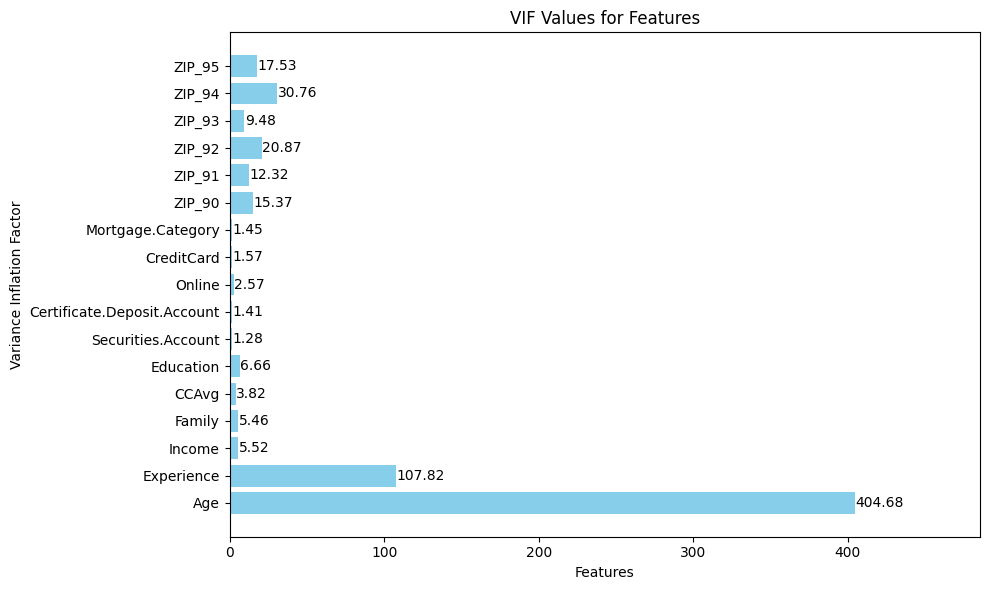

In [133]:
# Drop the target variable
df_bankloan_vif = df_bankloan.drop(columns=['Personal.Loan.Status']) # Dataframe variable set to check for Variance Inflation Factor (VIF), df_bankloan_vif

vif_data = pd.DataFrame()
vif_data["feature"] = df_bankloan_vif.columns
vif_data["VIF"] = [variance_inflation_factor(df_bankloan_vif.values, i) for i in range(len(df_bankloan_vif.columns))]

# Print VIF values
print("\nVIF Values:")
print(vif_data)

# Plot VIF values as a horizontal bar chart
plt.figure(figsize=(10, 6))
bars = plt.barh(vif_data['feature'], vif_data['VIF'], color='skyblue')
plt.xlabel('Features')
plt.ylabel('Variance Inflation Factor')
plt.title('VIF Values for Features')

# Set x-axis limit to be greater than the highest VIF value 
max_vif = vif_data['VIF'].max()
plt.xlim(0, max_vif * 1.2)  # Add 20% buffer 

# Label the bars with VIF values
for bar, vif in zip(bars, vif_data['VIF']):
    plt.text(bar.get_width() + 0.3, bar.get_y() + bar.get_height()/2, f'{vif:.2f}', 
             va='center', ha='left')

plt.tight_layout()
plt.show()

# Insights from the Variance Threshold analysis, correlation, Condition Index and Variance Inflation Factor (**VIF**) implemented above
- The variance threshold of the features is greater than **`0.05`**.
- There is strong correlation between `Age` and `Experience`.
- The `Condition Index` being `19` suggests moderate multicollinearity while `VIF` values suggest high multicollinearity.

In [134]:
print(df_bankloan['Age'].corr(df_bankloan['Personal.Loan.Status']))

-0.012946213065228066


In [135]:
print(df_bankloan['Experience'].corr(df_bankloan['Personal.Loan.Status']))

-0.011157897549349755


# Choosing the feature with the higher correlation value to the target variable
- `Age` and `Experience` have almost the same predicton influence, suggested by the almost identical correlation value with the target variable. 
- There is moderate correlation between `CCAvg` and `Income`.
- While Tree-based algorithms are robust to multicollinearity, the `Age` will be categorized, as `Age.Cat` to check if it will reduce the *correlation* and *multicollinearity*.


In [136]:
print(df_bankloan['Age'].describe())

count   4725.00
mean      45.64
std       11.36
min       24.00
25%       36.00
50%       46.00
75%       56.00
max       67.00
Name: Age, dtype: float64


In [137]:
# Bin numerical features into categories for use as hue
df_bankloan['Age.Cat'] = pd.cut(df_bankloan['Age'], bins=[23, 46, 67], labels=['young_applicant', 'old_applicant'])

In [138]:
df_bankloan.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4725 entries, 0 to 4724
Data columns (total 19 columns):
 #   Column                       Non-Null Count  Dtype   
---  ------                       --------------  -----   
 0   Age                          4725 non-null   int64   
 1   Experience                   4725 non-null   int64   
 2   Income                       4725 non-null   int64   
 3   Family                       4725 non-null   int64   
 4   CCAvg                        4725 non-null   float64 
 5   Education                    4725 non-null   int64   
 6   Personal.Loan.Status         4725 non-null   int64   
 7   Securities.Account           4725 non-null   int64   
 8   Certificate.Deposit.Account  4725 non-null   int64   
 9   Online                       4725 non-null   int64   
 10  CreditCard                   4725 non-null   int64   
 11  Mortgage.Category            4725 non-null   int64   
 12  ZIP_90                       4725 non-null   int64   
 13  ZIP

# Dropping the `Age` since it has been categorized as `Age.Cat`

In [139]:
df_bankloan = df_bankloan.drop(columns=['Age'])
df_bankloan.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4725 entries, 0 to 4724
Data columns (total 18 columns):
 #   Column                       Non-Null Count  Dtype   
---  ------                       --------------  -----   
 0   Experience                   4725 non-null   int64   
 1   Income                       4725 non-null   int64   
 2   Family                       4725 non-null   int64   
 3   CCAvg                        4725 non-null   float64 
 4   Education                    4725 non-null   int64   
 5   Personal.Loan.Status         4725 non-null   int64   
 6   Securities.Account           4725 non-null   int64   
 7   Certificate.Deposit.Account  4725 non-null   int64   
 8   Online                       4725 non-null   int64   
 9   CreditCard                   4725 non-null   int64   
 10  Mortgage.Category            4725 non-null   int64   
 11  ZIP_90                       4725 non-null   int64   
 12  ZIP_91                       4725 non-null   int64   
 13  ZIP

# Encoding the categorized age, `Age.Cat`

In [140]:
df_bankloan['Age.Cat'].unique()

['young_applicant', 'old_applicant']
Categories (2, object): ['young_applicant' < 'old_applicant']

In [141]:
# Define mapping dictionary
age_map = {'young_applicant': 0, 'old_applicant': 1}

# Replace strings with numeric values using map
df_bankloan["Age.Cat"] = df_bankloan["Age.Cat"].map(age_map).astype(int)

# Checking for the Correlation and Multicollinearity with the categorized age


 Correlation matrix:
                             Experience  Income  Family  CCAvg  Education  \
Experience                         1.00   -0.04   -0.05  -0.04       0.02   
Income                            -0.04    1.00   -0.14   0.55      -0.16   
Family                            -0.05   -0.14    1.00  -0.07       0.05   
CCAvg                             -0.04    0.55   -0.07   1.00      -0.08   
Education                          0.02   -0.16    0.05  -0.08       1.00   
Personal.Loan.Status              -0.01    0.51    0.05   0.38       0.11   
Securities.Account                -0.00    0.00    0.02   0.03      -0.01   
Certificate.Deposit.Account        0.01    0.16    0.01   0.14       0.00   
Online                             0.01    0.01    0.01  -0.00      -0.02   
CreditCard                         0.01   -0.00    0.01  -0.01      -0.01   
Mortgage.Category                 -0.01   -0.00    0.00  -0.01      -0.00   
ZIP_90                             0.01    0.03   -0.0

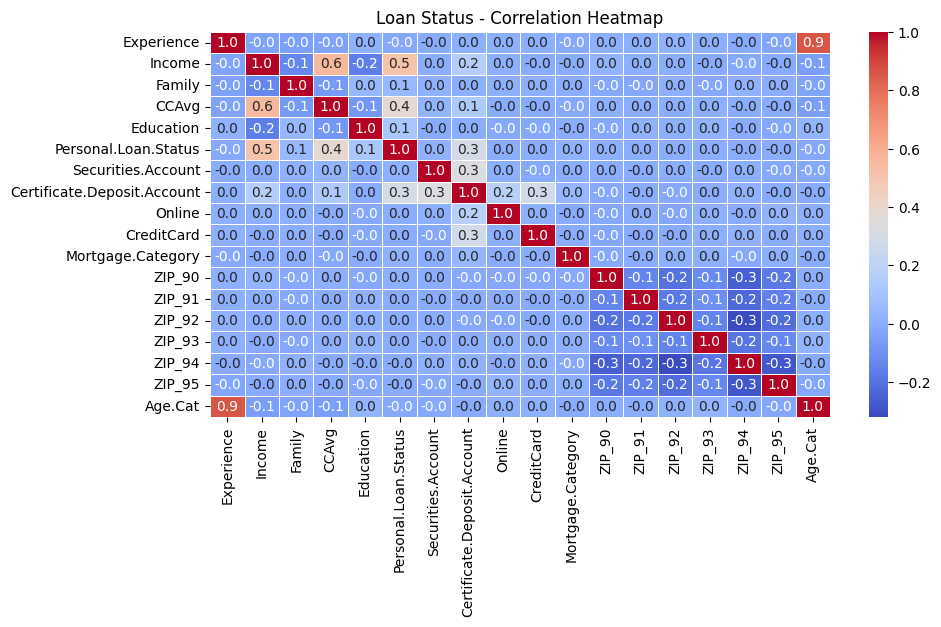

In [142]:
df_bankloan_cor_w_age_cat = df_bankloan.copy() # Dataframe variable set to check for correlation, df_bankloan_cor_w_age_cat

# Checking for Correlation
print("\n Correlation matrix:")
correlation_matrix = df_bankloan_cor_w_age_cat.corr()
print(correlation_matrix)

# Visualize correlation using heatmap
plt.figure(figsize=(10, 5))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".1f", linewidths=0.5)
plt.title("Loan Status - Correlation Heatmap")
plt.show()

In [143]:
df_bankloan_ci_w_age_cat = df_bankloan.drop(columns=['Personal.Loan.Status']) # Dataframe variable set to check for Condition Index, df_bankloan_ci_w_age_cat

# Calculate the correlation matrix
corr_matrix = df_bankloan_ci_w_age_cat.corr()

# Calculate eigenvalues
eigenvalues = np.linalg.eigvals(corr_matrix)

# Calculate condition index
condition_index = np.sqrt(eigenvalues.max() / eigenvalues.min())

print("Eigenvalues:", eigenvalues)
print("Condition Index:", condition_index)

Eigenvalues: [1.90488195 0.1408534  0.00968023 1.70789895 0.42827613 0.51786175
 1.41710953 1.33138691 1.22824119 1.17847386 1.14436668 1.10250875
 0.93782361 0.95548221 0.9808228  1.01220001 1.00213205]
Condition Index: 14.027851134305664



VIF Values:
                        feature   VIF
0                    Experience 15.71
1                        Income  5.48
2                        Family  5.26
3                         CCAvg  3.81
4                     Education  6.09
5            Securities.Account  1.28
6   Certificate.Deposit.Account  1.40
7                        Online  2.54
8                    CreditCard  1.56
9             Mortgage.Category  1.45
10                       ZIP_90  3.78
11                       ZIP_91  3.24
12                       ZIP_92  4.94
13                       ZIP_93  2.66
14                       ZIP_94  6.78
15                       ZIP_95  4.17
16                      Age.Cat  7.27


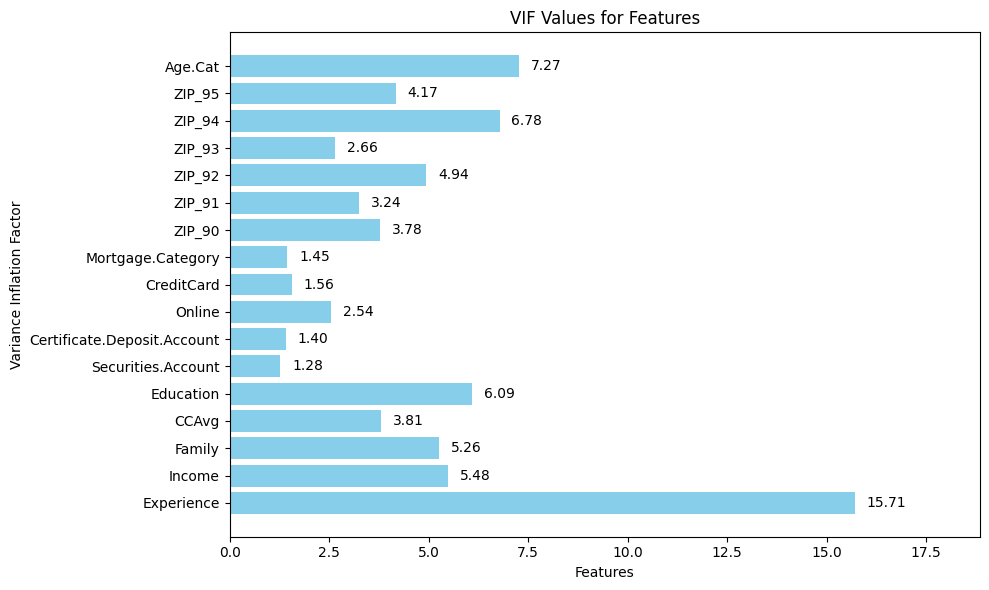

In [144]:
# Drop the target variable (# Dataframe variable set to check for Variance Inflation Factor (VIF), df_bankloan_vif_w_age_cat)
df_bankloan_vif_w_age_cat = df_bankloan.drop(columns=['Personal.Loan.Status']) 

vif_data = pd.DataFrame()
vif_data["feature"] = df_bankloan_vif_w_age_cat.columns
vif_data["VIF"] = [variance_inflation_factor(df_bankloan_vif_w_age_cat.values, i) for i in range(len(df_bankloan_vif_w_age_cat.columns))]

# Print VIF values
print("\nVIF Values:")
print(vif_data)

# Plot VIF values as a horizontal bar chart
plt.figure(figsize=(10, 6))
bars = plt.barh(vif_data['feature'], vif_data['VIF'], color='skyblue')
plt.xlabel('Features')
plt.ylabel('Variance Inflation Factor')
plt.title('VIF Values for Features')

# Set x-axis limit to be greater than the highest VIF value 
max_vif = vif_data['VIF'].max()
plt.xlim(0, max_vif * 1.2)  # Add 20% buffer 

# Label the bars with VIF values
for bar, vif in zip(bars, vif_data['VIF']):
    plt.text(bar.get_width() + 0.3, bar.get_y() + bar.get_height()/2, f'{vif:.2f}', 
             va='center', ha='left')

plt.tight_layout()
plt.show()

# Insights from the correlation and multicollinearity check with the `Age.Cat`
- The correlation between `Age.Cat` and `Experience` is still high.
- There is moderate correlation between `CCAvg` and `Income`.
- The condition index is 14. It still suggest ** moderate multicolliearity**.
- While the VIF values reduced drastically, the VIF value for `Experience` is 16, which suggests high multicollinearity issue with the features.

---
# The `Age.Cat` will be dropped to check if it will reduce the correlation and multicollinearity issues.

In [145]:
# Dropping the `Age.Cat`
df_bankloan = df_bankloan.drop(columns=['Age.Cat'])
df_bankloan.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4725 entries, 0 to 4724
Data columns (total 17 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Experience                   4725 non-null   int64  
 1   Income                       4725 non-null   int64  
 2   Family                       4725 non-null   int64  
 3   CCAvg                        4725 non-null   float64
 4   Education                    4725 non-null   int64  
 5   Personal.Loan.Status         4725 non-null   int64  
 6   Securities.Account           4725 non-null   int64  
 7   Certificate.Deposit.Account  4725 non-null   int64  
 8   Online                       4725 non-null   int64  
 9   CreditCard                   4725 non-null   int64  
 10  Mortgage.Category            4725 non-null   int64  
 11  ZIP_90                       4725 non-null   int64  
 12  ZIP_91                       4725 non-null   int64  
 13  ZIP_92            

# Checking the correlation without the `Age` and the `Age.Cat`


 Correlation matrix:
                             Experience  Income  Family  CCAvg  Education  \
Experience                         1.00   -0.04   -0.05  -0.04       0.02   
Income                            -0.04    1.00   -0.14   0.55      -0.16   
Family                            -0.05   -0.14    1.00  -0.07       0.05   
CCAvg                             -0.04    0.55   -0.07   1.00      -0.08   
Education                          0.02   -0.16    0.05  -0.08       1.00   
Personal.Loan.Status              -0.01    0.51    0.05   0.38       0.11   
Securities.Account                -0.00    0.00    0.02   0.03      -0.01   
Certificate.Deposit.Account        0.01    0.16    0.01   0.14       0.00   
Online                             0.01    0.01    0.01  -0.00      -0.02   
CreditCard                         0.01   -0.00    0.01  -0.01      -0.01   
Mortgage.Category                 -0.01   -0.00    0.00  -0.01      -0.00   
ZIP_90                             0.01    0.03   -0.0

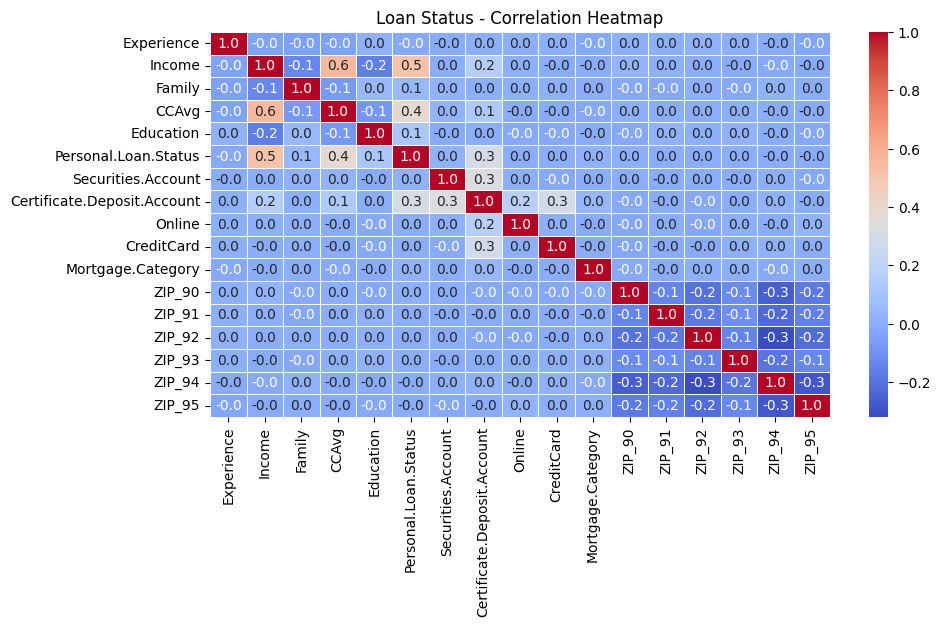

In [146]:
df_bankloan_cor_no_age = df_bankloan.copy() # Dataframe variable set to check for correlation, df_bankloan_cor__no_age

# Checking for Correlation
print("\n Correlation matrix:")
correlation_matrix = df_bankloan_cor_no_age.corr()
print(correlation_matrix)

# Visualize correlation using heatmap
plt.figure(figsize=(10, 5))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".1f", linewidths=0.5)
plt.title("Loan Status - Correlation Heatmap")
plt.show()

# Checking the Condition Index (CI) without the `Age` and the `Age.Cat`

In [147]:
df_bankloan_ci_no_age = df_bankloan.drop(columns=['Personal.Loan.Status']) # Dataframe variable set to check for Condition Index (CI), df_bankloan_ci__no_age

# Calculate the correlation matrix
corr_matrix = df_bankloan_ci_no_age.corr()

# Calculate eigenvalues
eigenvalues = np.linalg.eigvals(corr_matrix)

# Calculate condition index
condition_index = np.sqrt(eigenvalues.max() / eigenvalues.min())

print("Eigenvalues:", eigenvalues)
print("Condition Index:", condition_index)

Eigenvalues: [0.00968287 1.74065554 0.42825985 0.51776304 1.41814624 1.33434972
 1.23101744 0.90771947 1.18549289 1.14687733 1.10602435 0.94788894
 1.04130718 0.97878515 1.00854286 0.99748713]
Condition Index: 13.407702168516398


# Checking the **Variance Inflation Factor** without the `Age` and the `Age.Cat`


VIF Values:
                        feature  VIF
0                    Experience 4.18
1                        Income 5.48
2                        Family 5.25
3                         CCAvg 3.81
4                     Education 6.09
5            Securities.Account 1.28
6   Certificate.Deposit.Account 1.40
7                        Online 2.54
8                    CreditCard 1.56
9             Mortgage.Category 1.45
10                       ZIP_90 3.65
11                       ZIP_91 3.13
12                       ZIP_92 4.76
13                       ZIP_93 2.60
14                       ZIP_94 6.52
15                       ZIP_95 4.03


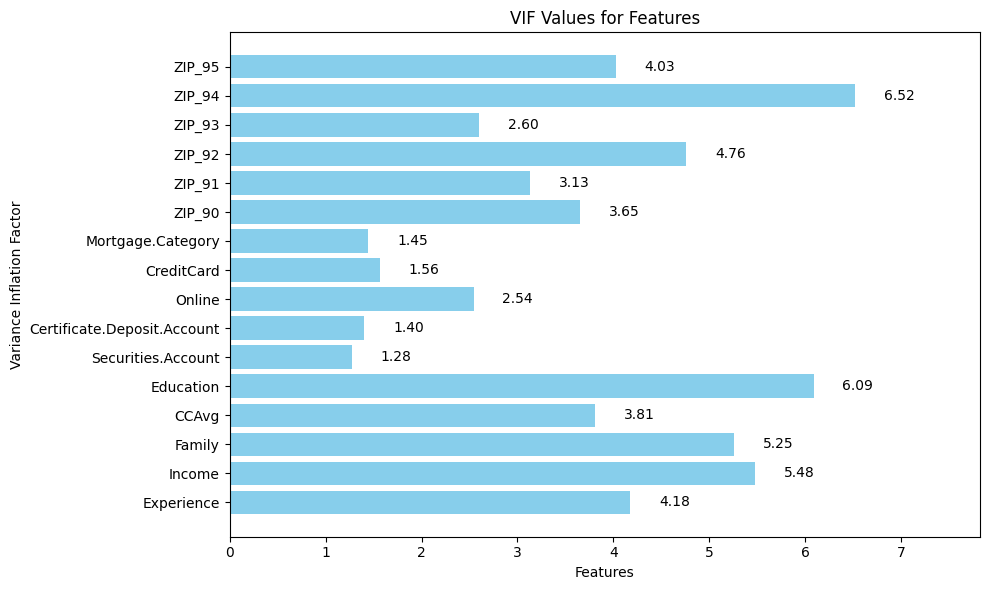

In [148]:
# Drop the target variable (# Dataframe variable set to check for VIF, df_bankloan_vif__no_age)
df_bankloan_vif_no_age = df_bankloan.drop(columns=['Personal.Loan.Status'])

vif_data = pd.DataFrame()
vif_data["feature"] = df_bankloan_vif_no_age.columns
vif_data["VIF"] = [variance_inflation_factor(df_bankloan_vif_no_age.values, i) for i in range(len(df_bankloan_vif_no_age.columns))]

# Print VIF values
print("\nVIF Values:")
print(vif_data)

# Plot VIF values as a horizontal bar chart
plt.figure(figsize=(10, 6))
bars = plt.barh(vif_data['feature'], vif_data['VIF'], color='skyblue')
plt.xlabel('Features')
plt.ylabel('Variance Inflation Factor')
plt.title('VIF Values for Features')

# Set x-axis limit to be greater than the highest VIF value 
max_vif = vif_data['VIF'].max()
plt.xlim(0, max_vif * 1.2)  # Add 20% buffer 

# Label the bars with VIF values
for bar, vif in zip(bars, vif_data['VIF']):
    plt.text(bar.get_width() + 0.3, bar.get_y() + bar.get_height()/2, f'{vif:.2f}', 
             va='center', ha='left')

plt.tight_layout()
plt.show()

# Insight from the correlation and the multicollinearity check after the `Age.Cat` was dropped.
- There is moderate correlation between `CCAvg` and `Income`.
- There is moderate multicollinearity between the features suggested with the **Condition Index** being `14` and some **VIF** values aroun `6`.

---

- The `CCAvg` and `Income` will both be retained based on bank loan system knowledge, as both `CCAvg` and `Income` are important to predict *loan approval*
- Tree-based algorithms (*Decision Tree - DT, Random Forest - RF and Gradient Boost - GB*) will be implemented for their robust with multicollinearity, non-linearly separated features and their robust to outliers.
- Logistic Regression (LR) will be implemented. It will serve as the baseline algorithm. It also complements the Tree-based algorithm as a high-bias algorithm. Though, LR can be affected by the moderate correlation and multicollinearity, **Regularization** will be implemented to reduce the potential effect of correlation and multicollinearity. **Regularization** will help improve *Stabilizing Coefficients, Improving Interpretability and Enhancing Generalization*.

---

- For this personal loan approval prediction in a binary classification task, the four algorithms are also selected for their complementary strengths in managing bias, variance, and data patterns: Logistic Regression (LR), an interpretable, low-variance baseline suited for linear relationships but limited by high bias for non-linear patterns; Decision Tree (DT), which captures complex patterns with low bias but risks overfitting, mitigated by pruning; Random Forest (RF), an ensemble method with low bias and variance when tuned, resilient to noise and providing feature importance; and Gradient Boosting (GB), which achieves high accuracy by iteratively boosting and modeling subtle interactions, though requiring tuning to prevent overfitting. This selection ensures a comprehensive evaluation to determine the optimal model. 

# FEATURE SCALING
- The target variable was verified to ensure correct encoding. The tarrget variable was separated from the other features. Though, passing the target variable along with the categorical features that were not scaled should also work fine.
- Numerical features were scaled using a robust scaler to normalize their ranges, as recommended for models sensitive to feature magnitudes (Géron, 2019). 
- The categorical features including the one-hot encoded features, , are primarily binary 0s and 1s, and the ordinal-encoded (education feature with values 1–3), were not scaled. This decision was based on their values already being within a consistent range, aligning with the normalized output of the robust scaler, and the robustness of certain algorithms to unscaled categorical features (Géron, 2019).

- **Reference List**
- Géron, A. (2019) Hands-on machine learning with Scikit-Learn, Keras, and TensorFlow. 2nd edn. Sebastopol, CA: O’Reilly Media.

# PROPOSING SOLUTION.

---

# DESIGN, IMPLEMENTATION, MODELLING, AND EVALUATION. 

In [149]:
df_bankloan["Personal.Loan.Status"].unique()

array([0, 1])

In [150]:
# Define feature groups (excluding the target variable)
numerical_features = ["Income", "Experience", "CCAvg", "Family"]  # Numerical features
categorical_features = ["Securities.Account", "Certificate.Deposit.Account", 
                       "Online", "CreditCard", "Mortgage.Category",
                       "Education", "ZIP_90", "ZIP_91", "ZIP_92", 
                       "ZIP_93", "ZIP_94", "ZIP_95"]  # Categorical features

# Define the target variable
target = "Personal.Loan.Status"

# Select features
X = df_bankloan[numerical_features + categorical_features]
y = df_bankloan[target]

# Create the preprocessor
preprocessor = ColumnTransformer(
    transformers=[
        ('num', RobustScaler(), numerical_features),
        ('cat', 'passthrough', categorical_features)
    ])

# Create a pipeline
pipeline = Pipeline([
    ('preprocessor', preprocessor)
])

# Fit and transform the entire dataset
X_scaled = pipeline.fit_transform(X)

# Convert back to DataFrame
X_scaled_df = pd.DataFrame(
    X_scaled,
    columns=numerical_features + categorical_features,
    index=X.index
)

# Display results
print("Original Features DataFrame:")
print(X.head())
print("\nTransformed Features DataFrame:")
print(X_scaled_df.head())
print("\nTarget Variable:")
print(y.head())

Original Features DataFrame:
   Income  Experience  CCAvg  Family  Securities.Account  \
0      49           1   1.60       4                   1   
1      34          19   1.50       3                   1   
2      11          15   1.00       1                   0   
3     100           9   2.70       1                   0   
4      45           8   1.00       4                   0   

   Certificate.Deposit.Account  Online  CreditCard  Mortgage.Category  \
0                            0       0           0                  0   
1                            0       0           0                  0   
2                            0       0           0                  0   
3                            0       0           0                  0   
4                            0       0           1                  0   

   Education  ZIP_90  ZIP_91  ZIP_92  ZIP_93  ZIP_94  ZIP_95  
0          1       0       1       0       0       0       0  
1          1       1       0       0       0 

- The target feature is joined back to the independent features, and ready for model training.

In [151]:
# Combine transformed features and target into a single DataFrame
df_bankloan_scaled = X_scaled_df.copy()  # Copy X_scaled_df to avoid modifying it
df_bankloan_scaled[target] = y  # Add the target column

# Display results
print("Transformed DataFrame with Target (df_bankloan_scaled):")
print(df_bankloan_scaled.head())

Transformed DataFrame with Target (df_bankloan_scaled):
   Income  Experience  CCAvg  Family  Securities.Account  \
0   -0.23       -1.05   0.06    0.67                1.00   
1   -0.51       -0.11   0.00    0.33                1.00   
2   -0.94       -0.32  -0.28   -0.33                0.00   
3    0.74       -0.63   0.67   -0.33                0.00   
4   -0.30       -0.68  -0.28    0.67                0.00   

   Certificate.Deposit.Account  Online  CreditCard  Mortgage.Category  \
0                         0.00    0.00        0.00               0.00   
1                         0.00    0.00        0.00               0.00   
2                         0.00    0.00        0.00               0.00   
3                         0.00    0.00        0.00               0.00   
4                         0.00    0.00        1.00               0.00   

   Education  ZIP_90  ZIP_91  ZIP_92  ZIP_93  ZIP_94  ZIP_95  \
0       1.00    0.00    1.00    0.00    0.00    0.00    0.00   
1       1.00    

# The four algorithms were trained with the imbalanced dataset and without tuning the algorithm parameters.


Logistic Regression Performance:
Training Accuracy: 0.96
Training Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.99      0.98      3459
           1       0.83      0.66      0.73       321

    accuracy                           0.96      3780
   macro avg       0.90      0.82      0.86      3780
weighted avg       0.96      0.96      0.96      3780

Training Confusion Matrix:
 [[3415   44]
 [ 110  211]]


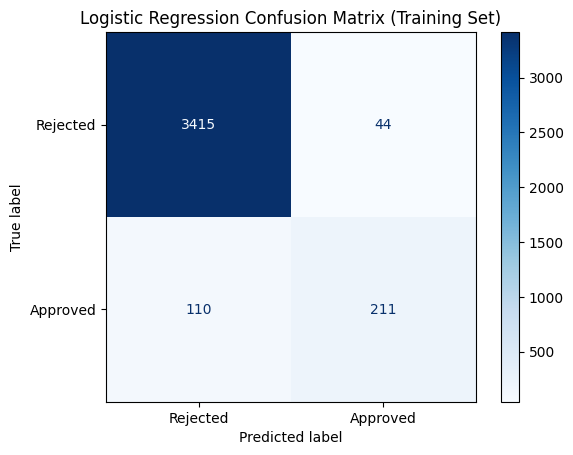

Test Accuracy: 0.95
Test Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.98      0.97       856
           1       0.79      0.63      0.70        89

    accuracy                           0.95       945
   macro avg       0.88      0.81      0.84       945
weighted avg       0.95      0.95      0.95       945

Test Confusion Matrix:
 [[841  15]
 [ 33  56]]


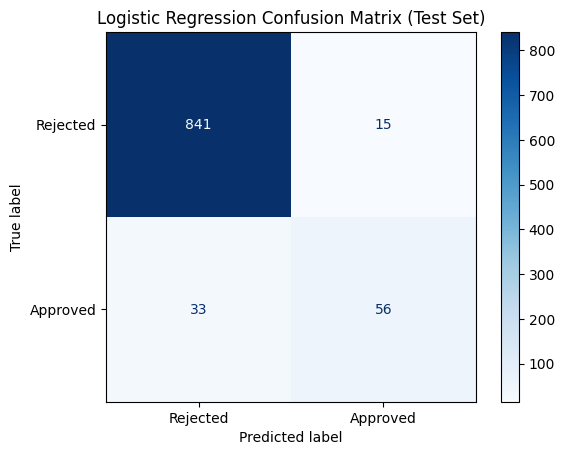


Decision Tree Performance:
Training Accuracy: 0.99
Training Classification Report:
               precision    recall  f1-score   support

           0       0.99      1.00      0.99      3459
           1       0.96      0.91      0.93       321

    accuracy                           0.99      3780
   macro avg       0.98      0.95      0.96      3780
weighted avg       0.99      0.99      0.99      3780

Training Confusion Matrix:
 [[3447   12]
 [  29  292]]


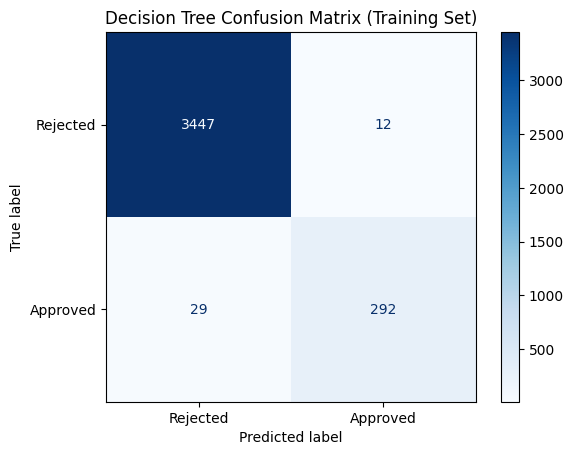

Test Accuracy: 0.99
Test Classification Report:
               precision    recall  f1-score   support

           0       0.99      1.00      0.99       856
           1       0.95      0.89      0.92        89

    accuracy                           0.99       945
   macro avg       0.97      0.94      0.96       945
weighted avg       0.98      0.99      0.98       945

Test Confusion Matrix:
 [[852   4]
 [ 10  79]]


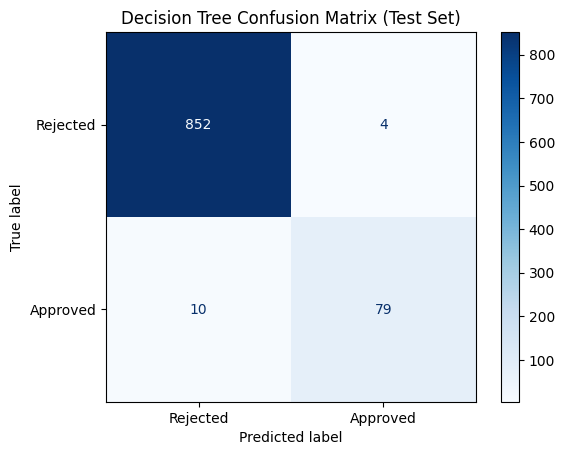


Random Forest Performance:
Training Accuracy: 1.00
Training Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      3459
           1       1.00      1.00      1.00       321

    accuracy                           1.00      3780
   macro avg       1.00      1.00      1.00      3780
weighted avg       1.00      1.00      1.00      3780

Training Confusion Matrix:
 [[3459    0]
 [   0  321]]


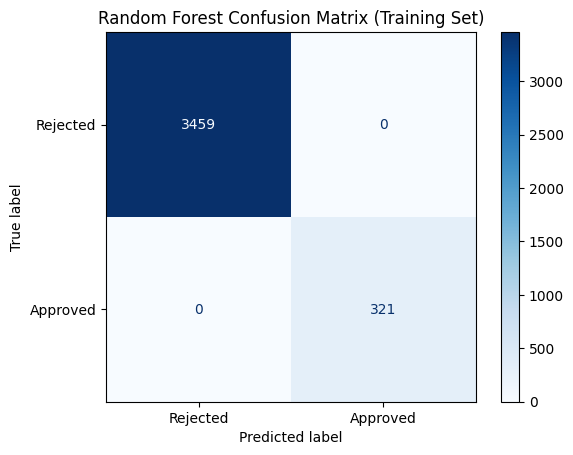

Test Accuracy: 0.99
Test Classification Report:
               precision    recall  f1-score   support

           0       0.98      1.00      0.99       856
           1       1.00      0.84      0.91        89

    accuracy                           0.99       945
   macro avg       0.99      0.92      0.95       945
weighted avg       0.99      0.99      0.98       945

Test Confusion Matrix:
 [[856   0]
 [ 14  75]]


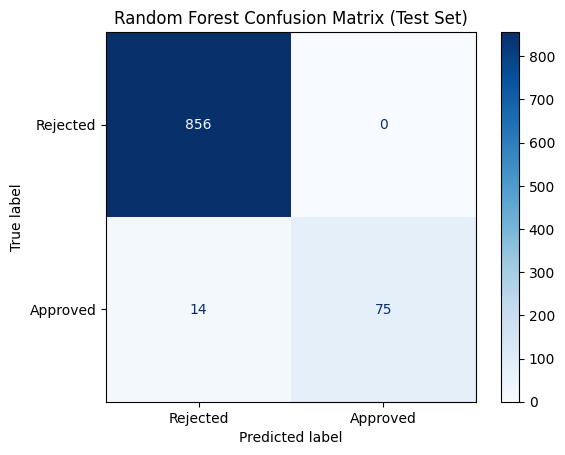


Gradient Boosting Performance:
Training Accuracy: 0.99
Training Classification Report:
               precision    recall  f1-score   support

           0       0.99      1.00      1.00      3459
           1       0.99      0.93      0.96       321

    accuracy                           0.99      3780
   macro avg       0.99      0.97      0.98      3780
weighted avg       0.99      0.99      0.99      3780

Training Confusion Matrix:
 [[3456    3]
 [  21  300]]


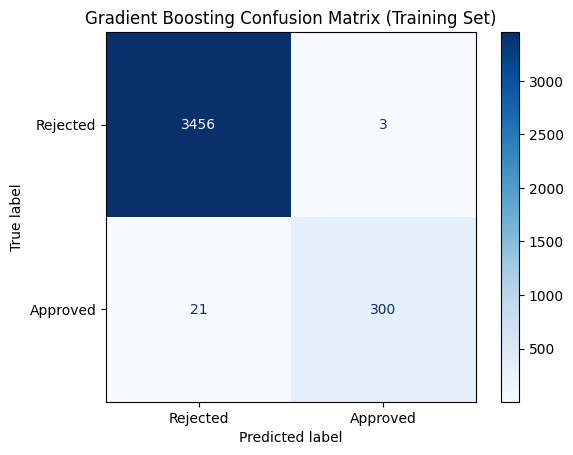

Test Accuracy: 0.99
Test Classification Report:
               precision    recall  f1-score   support

           0       0.99      1.00      0.99       856
           1       0.96      0.88      0.92        89

    accuracy                           0.99       945
   macro avg       0.98      0.94      0.95       945
weighted avg       0.98      0.99      0.98       945

Test Confusion Matrix:
 [[853   3]
 [ 11  78]]


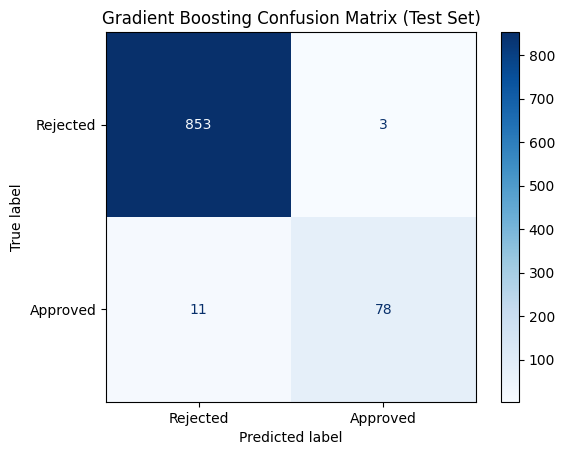

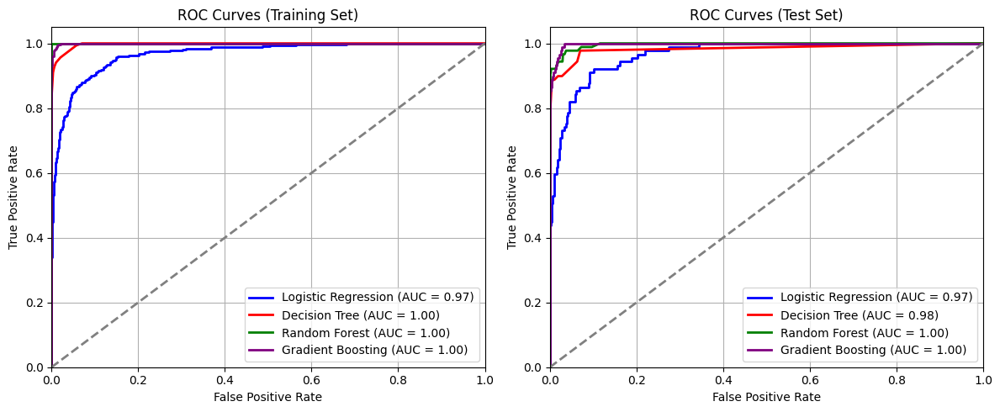

In [152]:
# Copy the preprocessed, scaled dataset containing features and target imbalanced dataset
df_bankloan_imbalance_no_tuning = df_bankloan_scaled.copy()

# Separate features and target
# X_no_tuning contains all features by dropping the target column "Personal.Loan.Status"
X_no_tuning = df_bankloan_imbalance_no_tuning.drop(columns=["Personal.Loan.Status"])
# y_no_tuning contains the target variable "Personal.Loan.Status"
y_no_tuning = df_bankloan_imbalance_no_tuning["Personal.Loan.Status"]

# Split data into training and test sets
# test_size=0.2 means 20% of data is used for testing, 80% for training
# random_state=42 ensures reproducibility of the split
X_train_no_tuning, X_test_no_tuning, y_train_no_tuning, y_test_no_tuning = train_test_split(
    X_no_tuning, y_no_tuning, test_size=0.2, random_state=42
)

# Dictionaries to store models and ROC data
# models_no_tuning will store trained model instances
models_no_tuning = {}
# roc_data_train_no_tuning and roc_data_test_no_tuning will store data for ROC curve plotting
roc_data_train_no_tuning = {}
roc_data_test_no_tuning = {}

# Function to evaluate and display model performance
def evaluate_model(model, model_name, X_train, X_test, y_train, y_test):
    # Fit the model
    # Train the model on the training data
    model.fit(X_train, y_train)
    
    # Predictions and probabilities
    # Predict class labels for training and test sets
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    # Predict probabilities for ROC curves (probability of positive class)
    y_prob_train = model.predict_proba(X_train)[:, 1]
    y_prob_test = model.predict_proba(X_test)[:, 1]
    
    # Training performance
    # Print model name and training accuracy
    print(f"\n{model_name} Performance:")
    print(f"Training Accuracy: {accuracy_score(y_train, y_pred_train):.2f}")
    # Print detailed classification metrics (precision, recall, f1-score)
    print("Training Classification Report:\n", classification_report(y_train, y_pred_train))
    # Print confusion matrix for training set
    print("Training Confusion Matrix:\n", confusion_matrix(y_train, y_pred_train))
    # Visualize confusion matrix for training set
    cm_train = confusion_matrix(y_train, y_pred_train)
    disp_train = ConfusionMatrixDisplay(confusion_matrix=cm_train, display_labels=["Rejected", "Approved"])
    disp_train.plot(cmap="Blues", values_format="d")
    plt.title(f"{model_name} Confusion Matrix (Training Set)")
    plt.show()
    
    # Test performance
    # Print test accuracy
    print(f"Test Accuracy: {accuracy_score(y_test, y_pred_test):.2f}")
    # Print detailed classification metrics for test set
    print("Test Classification Report:\n", classification_report(y_test, y_pred_test))
    # Print confusion matrix for test set
    print("Test Confusion Matrix:\n", confusion_matrix(y_test, y_pred_test))
    # Visualize confusion matrix for test set
    cm_test = confusion_matrix(y_test, y_pred_test)
    disp_test = ConfusionMatrixDisplay(confusion_matrix=cm_test, display_labels=["Rejected", "Approved"])
    disp_test.plot(cmap="Blues", values_format="d")
    plt.title(f"{model_name} Confusion Matrix (Test Set)")
    plt.show()
    
    # Store model and ROC data
    # Save the trained model in the models_no_tuning dictionary
    models_no_tuning[model_name] = model
    # Save true labels and predicted probabilities for ROC curves
    roc_data_train_no_tuning[model_name] = (y_train, y_prob_train)
    roc_data_test_no_tuning[model_name] = (y_test, y_prob_test)

# 1. Logistic Regression
# Initialize Logistic Regression model with max_iter=1000 to ensure convergence
lr_no_tuning = LogisticRegression(max_iter=1000)
# Evaluate the model using the evaluate_model function
evaluate_model(lr_no_tuning, "Logistic Regression", X_train_no_tuning, X_test_no_tuning, y_train_no_tuning, y_test_no_tuning)

# 2. Decision Tree
# Initialize Decision Tree model with max_depth=5 to limit tree depth and random_state=42 for reproducibility
dt_no_tuning = DecisionTreeClassifier(max_depth=5, random_state=42)
# Evaluate the model
evaluate_model(dt_no_tuning, "Decision Tree", X_train_no_tuning, X_test_no_tuning, y_train_no_tuning, y_test_no_tuning)

# 3. Random Forest
# Initialize Random Forest model with n_estimators=100 (number of trees) and random_state=42
rf_no_tuning = RandomForestClassifier(n_estimators=100, random_state=42)
# Evaluate the model
evaluate_model(rf_no_tuning, "Random Forest", X_train_no_tuning, X_test_no_tuning, y_train_no_tuning, y_test_no_tuning)

# 4. Gradient Boosting
# Initialize Gradient Boosting model with n_estimators=100, learning_rate=0.1, and random_state=42
gb_no_tuning = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, random_state=42)
# Evaluate the model
evaluate_model(gb_no_tuning, "Gradient Boosting", X_train_no_tuning, X_test_no_tuning, y_train_no_tuning, y_test_no_tuning)

# Plot ROC Curves
# Create a figure with two subplots for training and test ROC curves
plt.figure(figsize=(12, 5))

# ROC Curves for Training Set
plt.subplot(1, 2, 1)
# Define colors for each model's ROC curve
colors = ['blue', 'red', 'green', 'purple']
# Iterate through ROC data and colors to plot training set ROC curves
for (model_name, (y_true, y_prob)), color in zip(roc_data_train_no_tuning.items(), colors):
    # Compute False Positive Rate (FPR), True Positive Rate (TPR), and Area Under Curve (AUC)
    fpr, tpr, _ = roc_curve(y_true, y_prob)
    roc_auc = auc(fpr, tpr)
    # Plot ROC curve for each model
    plt.plot(fpr, tpr, color=color, lw=2, label=f'{model_name} (AUC = {roc_auc:.2f})')
# Plot diagonal line (random classifier baseline)
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
# Set plot limits and labels
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves (Training Set)')
plt.legend(loc="lower right")
plt.grid(True)

# ROC Curves for Test Set
plt.subplot(1, 2, 2)
# Iterate through ROC data and colors to plot test set ROC curves
for (model_name, (y_true, y_prob)), color in zip(roc_data_test_no_tuning.items(), colors):
    # Compute FPR, TPR, and AUC
    fpr, tpr, _ = roc_curve(y_true, y_prob)
    roc_auc = auc(fpr, tpr)
    # Plot ROC curve for each model
    plt.plot(fpr, tpr, color=color, lw=2, label=f'{model_name} (AUC = {roc_auc:.2f})')
# Plot diagonal line (random classifier baseline)
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
# Set plot limits and labels
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves (Test Set)')
plt.legend(loc="lower right")
plt.grid(True)

# Adjust layout to prevent overlap and display the plot
plt.tight_layout()
plt.show()

## **Summary of Metrics for the Assessment of the Models with Imbalanced Dataset and without Parameter Tuning**
- LR: Logistic Regression Model
- DT: Decision Tree Model
- RF: Random Forest Model
- GB: Gradient Boosting Model 

---

| Metrics  | LR - Training (%) | LR - Testing (%) | DT - Training (%)  | DT - Testing (%) | RF - Training (%) | RF - Testing (%) | GB - Training (%)  | GB - Testing (%) |
|----------|-------------|------------|---------------|---------------|-------------|------------|---------------|---------------|
| **Accuracy** | 96.0 | 95.0 | 99.0 | 99.0 | 100.0 | 99.0 | 99.0 | 99.0 |
| **Precision** | 83.0 | 79.0 | 96.0 | 95.0 | 100.0 | 100.0 | 99.0 | 96.0 |
| **F1 score** | 73.0 | 70.0 | 93.0 | 92.0 | 100.0 | 91.0 | 96.0 | 92.0 |
| **Recall** | 66.0 | 63.0 | 91.0 | 89.0 |  100.0 | 84.0 | 93.0 | 88.0 |
| **False Positive Rate** | - | - | - | - | - | - | - | - |
| **AUC value** | 97.0 | 97.0 | 100.0 | 98.0 | 100.0 | 100.0 | 100.0 | 100.0 |

c:\Users\OMEN 16\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\base.py:484: FutureWarning: `BaseEstimator._check_n_features` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation._check_n_features` instead.
  warnings.warn(
c:\Users\OMEN 16\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\base.py:493: FutureWarning: `BaseEstimator._check_feature_names` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation._check_feature_names` instead.
  warnings.warn(



Number of duplicated rows in resampled data: 1
Removed 1 duplicated rows. New dataset size: 8629


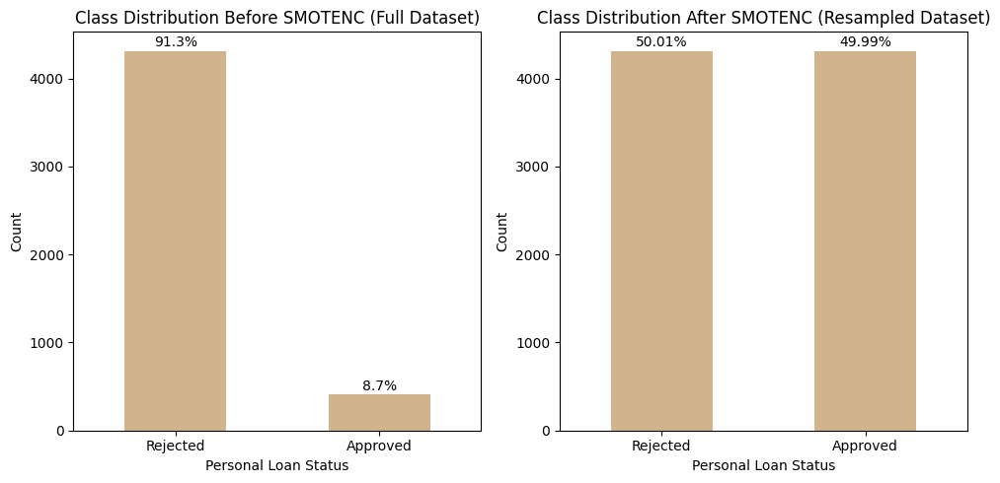

'\nDisplay the final plot with both "Before" and "After" class distributions.\n'

In [153]:
"""
This script performs oversampling on a bank loan dataset using SMOTENC (Synthetic Minority Oversampling Technique 
for Nominal and Continuous features) to address class imbalance in the 'Personal.Loan.Status' target variable. 
It visualizes the class distribution before and after resampling and handles duplicated rows in the resampled dataset.

Dependencies:
- imblearn.over_sampling.SMOTENC: For oversampling the minority class.
- matplotlib.pyplot: For plotting class distributions.
- pandas: For data manipulation and DataFrame operations.

Input:
- df_bankloan_scaled: A pre-scaled pandas DataFrame containing the bank loan dataset with features and the target variable.

Output:
- Visualizations of class distributions before and after SMOTENC.
- A balanced DataFrame (df_balanced) with resampled features and target.
- Printed information about duplicated rows and dataset size after removing the duplicates.
"""

# Create a copy of the scaled DataFrame to avoid modifying the original data
df_bankloan_resample = df_bankloan_scaled.copy()

# Define feature groups for SMOTENC
num_cont_features = ["Income", "Experience", "CCAvg"]
"""
List of numerical continuous features in the dataset.
These features are treated as continuous variables during SMOTENC oversampling.
"""

cat_disc_num_features = [
    "Securities.Account", "Certificate.Deposit.Account", "Online", "CreditCard",
    "Mortgage.Category", "Family", "Education", "ZIP_90", "ZIP_91", "ZIP_92",
    "ZIP_93", "ZIP_94", "ZIP_95"
]
"""
List of categorical or discrete numerical features.
These features are treated as categorical during SMOTENC oversampling.
"""

# Extract features (X) and target (y) from the full dataset
X_full = df_bankloan_resample[num_cont_features + cat_disc_num_features]
"""
Feature matrix containing both numerical continuous and categorical/discrete features.
"""

y_full = df_bankloan_resample['Personal.Loan.Status']
"""
Target variable indicating personal loan status (0 for Rejected, 1 for Approved).
"""

# Initialize a figure for plotting class distribution
plt.figure(figsize=(10, 5))
"""
Create a figure with a size of 10x5 inches to hold two subplots for class distribution visualization.
"""

# Plot class distribution before SMOTENC (full dataset)
plt.subplot(1, 2, 1)
"""
Create the first subplot (left) to show the class distribution before resampling.
"""

ax_before = pd.Series(y_full).value_counts().plot(kind='bar', color='tan')
"""
Plot a bar chart of the class distribution for the target variable before SMOTENC.
- value_counts(): Counts occurrences of each class (0 or 1).
- kind='bar': Specifies a bar plot.
- color='tan': Sets the bar color.
"""

plt.title('Class Distribution Before SMOTENC (Full Dataset)')
plt.xlabel('Personal Loan Status')
plt.ylabel('Count')
plt.xticks([0, 1], ['Rejected', 'Approved'], rotation=0)
"""
Set plot title, axis labels, and customize x-axis ticks to display 'Rejected' and 'Approved' instead of 0 and 1.
- rotation=0: Ensures tick labels are not rotated.
"""

# Add percentage labels to the "Before" plot
total_before = len(y_full)
"""
Calculate the total number of samples in the original dataset.
"""

for patch in ax_before.patches:
    height = patch.get_height()
    percentage = (height / total_before) * 100
    ax_before.text(
        patch.get_x() + patch.get_width() / 2, height + 50,
        f'{percentage:.1f}%', ha='center'
    )
"""
Annotate each bar with the percentage it represents.
- patch.get_height(): Gets the height (count) of the bar.
- percentage: Calculates the percentage of the total dataset.
- text(): Adds the percentage label above the bar, centered horizontally (ha='center').
- height + 50: Positions the label slightly above the bar.
- f'{percentage:.1f}%': Formats the percentage to one decimal place.
"""

# Get indices of categorical features for SMOTENC
cat_disc_num_indices = [
    X_full.columns.get_loc(col) for col in cat_disc_num_features
]
"""
List of column indices for categorical/discrete features in X_full.
- get_loc(col): Retrieves the index of each categorical feature in the feature matrix.
- Required by SMOTENC to identify which features are categorical.
"""

# Apply SMOTENC to balance the full dataset
smotenc = SMOTENC(
    categorical_features=cat_disc_num_indices,
    random_state=42,
    sampling_strategy='auto'
)
"""
Initialize SMOTENC for oversampling.
- categorical_features: Indices of categorical features.
- random_state=42: Ensures reproducibility.
- sampling_strategy='auto': Balances classes by oversampling the minority class to match the majority class.
"""

X_balanced, y_balanced = smotenc.fit_resample(X_full, y_full)
"""
Apply SMOTENC to resample the dataset.
- fit_resample(): Generates synthetic samples for the minority class.
- Returns X_balanced (resampled features) and y_balanced (resampled target).
"""

# Create DataFrame for resampled data
df_balanced = pd.DataFrame(
    X_balanced,
    columns=num_cont_features + cat_disc_num_features
)
"""
Create a DataFrame from the resampled features.
- columns: Use the original feature names for the DataFrame.
"""

df_balanced['Personal.Loan.Status'] = y_balanced
"""
Add the resampled target variable as a new column in the DataFrame.
"""

# Check for and handle duplicated rows
duplicate_count = df_balanced.duplicated().sum()
"""
Count the number of duplicated rows in the resampled DataFrame.
- duplicated(): Identifies duplicate rows.
- sum(): Counts the total number of duplicates.
"""

print(f"\nNumber of duplicated rows in resampled data: {duplicate_count}")
"""
Print the number of duplicated rows found in the resampled dataset.
"""

if duplicate_count > 0:
    df_balanced = df_balanced.drop_duplicates().reset_index(drop=True)
    """
    Remove duplicated rows and reset the DataFrame index.
    - drop_duplicates(): Removes duplicate rows.
    - reset_index(drop=True): Resets the index to start from 0, dropping the old index.
    """
    
    X_balanced = df_balanced.drop(columns=['Personal.Loan.Status'])
    """
    Update the resampled feature matrix by dropping the target column.
    """
    
    y_balanced = df_balanced['Personal.Loan.Status']
    """
    Update the resampled target variable.
    """
    
    print(f"Removed {duplicate_count} duplicated rows. New dataset size: {len(y_balanced)}")
    """
    Print the number of duplicates removed and the new dataset size.
    """

# Plot class distribution after SMOTENC (resampled dataset)
plt.subplot(1, 2, 2)
"""
Create the second subplot (right) to show the class distribution after resampling.
"""

ax_after = pd.Series(y_balanced).value_counts().plot(kind='bar', color='tan')
"""
Plot a bar chart of the class distribution for the target variable after SMOTENC.
- Similar to the "Before" plot but for the resampled data.
"""

plt.title('Class Distribution After SMOTENC (Resampled Dataset)')
plt.xlabel('Personal Loan Status')
plt.ylabel('Count')
plt.xticks([0, 1], ['Rejected', 'Approved'], rotation=0)
"""
Set plot title, axis labels, and customize x-axis ticks for the "After" plot.
"""

# Add percentage labels to the "After" plot
total_after = len(y_balanced)
"""
Calculate the total number of samples in the resampled dataset.
"""

for patch in ax_after.patches:
    height = patch.get_height()
    percentage = (height / total_after) * 100
    ax_after.text(
        patch.get_x() + patch.get_width() / 2, height + 50,
        f'{percentage:.2f}%', ha='center'
    )
"""
Annotate each bar with the percentage it represents for the resampled dataset.
- Similar to the "Before" plot but formats percentage to two decimal places for precision.
"""

# Adjust layout and display the plot
plt.tight_layout()
"""
Adjust the layout to prevent overlap between subplots.
"""

plt.show()
"""
Display the final plot with both "Before" and "After" class distributions.
"""

In [154]:
df_balanced.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8629 entries, 0 to 8628
Data columns (total 17 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Income                       8629 non-null   float64
 1   Experience                   8629 non-null   float64
 2   CCAvg                        8629 non-null   float64
 3   Securities.Account           8629 non-null   float64
 4   Certificate.Deposit.Account  8629 non-null   float64
 5   Online                       8629 non-null   float64
 6   CreditCard                   8629 non-null   float64
 7   Mortgage.Category            8629 non-null   float64
 8   Family                       8629 non-null   float64
 9   Education                    8629 non-null   float64
 10  ZIP_90                       8629 non-null   float64
 11  ZIP_91                       8629 non-null   float64
 12  ZIP_92                       8629 non-null   float64
 13  ZIP_93            

In [155]:
print(f'The duplicate in the oversampled data is: {df_balanced.duplicated().sum()}') # Show duplicate rows

The duplicate in the oversampled data is: 0


In [156]:
# save data
df_balanced.to_csv('bank_loan_approval_prediction_clean.csv', index=False)

In [157]:
# Now df_resampled contains the balanced dataset
df_bankloan_balance = df_balanced.copy()

# The four algorithms were trained with the balanced dataset and without tuning the algorithm parameters.


Logistic Regression Performance:
Training Accuracy: 0.92
Training Classification Report:
               precision    recall  f1-score   support

           0       0.93      0.91      0.92      3444
           1       0.92      0.93      0.92      3459

    accuracy                           0.92      6903
   macro avg       0.92      0.92      0.92      6903
weighted avg       0.92      0.92      0.92      6903

Training Confusion Matrix:
 [[3149  295]
 [ 248 3211]]


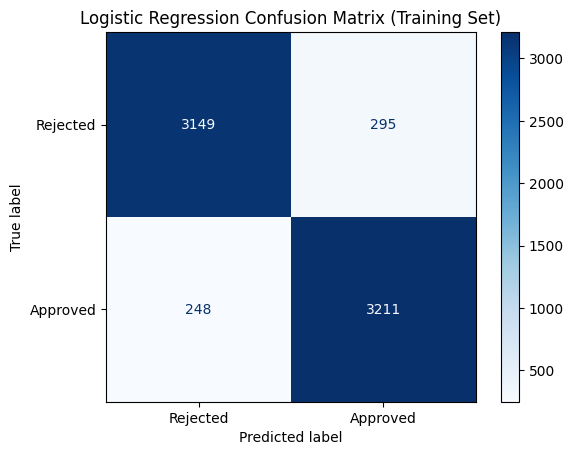

Test Accuracy: 0.92
Test Classification Report:
               precision    recall  f1-score   support

           0       0.93      0.91      0.92       870
           1       0.91      0.93      0.92       856

    accuracy                           0.92      1726
   macro avg       0.92      0.92      0.92      1726
weighted avg       0.92      0.92      0.92      1726

Test Confusion Matrix:
 [[795  75]
 [ 63 793]]


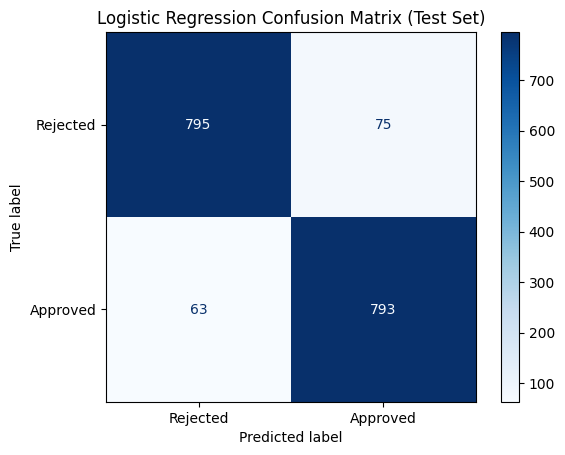


Decision Tree Performance:
Training Accuracy: 0.98
Training Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.98      0.98      3444
           1       0.98      0.98      0.98      3459

    accuracy                           0.98      6903
   macro avg       0.98      0.98      0.98      6903
weighted avg       0.98      0.98      0.98      6903

Training Confusion Matrix:
 [[3362   82]
 [  85 3374]]


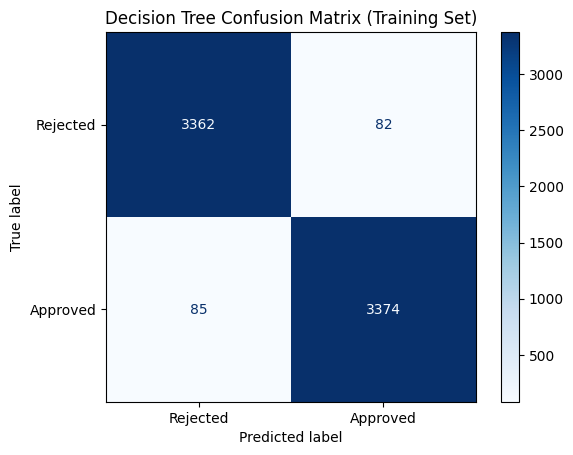

Test Accuracy: 0.98
Test Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.98      0.98       870
           1       0.98      0.98      0.98       856

    accuracy                           0.98      1726
   macro avg       0.98      0.98      0.98      1726
weighted avg       0.98      0.98      0.98      1726

Test Confusion Matrix:
 [[853  17]
 [ 21 835]]


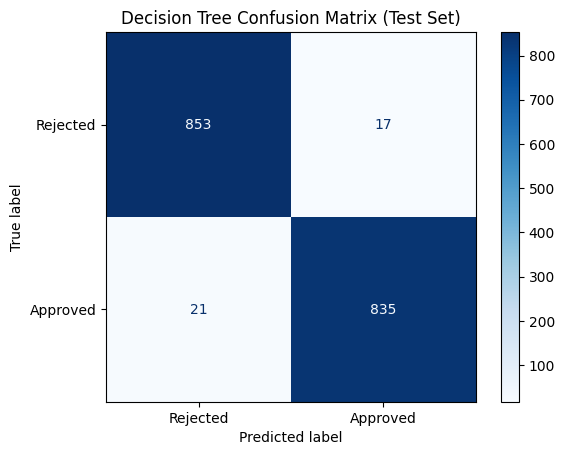


Random Forest Performance:
Training Accuracy: 1.00
Training Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      3444
           1       1.00      1.00      1.00      3459

    accuracy                           1.00      6903
   macro avg       1.00      1.00      1.00      6903
weighted avg       1.00      1.00      1.00      6903

Training Confusion Matrix:
 [[3444    0]
 [   0 3459]]


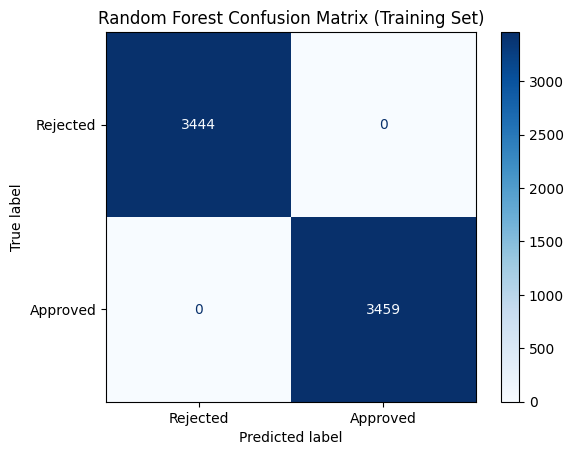

Test Accuracy: 0.99
Test Classification Report:
               precision    recall  f1-score   support

           0       0.99      0.99      0.99       870
           1       0.99      0.99      0.99       856

    accuracy                           0.99      1726
   macro avg       0.99      0.99      0.99      1726
weighted avg       0.99      0.99      0.99      1726

Test Confusion Matrix:
 [[859  11]
 [  8 848]]


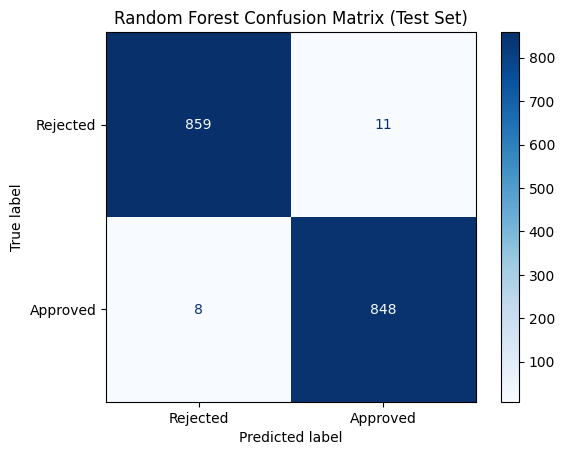


Gradient Boosting Performance:
Training Accuracy: 0.99
Training Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.99      0.99      3444
           1       0.99      0.98      0.99      3459

    accuracy                           0.99      6903
   macro avg       0.99      0.99      0.99      6903
weighted avg       0.99      0.99      0.99      6903

Training Confusion Matrix:
 [[3401   43]
 [  55 3404]]


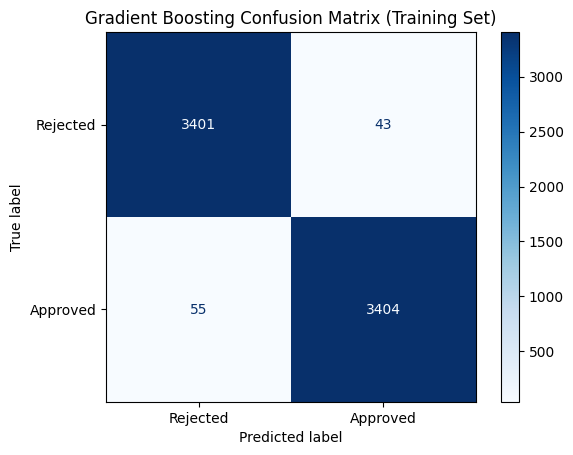

Test Accuracy: 0.98
Test Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.98      0.98       870
           1       0.98      0.98      0.98       856

    accuracy                           0.98      1726
   macro avg       0.98      0.98      0.98      1726
weighted avg       0.98      0.98      0.98      1726

Test Confusion Matrix:
 [[855  15]
 [ 16 840]]


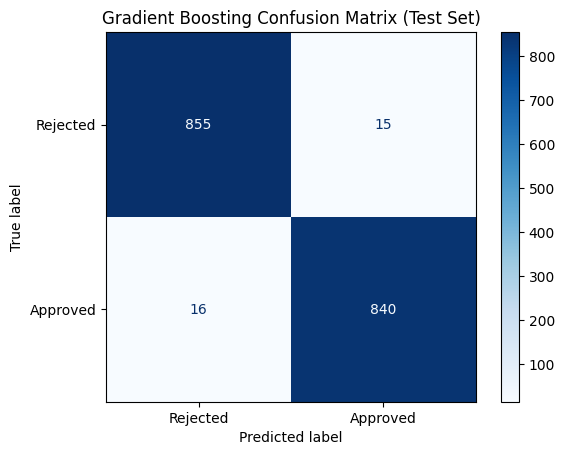

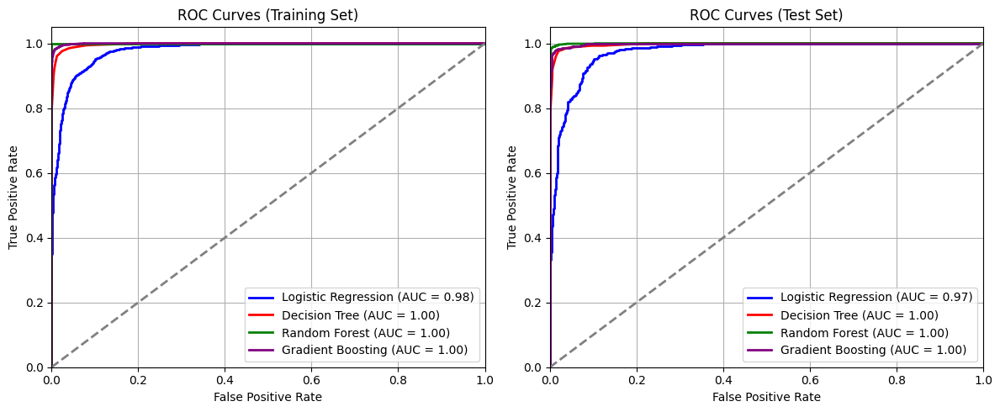

In [158]:
# Copy the balanced dataset
df_bankloan_balance_no_tuning = df_bankloan_balance.copy()

# Separate features and target
X_no_tuning = df_bankloan_balance_no_tuning.drop(columns=["Personal.Loan.Status"])
y_no_tuning = df_bankloan_balance_no_tuning["Personal.Loan.Status"]

# Split data into training and test sets
X_train_no_tuning, X_test_no_tuning, y_train_no_tuning, y_test_no_tuning = train_test_split(
    X_no_tuning, y_no_tuning, test_size=0.2, random_state=42
)

# Dictionaries to store models and ROC data
models_no_tuning = {}
roc_data_train_no_tuning = {}
roc_data_test_no_tuning = {}


# # Function to evaluate and display model performance
# def evaluate_model(model, model_name, X_train, X_test, y_train, y_test): - The function from the model trained with imbalanced dataset is used here

# 1. Logistic Regression
lr_no_tuning = LogisticRegression(max_iter=1000)
evaluate_model(lr_no_tuning, "Logistic Regression", X_train_no_tuning, X_test_no_tuning, y_train_no_tuning, y_test_no_tuning)

# 2. Decision Tree
dt_no_tuning = DecisionTreeClassifier(max_depth=5, random_state=42)
evaluate_model(dt_no_tuning, "Decision Tree", X_train_no_tuning, X_test_no_tuning, y_train_no_tuning, y_test_no_tuning)

# 3. Random Forest
rf_no_tuning = RandomForestClassifier(n_estimators=100, random_state=42)
evaluate_model(rf_no_tuning, "Random Forest", X_train_no_tuning, X_test_no_tuning, y_train_no_tuning, y_test_no_tuning)

# 4. Gradient Boosting
gb_no_tuning = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, random_state=42)
evaluate_model(gb_no_tuning, "Gradient Boosting", X_train_no_tuning, X_test_no_tuning, y_train_no_tuning, y_test_no_tuning)

# Plot ROC Curves
plt.figure(figsize=(12, 5))

# ROC Curves for Training Set
plt.subplot(1, 2, 1)
colors = ['blue', 'red', 'green', 'purple']
for (model_name, (y_true, y_prob)), color in zip(roc_data_train_no_tuning.items(), colors):
    fpr, tpr, _ = roc_curve(y_true, y_prob)
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, color=color, lw=2, label=f'{model_name} (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves (Training Set)')
plt.legend(loc="lower right")
plt.grid(True)

# ROC Curves for Test Set
plt.subplot(1, 2, 2)
for (model_name, (y_true, y_prob)), color in zip(roc_data_test_no_tuning.items(), colors):
    fpr, tpr, _ = roc_curve(y_true, y_prob)
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, color=color, lw=2, label=f'{model_name} (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves (Test Set)')
plt.legend(loc="lower right")
plt.grid(True)

plt.tight_layout()
plt.show()

## **Summary of Metrics for the Assessment of the Models with Balanced Dataset and without Parameter Tuning**
- LR: Logistic Regression Model
- DT: Decision Tree Model
- RF: Random Forest Model
- GB: Gradient Boosting Model 

---

| Metrics  | LR - Training (%) | LR - Testing (%) | DT - Training (%)  | DT - Testing (%) | RF - Training (%) | RF - Testing (%) | GB - Training (%)  | GB - Testing (%) |
|----------|-------------|------------|---------------|---------------|-------------|------------|---------------|---------------|
| **Accuracy** | 92.0 | 92.0 | 98.0 | 98.0 | 100.0 | 99.0 | 99.0 | 98.0 |
| **Precision** | 92.0 | 91.0 | 98.0 | 98.0 | 100.0 | 99.0 | 99.0 | 98.0 |
| **F1 score** | 92.0 | 92.0 | 98.0 | 98.0 | 100.0 | 99.0 | 99.0 | 98.0 |
| **Recall** | 93.0 | 93.0 | 98.0 | 98.0 |  100.0 | 99.0 | 98.0 | 98.0 |
| **False Positive Rate** | - | - | - | - | - | - | - | - |
| **AUC value** | 98.0 | 97.0 | 100.0 | 100.0 | 100.0 | 100.0 | 100.0 | 100.0 |

# The four algorithms were trained with the balanced dataset and with tuning the algorithm parameters.

Dataset shape: (8629, 17)
Class distribution:
 Personal.Loan.Status
1    4315
0    4314
Name: count, dtype: int64
Training set size: 6903, Test set size: 1726


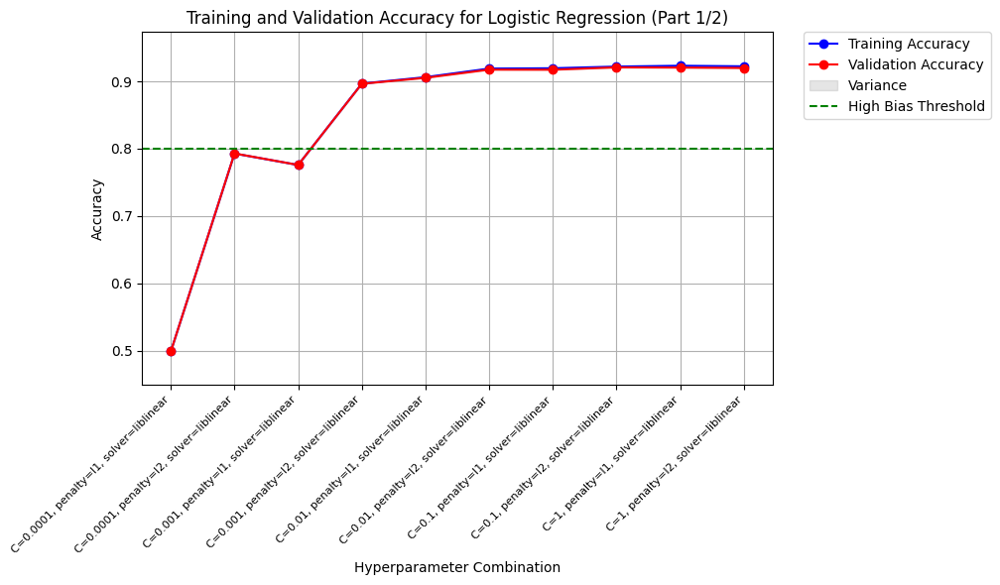

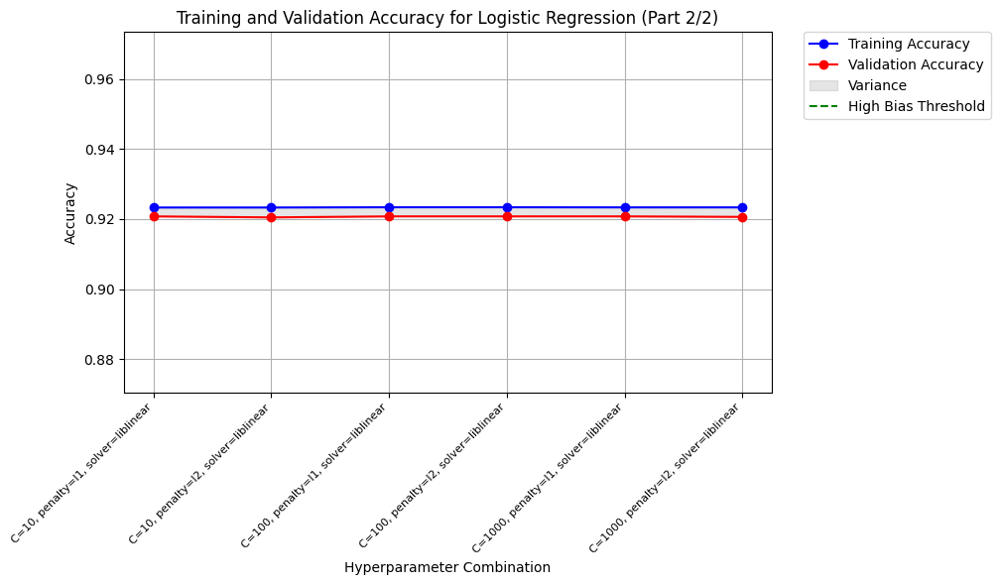


Logistic Regression CV Results:
Fold 1 - Training Accuracy: 0.922, Validation Accuracy: 0.920
Fold 2 - Training Accuracy: 0.924, Validation Accuracy: 0.908
Fold 3 - Training Accuracy: 0.923, Validation Accuracy: 0.919
Fold 4 - Training Accuracy: 0.920, Validation Accuracy: 0.927
Fold 5 - Training Accuracy: 0.920, Validation Accuracy: 0.930
Best Parameters: {'C': 0.1, 'penalty': 'l2', 'solver': 'liblinear'}
Best Cross-Validation Score: 0.921
Saved Logistic Regression best model to 'Logistic Regression_best_model.joblib'

Logistic Regression Performance (Best Model):
Training Accuracy: 0.923
Validation Accuracy (Best CV Score): 0.921
Test Accuracy: 0.922
Training False Positive Rate: 0.093
Test False Positive Rate: 0.094
Training Precision (Approved): 0.910
Training Recall (Approved): 0.938
Training F1-Score (Approved): 0.924
Test Precision (Approved): 0.907
Test Recall (Approved): 0.939
Test F1-Score (Approved): 0.923
Training Classification Report:
               precision    recall  

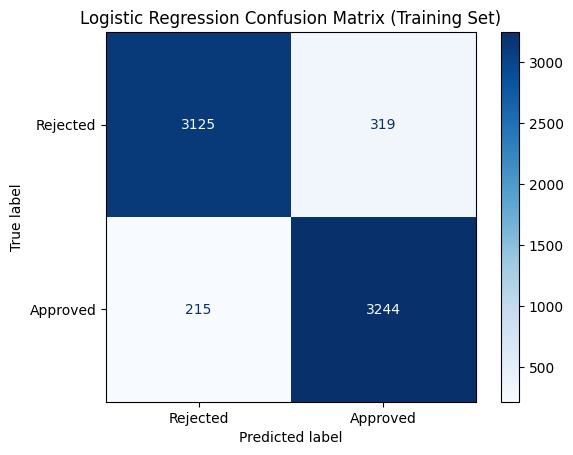

Test Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.91      0.92       870
           1       0.91      0.94      0.92       856

    accuracy                           0.92      1726
   macro avg       0.92      0.92      0.92      1726
weighted avg       0.92      0.92      0.92      1726

Test Confusion Matrix:
 [[788  82]
 [ 52 804]]


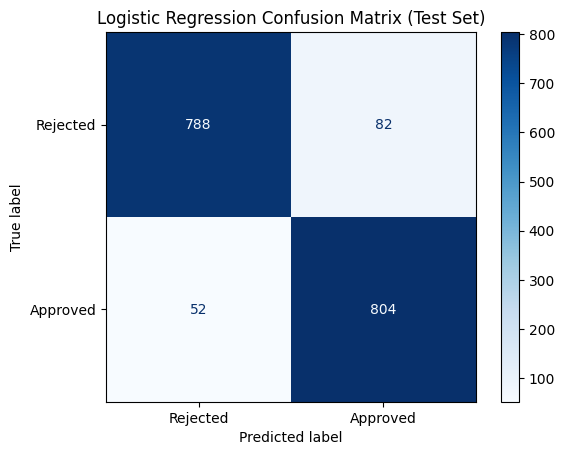

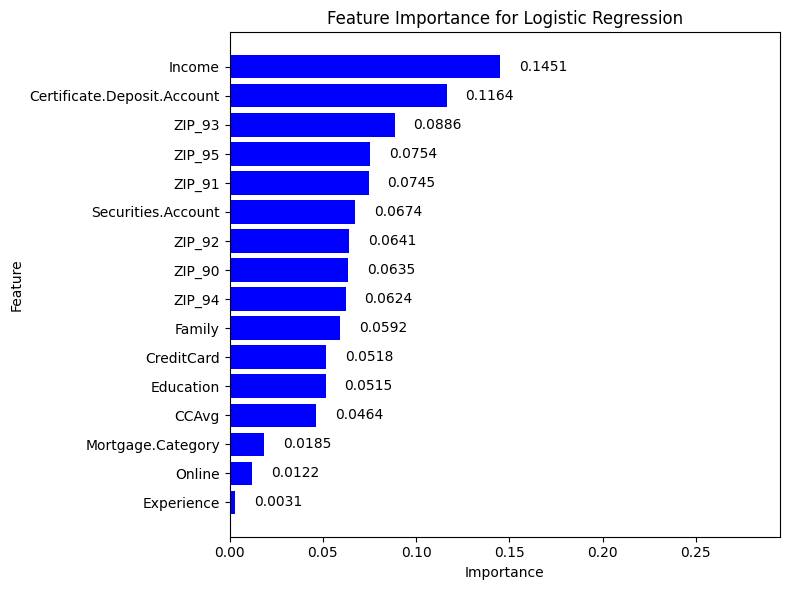


=== Decision Tree Analysis with Pruning ===


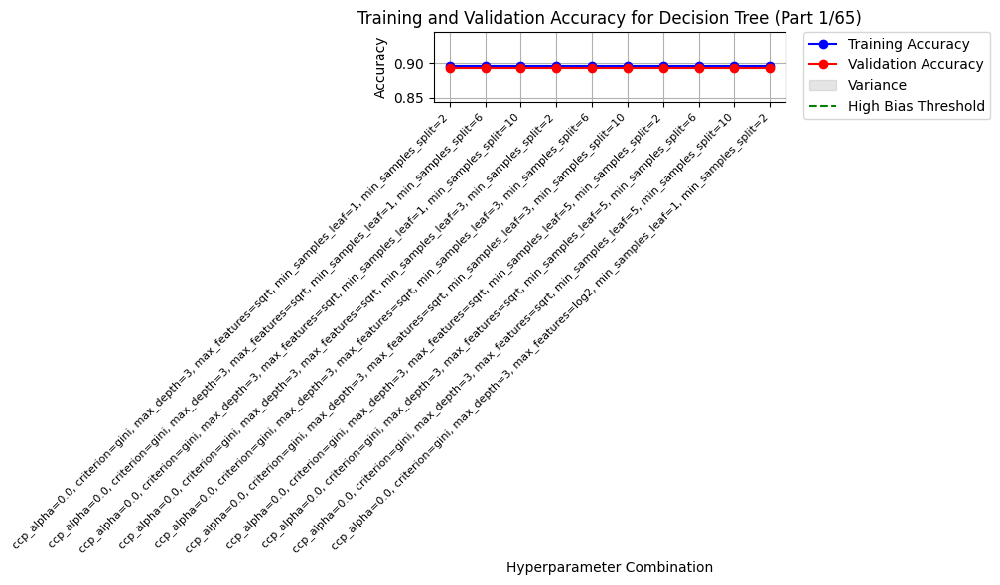

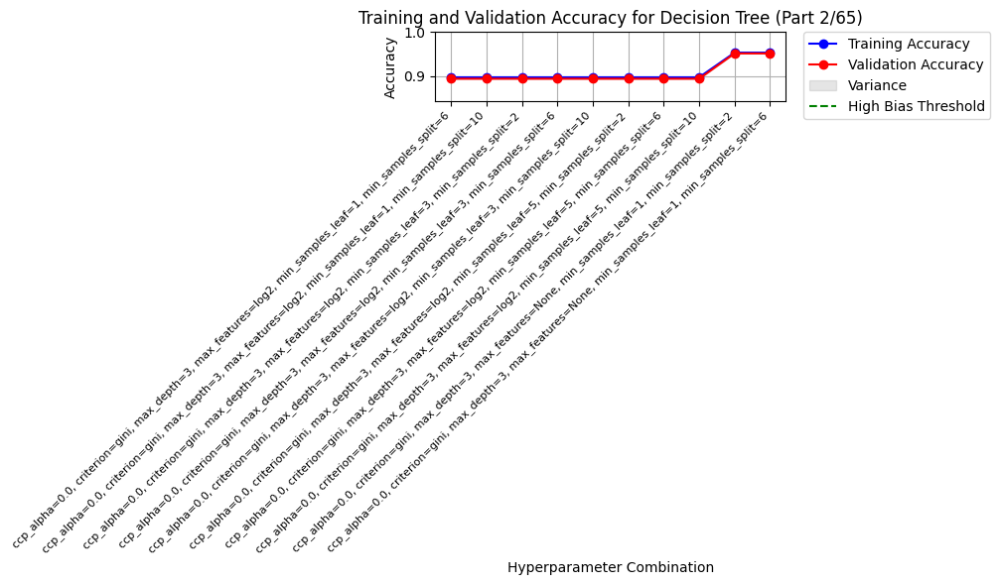

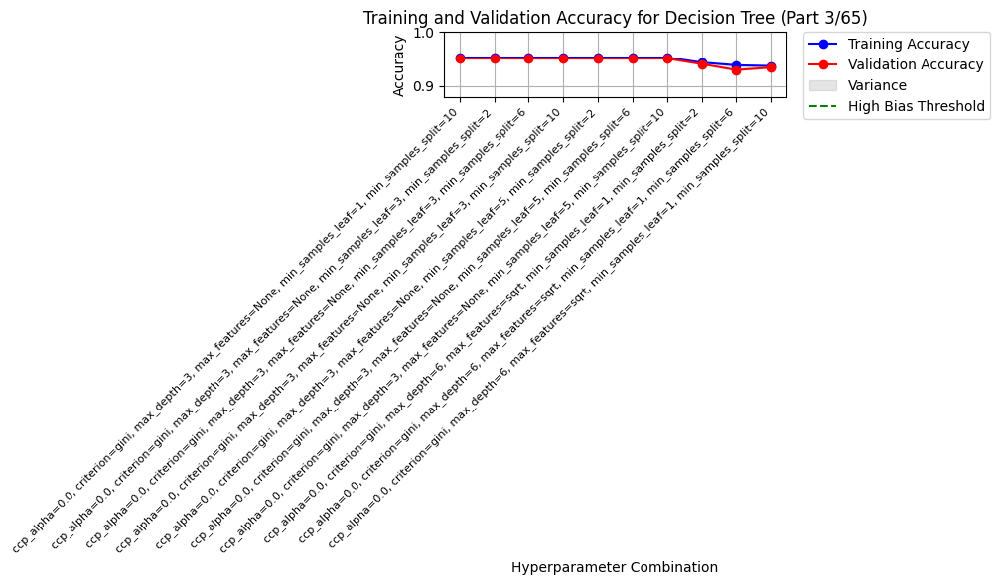

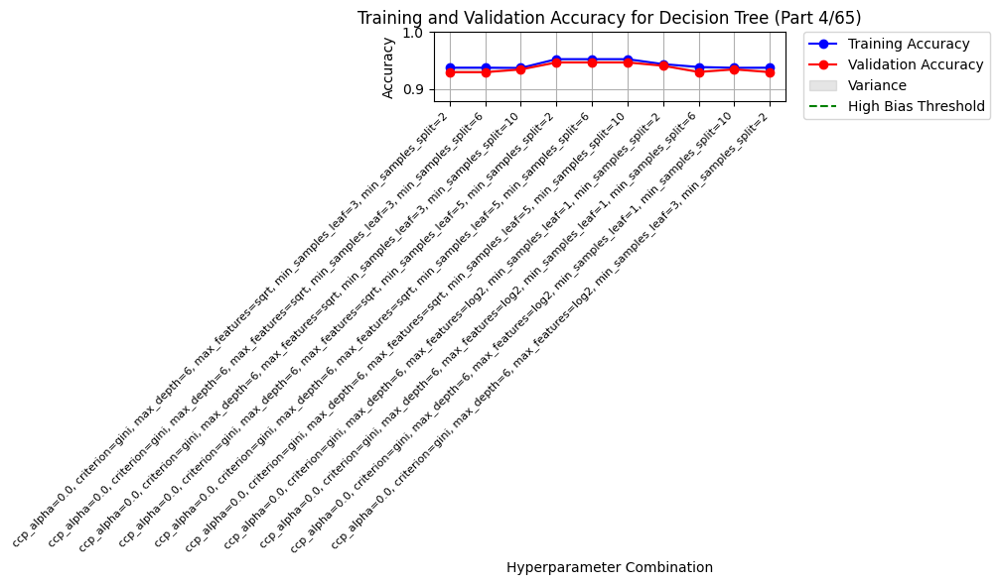

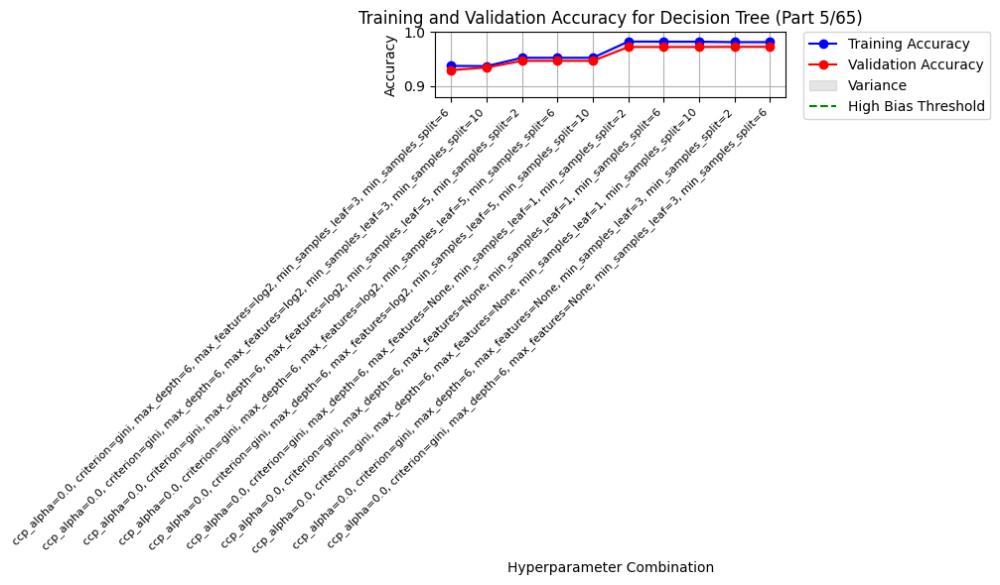

...

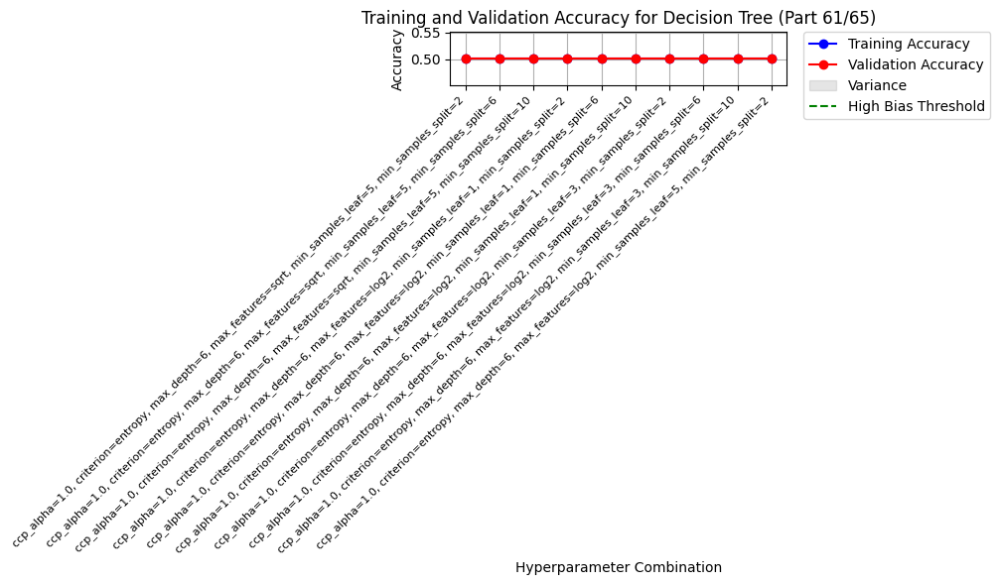

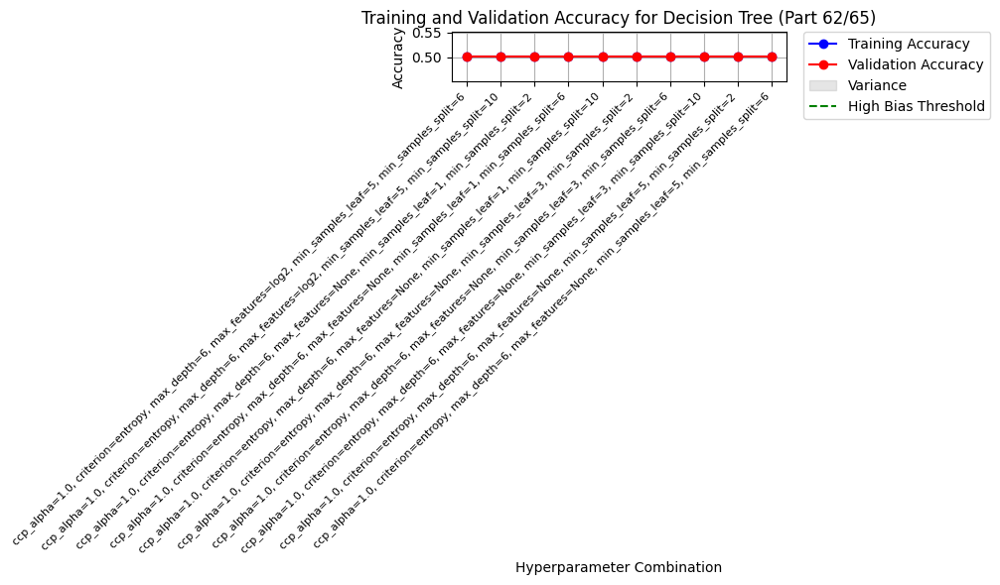

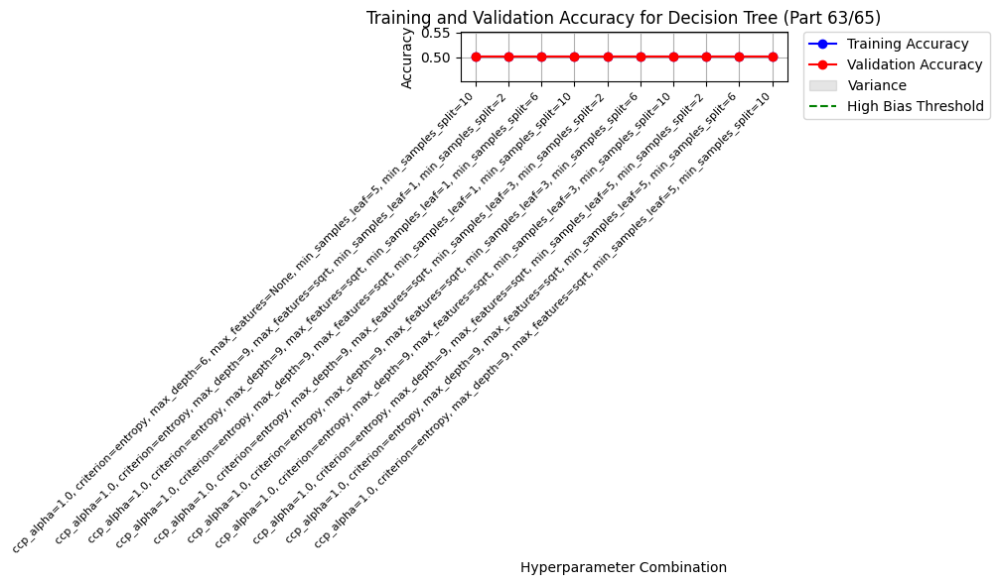

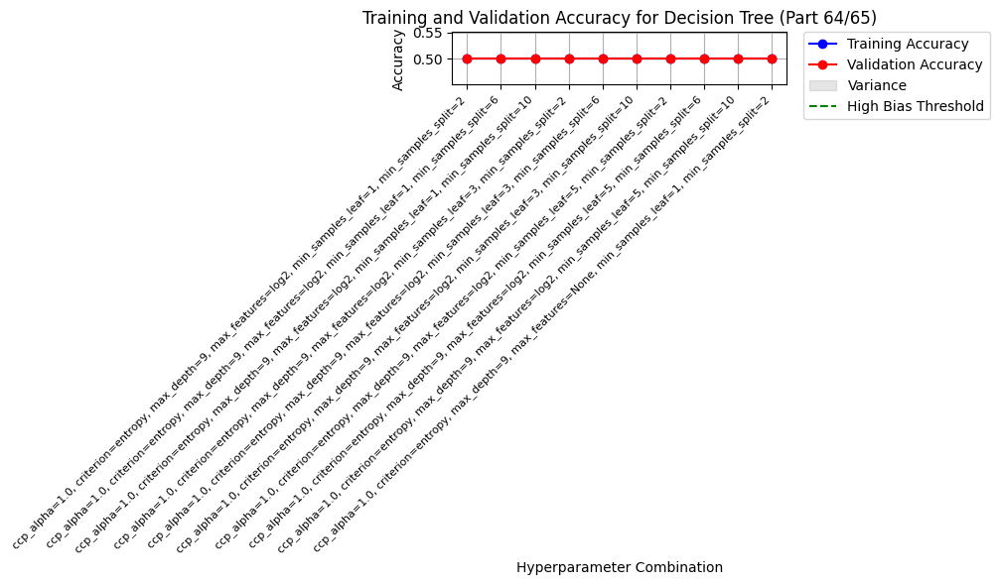

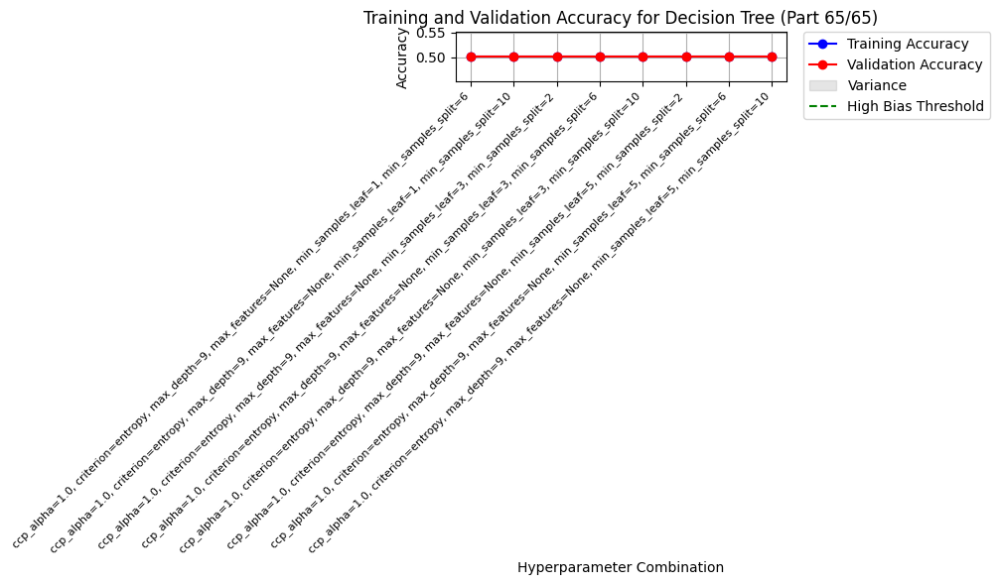


Decision Tree CV Results:
Fold 1 - Training Accuracy: 0.991, Validation Accuracy: 0.982
Fold 2 - Training Accuracy: 0.991, Validation Accuracy: 0.976
Fold 3 - Training Accuracy: 0.988, Validation Accuracy: 0.979
Fold 4 - Training Accuracy: 0.989, Validation Accuracy: 0.977
Fold 5 - Training Accuracy: 0.989, Validation Accuracy: 0.980
Best Parameters: {'ccp_alpha': 0.0, 'criterion': 'entropy', 'max_depth': 9, 'max_features': None, 'min_samples_leaf': 1, 'min_samples_split': 10}
Best Cross-Validation Score: 0.979
Saved Decision Tree best model to 'Decision Tree_best_model.joblib'

Decision Tree Performance (Best Model):
Training Accuracy: 0.989
Validation Accuracy (Best CV Score): 0.979
Test Accuracy: 0.984
Training False Positive Rate: 0.012
Test False Positive Rate: 0.014
Training Precision (Approved): 0.988
Training Recall (Approved): 0.990
Training F1-Score (Approved): 0.989
Test Precision (Approved): 0.986
Test Recall (Approved): 0.982
Test F1-Score (Approved): 0.984
Training Class

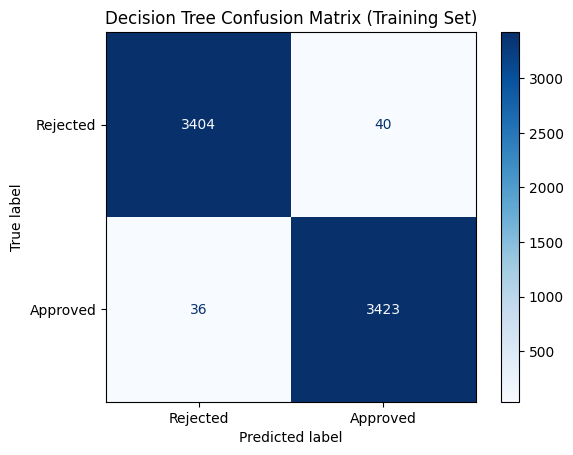

Test Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.99      0.98       870
           1       0.99      0.98      0.98       856

    accuracy                           0.98      1726
   macro avg       0.98      0.98      0.98      1726
weighted avg       0.98      0.98      0.98      1726

Test Confusion Matrix:
 [[858  12]
 [ 15 841]]


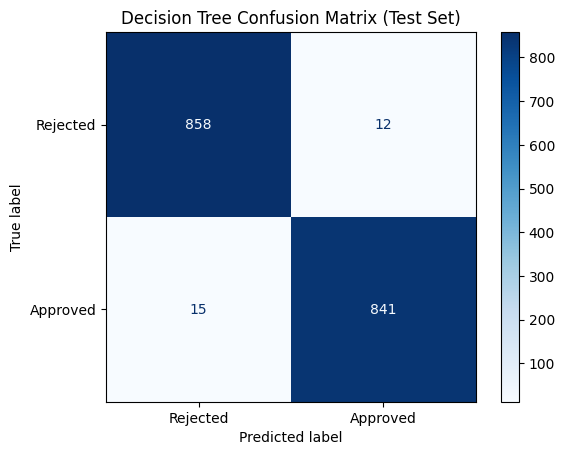

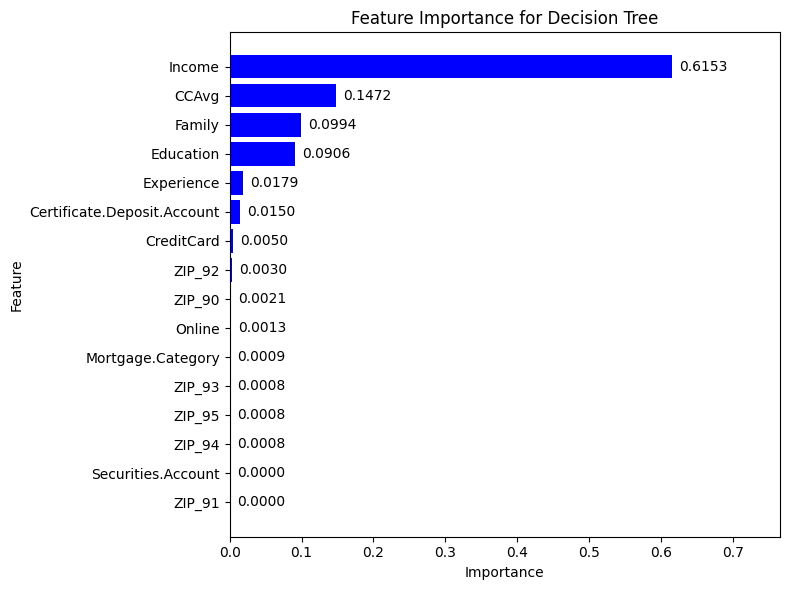


=== Random Forest Analysis ===


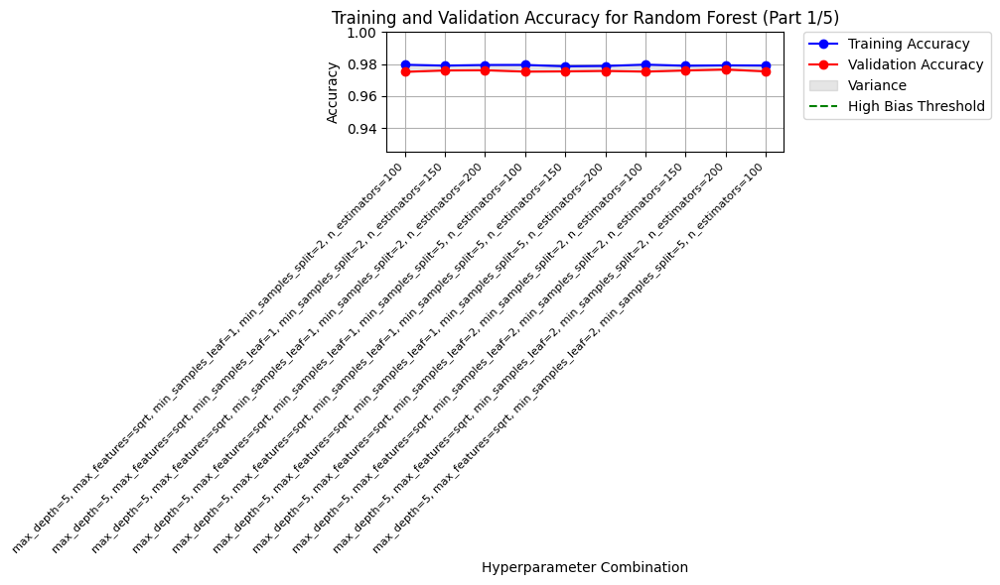

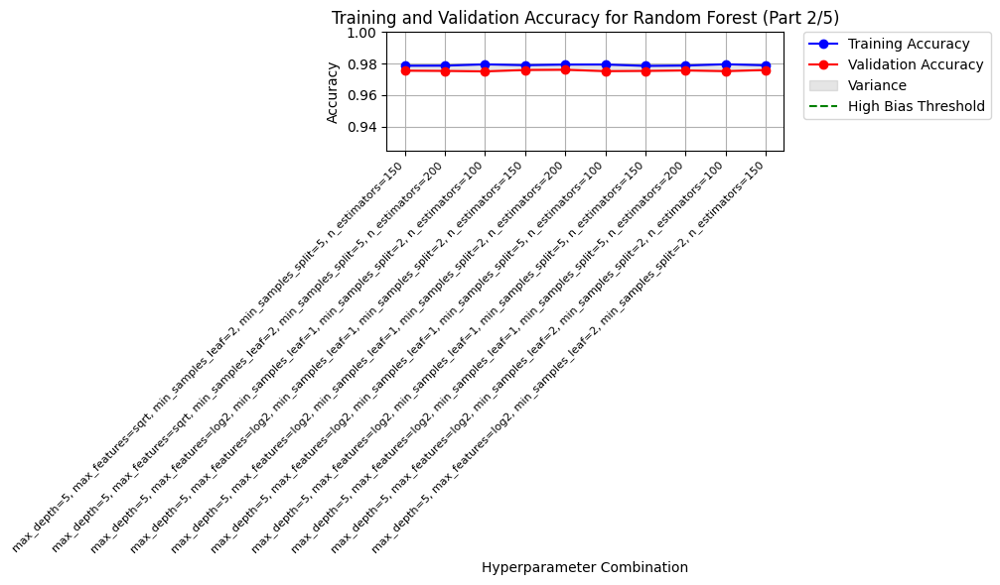

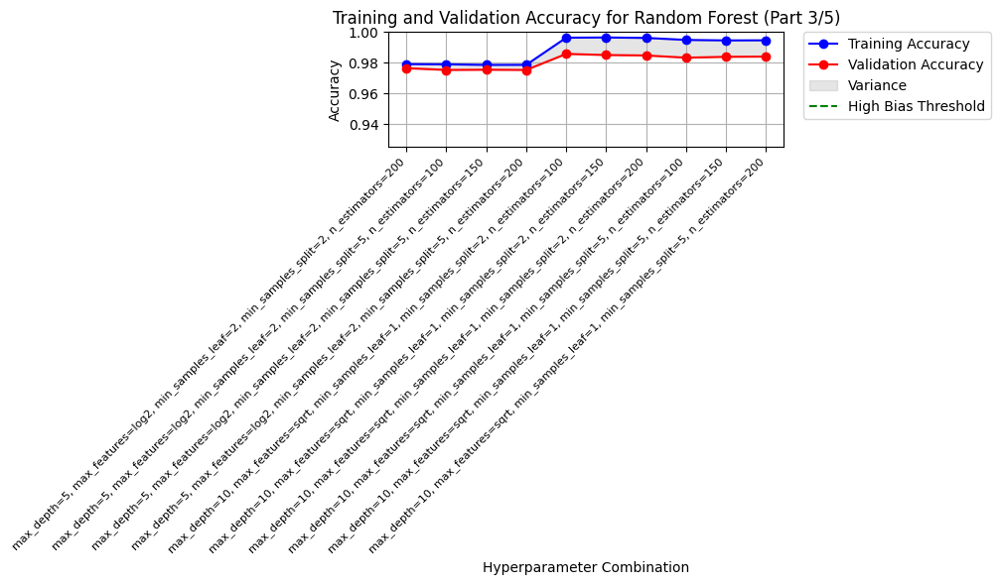

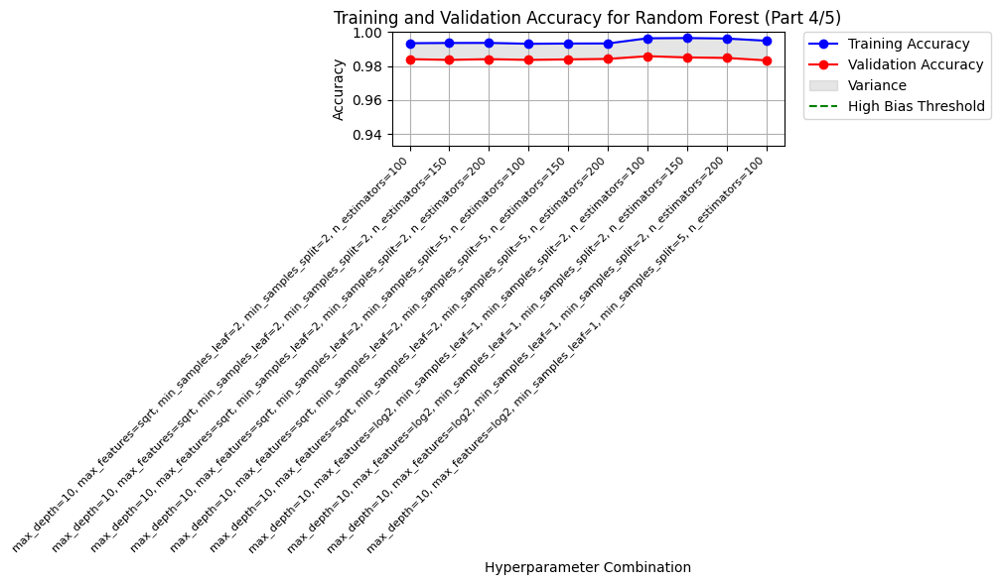

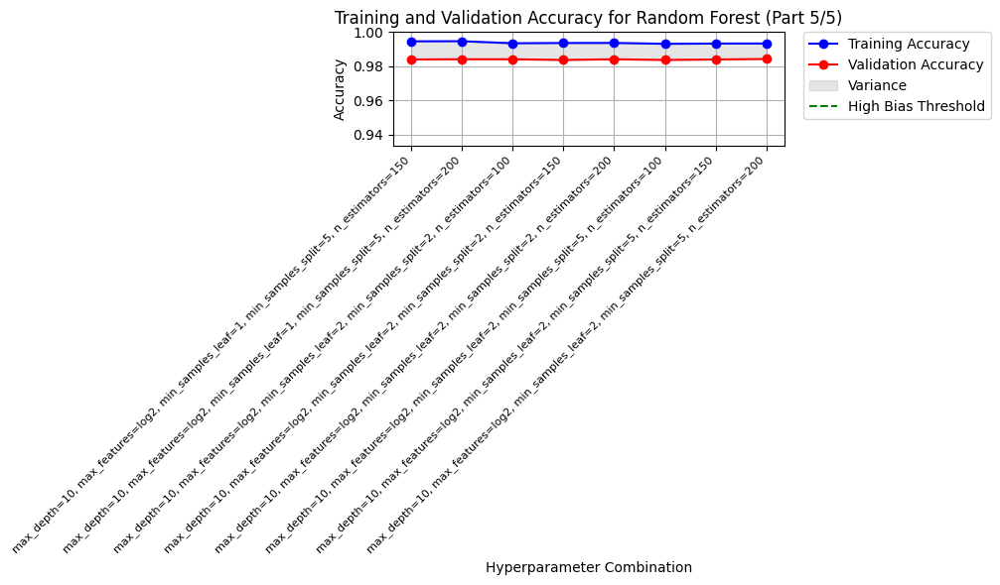


Random Forest CV Results:
Fold 1 - Training Accuracy: 0.995, Validation Accuracy: 0.988
Fold 2 - Training Accuracy: 0.996, Validation Accuracy: 0.980
Fold 3 - Training Accuracy: 0.997, Validation Accuracy: 0.990
Fold 4 - Training Accuracy: 0.997, Validation Accuracy: 0.983
Fold 5 - Training Accuracy: 0.997, Validation Accuracy: 0.988
Best Parameters: {'max_depth': 10, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
Best Cross-Validation Score: 0.986
Saved Random Forest best model to 'Random Forest_best_model.joblib'

Random Forest Performance (Best Model):
Training Accuracy: 0.996
Validation Accuracy (Best CV Score): 0.986
Test Accuracy: 0.988
Training False Positive Rate: 0.004
Test False Positive Rate: 0.013
Training Precision (Approved): 0.996
Training Recall (Approved): 0.996
Training F1-Score (Approved): 0.996
Test Precision (Approved): 0.987
Test Recall (Approved): 0.988
Test F1-Score (Approved): 0.988
Training Classification Report:
 

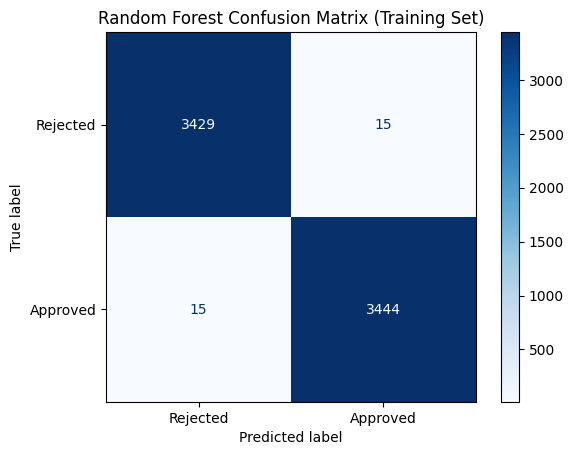

Test Classification Report:
               precision    recall  f1-score   support

           0       0.99      0.99      0.99       870
           1       0.99      0.99      0.99       856

    accuracy                           0.99      1726
   macro avg       0.99      0.99      0.99      1726
weighted avg       0.99      0.99      0.99      1726

Test Confusion Matrix:
 [[859  11]
 [ 10 846]]


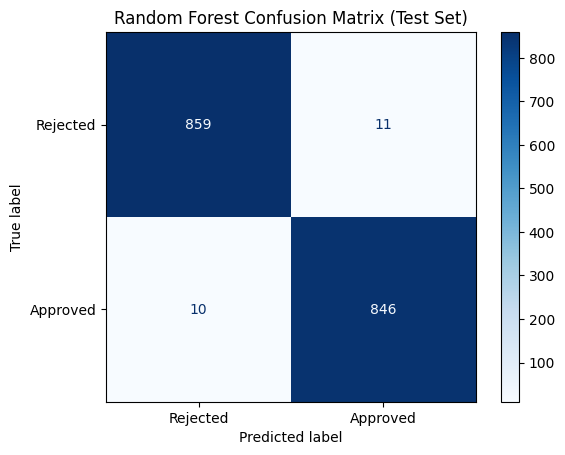

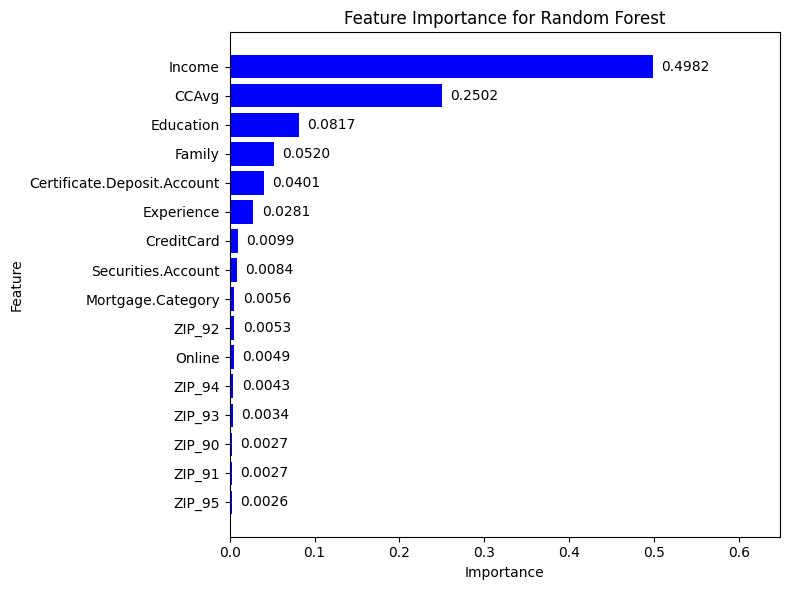

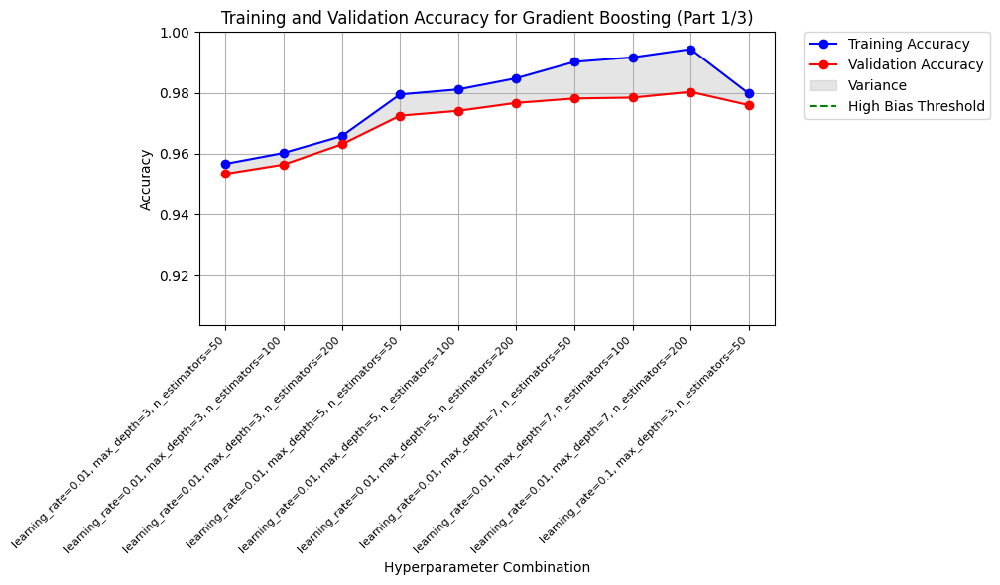

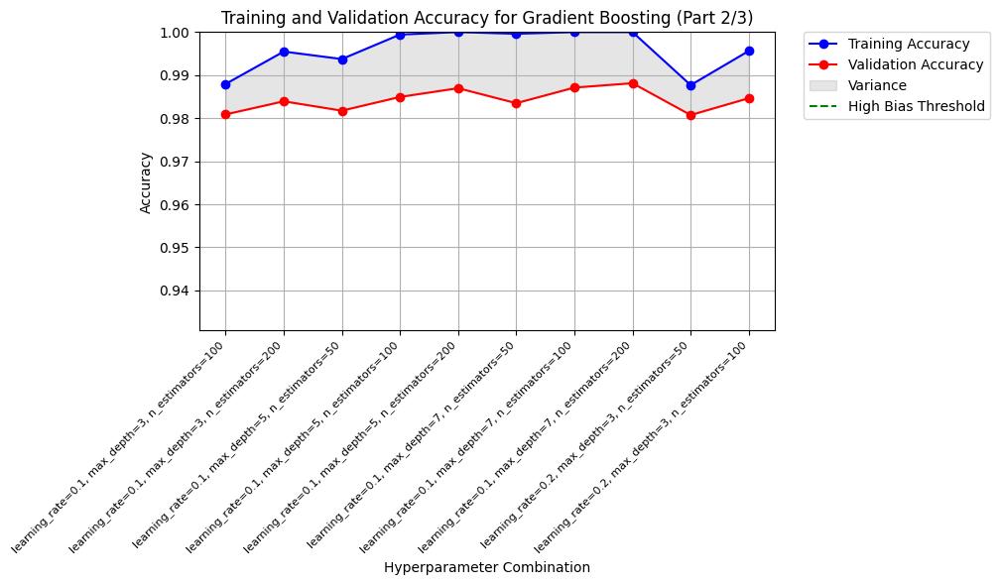

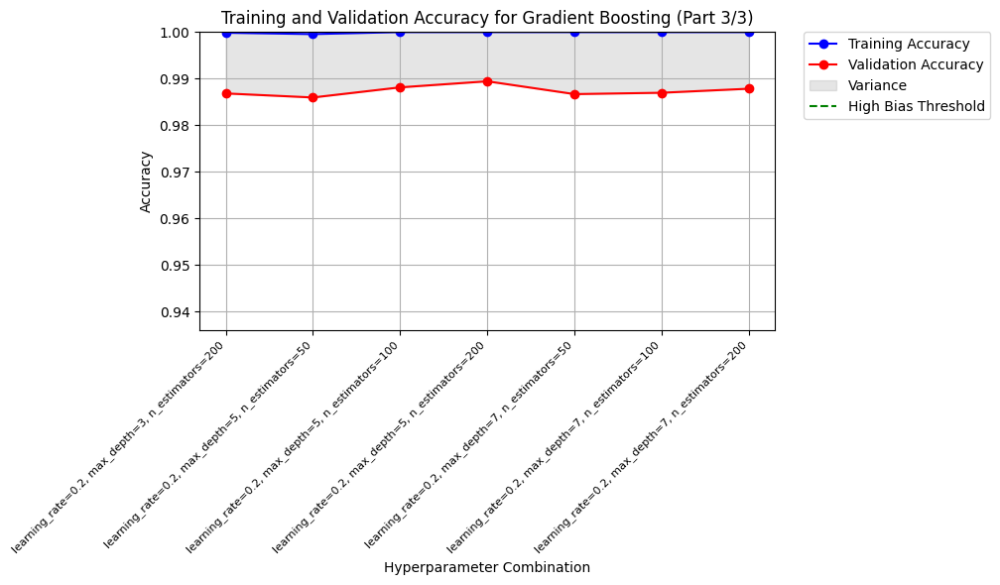


Gradient Boosting CV Results:
Fold 1 - Training Accuracy: 1.000, Validation Accuracy: 0.993
Fold 2 - Training Accuracy: 1.000, Validation Accuracy: 0.983
Fold 3 - Training Accuracy: 1.000, Validation Accuracy: 0.991
Fold 4 - Training Accuracy: 1.000, Validation Accuracy: 0.992
Fold 5 - Training Accuracy: 1.000, Validation Accuracy: 0.988
Best Parameters: {'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 200}
Best Cross-Validation Score: 0.989
Saved Gradient Boosting best model to 'Gradient Boosting_best_model.joblib'

Gradient Boosting Performance (Best Model):
Training Accuracy: 1.000
Validation Accuracy (Best CV Score): 0.989
Test Accuracy: 0.990
Training False Positive Rate: 0.000
Test False Positive Rate: 0.009
Training Precision (Approved): 1.000
Training Recall (Approved): 1.000
Training F1-Score (Approved): 1.000
Test Precision (Approved): 0.991
Test Recall (Approved): 0.988
Test F1-Score (Approved): 0.989
Training Classification Report:
               precision    recall 

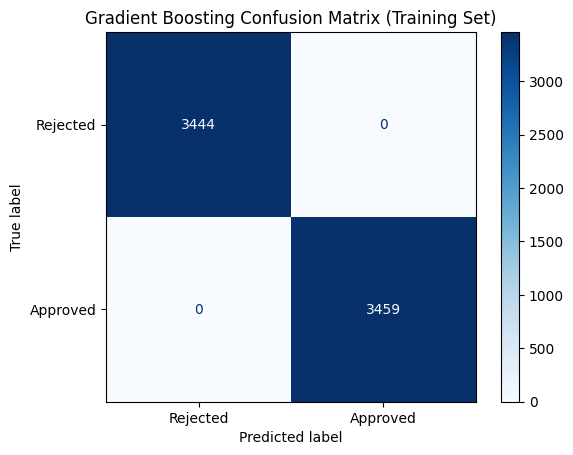

Test Classification Report:
               precision    recall  f1-score   support

           0       0.99      0.99      0.99       870
           1       0.99      0.99      0.99       856

    accuracy                           0.99      1726
   macro avg       0.99      0.99      0.99      1726
weighted avg       0.99      0.99      0.99      1726

Test Confusion Matrix:
 [[862   8]
 [ 10 846]]


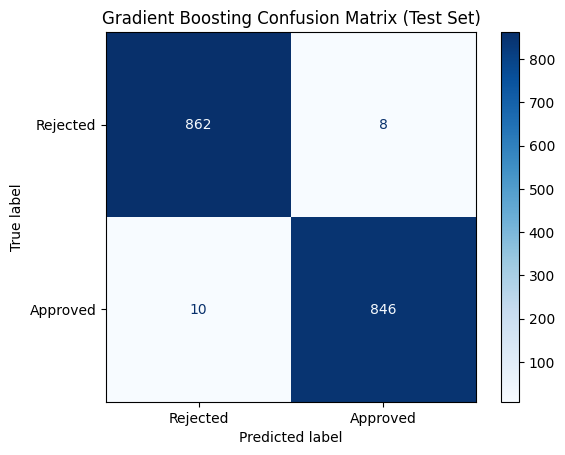

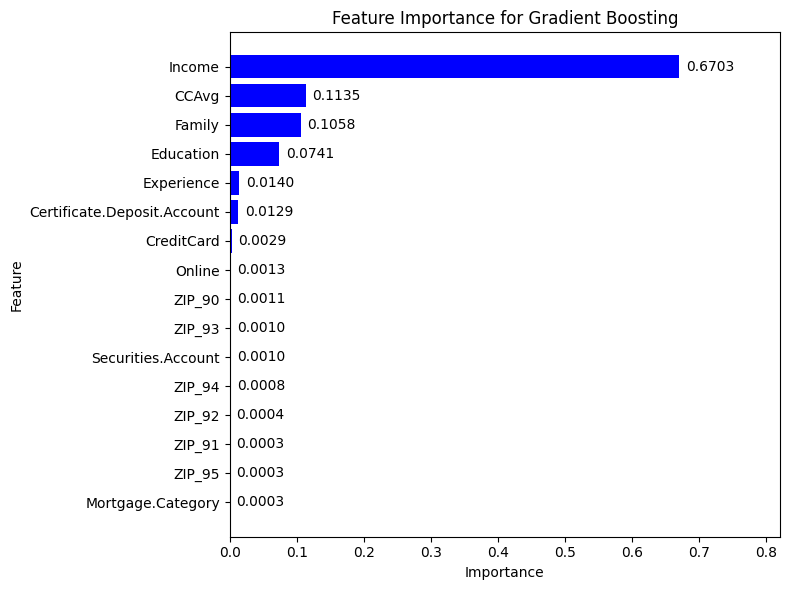

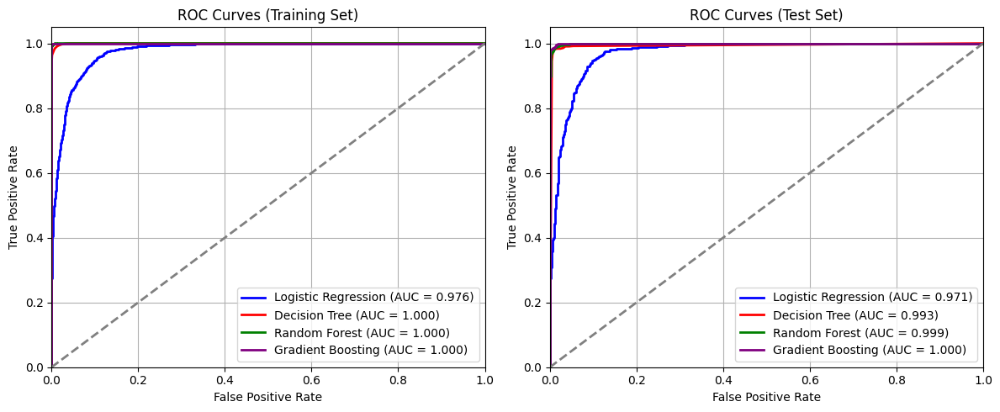

In [159]:
# Ensure matplotlib plots are displayed inline in Jupyter notebooks
%matplotlib inline

# Create a copy of the balanced dataset to avoid modifying the original
df_bankloan_balance_tune = df_bankloan_balance.copy()

# Verify the dataset integrity by checking for the target column
# Raises an error if 'Personal.Loan.Status' is missing, ensuring the dataset is valid
if 'Personal.Loan.Status' not in df_bankloan_balance_tune.columns:
    raise ValueError("Column 'Personal.Loan.Status' not found in the dataset.")

# Print dataset shape to confirm its dimensions (rows, columns)
print("Dataset shape:", df_bankloan_balance_tune.shape)

# Display class distribution of the target variable to verify balance
print("Class distribution:\n", df_bankloan_balance_tune['Personal.Loan.Status'].value_counts())

# Separate features (X) and target (y) for model training
# Drop the target column to create the feature set
X_tune = df_bankloan_balance_tune.drop(columns=["Personal.Loan.Status"])
# Extract the target column
y_tune = df_bankloan_balance_tune["Personal.Loan.Status"]

# Split the dataset into training (80%) and testing (20%) sets
# random_state=42 ensures reproducibility of the split
X_train_tune, X_test_tune, y_train_tune, y_test_tune = train_test_split(
    X_tune, y_tune, test_size=0.2, random_state=42
)

# Print the sizes of training and test sets for reference
print(f"Training set size: {len(X_train_tune)}, Test set size: {len(X_test_tune)}")

# Initialize dictionaries to store trained models and ROC curve data
models_tune = {}  # Stores best models for each algorithm
roc_data_train_tune = {}  # Stores true labels and probabilities for training set ROC
roc_data_test_tune = {}  # Stores true labels and probabilities for test set ROC

# Define a function to calculate the False Positive Rate (FPR) from a confusion matrix
# FPR = FP / (FP + TN), where FP is false positives and TN is true negatives
def calculate_fpr(conf_matrix):
    tn, fp, fn, tp = conf_matrix.ravel()  # Flatten the confusion matrix
    return fp / (fp + tn) if (fp + tn) > 0 else 0.0  # Avoid division by zero

# Define a function to plot feature importance as a horizontal bar chart
# Parameters: importances (feature importance scores), feature_names (column names), model_name (name of the model)
def plot_feature_importance(importances, feature_names, model_name):
    importances = np.array(importances)  # Convert importances to numpy array
    # Normalize importances to sum to 1, if not zero
    if importances.sum() != 0:
        importances = importances / importances.sum()
    # Create a DataFrame for sorting and plotting
    importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})
    importance_df = importance_df.sort_values(by='Importance', ascending=False)
    # Create a horizontal bar plot
    plt.figure(figsize=(8, 6))
    bars = plt.barh(importance_df['Feature'], importance_df['Importance'], color='blue')
    plt.xlabel('Importance')  # Label x-axis
    plt.ylabel('Feature')  # Label y-axis
    plt.title(f'Feature Importance for {model_name}')  # Set plot title
    plt.gca().invert_yaxis()  # Invert y-axis to show most important features at the top
    max_importance = importance_df['Importance'].max()  # Get maximum importance value
    # Add text labels to bars showing importance values
    for bar in bars:
        width = bar.get_width()
        plt.text(width + 0.01, bar.get_y() + bar.get_height()/2, f'{width:.4f}', 
                 ha='left', va='center')
    plt.xlim(0, max_importance + 0.15)  # Set x-axis limit with padding
    plt.tight_layout()  # Adjust layout to prevent clipping
    plt.show()  # Display the plot

# Define a function to plot training and validation accuracies during hyperparameter tuning
# Parameters: grid_search (GridSearchCV object), model_name (name of the model), param_grid (hyperparameter grid)
def plot_tuning_accuracies(grid_search, model_name, param_grid):
    # Extract mean training and validation scores from GridSearchCV results
    mean_train_scores = grid_search.cv_results_['mean_train_score']
    mean_val_scores = grid_search.cv_results_['mean_test_score']
    params = grid_search.cv_results_['params']  # Get hyperparameter combinations
    # Create labels for each combination for x-axis
    param_labels = [", ".join([f"{k}={v}" for k, v in p.items()]) for p in params]
    n_trials = len(mean_train_scores)  # Total number of hyperparameter combinations
    
    # Split trials into chunks of 10 for better visualization
    chunk_size = 10  # Number of combinations per plot
    num_chunks = (n_trials + chunk_size - 1) // chunk_size  # Calculate number of chunks
    for chunk in range(num_chunks):
        start_idx = chunk * chunk_size  # Start index of the chunk
        end_idx = min(start_idx + chunk_size, n_trials)  # End index of the chunk
        # Extract scores and labels for the current chunk
        chunk_scores_train = mean_train_scores[start_idx:end_idx]
        chunk_scores_val = mean_val_scores[start_idx:end_idx]
        chunk_labels = param_labels[start_idx:end_idx]
        chunk_length = end_idx - start_idx  # Length of the chunk
        # Create a new figure for the chunk
        plt.figure(figsize=(12, 6), num=f'{model_name} Hyperparameter Tuning - Part {chunk + 1}')
        x_range = range(chunk_length)  # X-axis range for plotting
        # Plot training and validation accuracies
        plt.plot(x_range, chunk_scores_train, label='Training Accuracy', color='blue', marker='o')
        plt.plot(x_range, chunk_scores_val, label='Validation Accuracy', color='red', marker='o')
        # Fill the area between training and validation curves to highlight variance
        plt.fill_between(x_range, chunk_scores_train, chunk_scores_val, 
                         color='gray', alpha=0.2, label='Variance')
        # Add a horizontal line at 0.8 to indicate a high bias threshold
        plt.axhline(y=0.8, color='green', linestyle='--', label='High Bias Threshold')
        plt.xlabel('Hyperparameter Combination')  # Label x-axis
        plt.ylabel('Accuracy')  # Label y-axis
        plt.title(f'Training and Validation Accuracy for {model_name} (Part {chunk + 1}/{num_chunks})')  # Set title
        
        # Set y-axis limits with padding for better visualization
        max_score = max(max(chunk_scores_train, default=0), max(chunk_scores_val, default=0))
        min_score = min(min(chunk_scores_train, default=1), min(chunk_scores_val, default=1))
        plt.ylim(max(0, min_score - 0.05), min(1, max_score + 0.05))
        
        # Place legend outside the plot
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
        plt.grid(True)  # Enable grid for readability
        # Set x-axis ticks with rotated labels for clarity
        plt.xticks(x_range, chunk_labels, rotation=45, ha='right', fontsize=8)
        plt.tight_layout(rect=[0, 0, 0.85, 1])  # Reserve space for legend
        plt.show()  # Display the plot

# --- Logistic Regression Model ---
# Define the hyperparameter grid for Logistic Regression
param_grid_lr_tune = {
    'penalty': ['l1', 'l2'],  # L1 (Lasso) and L2 (Ridge) regularization
    'C': [0.0001, 0.001, 0.01, 0.1, 1, 10, 100, 1000],  # Inverse of regularization strength
    'solver': ['liblinear']  # Solver that supports both L1 and L2 penalties
}
# Initialize Logistic Regression model with maximum iterations set to 1000
lr_tune = LogisticRegression(max_iter=1000)
# Perform grid search with 5-fold cross-validation, scoring based on accuracy
grid_lr_tune = GridSearchCV(lr_tune, param_grid_lr_tune, cv=5, scoring='accuracy', return_train_score=True)
grid_lr_tune.fit(X_train_tune, y_train_tune)  # Fit the model on training data
# Plot tuning results for Logistic Regression
plot_tuning_accuracies(grid_lr_tune, "Logistic Regression", param_grid_lr_tune)
# Print cross-validation results for each fold
print("\nLogistic Regression CV Results:")
for i in range(5):
    train_score_tune = grid_lr_tune.cv_results_[f'split{i}_train_score'][grid_lr_tune.best_index_]
    val_score_tune = grid_lr_tune.cv_results_[f'split{i}_test_score'][grid_lr_tune.best_index_]
    print(f"Fold {i+1} - Training Accuracy: {train_score_tune:.3f}, Validation Accuracy: {val_score_tune:.3f}")
# Print the best hyperparameters and cross-validation score
print(f"Best Parameters: {grid_lr_tune.best_params_}")
print(f"Best Cross-Validation Score: {grid_lr_tune.best_score_:.3f}")
# Extract the best model
lr_best_model = grid_lr_tune.best_estimator_
# Make predictions on training and test sets
y_pred_lr_train_tune = lr_best_model.predict(X_train_tune)
y_pred_lr_test_tune = lr_best_model.predict(X_test_tune)
# Get predicted probabilities for ROC curve
y_prob_lr_train_tune = lr_best_model.predict_proba(X_train_tune)[:, 1]
y_prob_lr_test_tune = lr_best_model.predict_proba(X_test_tune)[:, 1]
# Save the best model to disk
joblib.dump(lr_best_model, 'Logistic Regression_best_model.joblib')
print("Saved Logistic Regression best model to 'Logistic Regression_best_model.joblib'")
# Evaluate and print model performance
print("\nLogistic Regression Performance (Best Model):")
train_accuracy_lr = accuracy_score(y_train_tune, y_pred_lr_train_tune)
val_accuracy_lr = grid_lr_tune.best_score_
test_accuracy_lr = accuracy_score(y_test_tune, y_pred_lr_test_tune)
print(f"Training Accuracy: {train_accuracy_lr:.3f}")
print(f"Validation Accuracy (Best CV Score): {val_accuracy_lr:.3f}")
print(f"Test Accuracy: {test_accuracy_lr:.3f}")
# Compute confusion matrices
cm_lr_train_tune = confusion_matrix(y_train_tune, y_pred_lr_train_tune)
cm_lr_test_tune = confusion_matrix(y_test_tune, y_pred_lr_test_tune)
# Calculate False Positive Rates
fpr_lr_train = calculate_fpr(cm_lr_train_tune)
fpr_lr_test = calculate_fpr(cm_lr_test_tune)
print(f"Training False Positive Rate: {fpr_lr_train:.3f}")
print(f"Test False Positive Rate: {fpr_lr_test:.3f}")
# Generate classification reports for precision, recall, and F1-score
report_lr_train = classification_report(y_train_tune, y_pred_lr_train_tune, output_dict=True)
report_lr_test = classification_report(y_test_tune, y_pred_lr_test_tune, output_dict=True)
# Print metrics for the positive class (Approved)
print(f"Training Precision (Approved): {report_lr_train['1']['precision']:.3f}")
print(f"Training Recall (Approved): {report_lr_train['1']['recall']:.3f}")
print(f"Training F1-Score (Approved): {report_lr_train['1']['f1-score']:.3f}")
print(f"Test Precision (Approved): {report_lr_test['1']['precision']:.3f}")
print(f"Test Recall (Approved): {report_lr_test['1']['recall']:.3f}")
print(f"Test F1-Score (Approved): {report_lr_test['1']['f1-score']:.3f}")
# Check for overfitting by comparing training, validation, and test accuracies
if train_accuracy_lr - val_accuracy_lr > 0.05 or train_accuracy_lr - test_accuracy_lr > 0.05:
    print("Warning: Potential overfitting detected.")
# Print detailed classification reports
print("Training Classification Report:\n", classification_report(y_train_tune, y_pred_lr_train_tune))
print("Training Confusion Matrix:\n", cm_lr_train_tune)
# Plot confusion matrix for training set
disp_lr_train_tune = ConfusionMatrixDisplay(confusion_matrix=cm_lr_train_tune, display_labels=["Rejected", "Approved"])
disp_lr_train_tune.plot(cmap="Blues", values_format="d")
plt.title("Logistic Regression Confusion Matrix (Training Set)")
plt.show()
# Print and plot test set results
print("Test Classification Report:\n", classification_report(y_test_tune, y_pred_lr_test_tune))
print("Test Confusion Matrix:\n", cm_lr_test_tune)
disp_lr_test_tune = ConfusionMatrixDisplay(confusion_matrix=cm_lr_test_tune, display_labels=["Rejected", "Approved"])
disp_lr_test_tune.plot(cmap="Blues", values_format="d")
plt.title("Logistic Regression Confusion Matrix (Test Set)")
plt.show()
# Plot feature importance based on model coefficients
feature_importance_lr = np.abs(lr_best_model.coef_[0])
plot_feature_importance(feature_importance_lr, X_tune.columns, "Logistic Regression")
# Store model and ROC data
models_tune['Logistic Regression'] = lr_best_model
roc_data_train_tune['Logistic Regression'] = (y_train_tune, y_prob_lr_train_tune)
roc_data_test_tune['Logistic Regression'] = (y_test_tune, y_prob_lr_test_tune)

# --- Decision Tree Model ---
print("\n=== Decision Tree Analysis with Pruning ===")
# Define the hyperparameter grid for Decision Tree
param_grid_dt_tune = {
    'criterion': ['gini', 'entropy'],  # Splitting criteria
    'max_depth': list(range(3, 12, 3)),  # Maximum depth of the tree
    'min_samples_split': list(range(2, 12, 4)),  # Minimum samples to split a node
    'min_samples_leaf': list(range(1, 6, 2)),  # Minimum samples at a leaf
    'max_features': ['sqrt', 'log2', None],  # Number of features to consider
    'ccp_alpha': [0.0, 0.01, 0.1, 1.0]  # Cost-complexity pruning parameter
}
# Initialize Decision Tree model
dt_tune = DecisionTreeClassifier(random_state=42)
# Perform grid search with 5-fold cross-validation
grid_dt_tune = GridSearchCV(dt_tune, param_grid_dt_tune, cv=5, scoring='accuracy', return_train_score=True)
grid_dt_tune.fit(X_train_tune, y_train_tune)
# Plot tuning results
plot_tuning_accuracies(grid_dt_tune, "Decision Tree", param_grid_dt_tune)
# Print cross-validation results
print("\nDecision Tree CV Results:")
for i in range(5):
    train_score_tune = grid_dt_tune.cv_results_[f'split{i}_train_score'][grid_dt_tune.best_index_]
    val_score_tune = grid_dt_tune.cv_results_[f'split{i}_test_score'][grid_dt_tune.best_index_]
    print(f"Fold {i+1} - Training Accuracy: {train_score_tune:.3f}, Validation Accuracy: {val_score_tune:.3f}")
print(f"Best Parameters: {grid_dt_tune.best_params_}")
print(f"Best Cross-Validation Score: {grid_dt_tune.best_score_:.3f}")
# Extract and evaluate the best model
dt_best_model = grid_dt_tune.best_estimator_
y_pred_dt_train_tune = dt_best_model.predict(X_train_tune)
y_pred_dt_test_tune = dt_best_model.predict(X_test_tune)
y_prob_dt_train_tune = dt_best_model.predict_proba(X_train_tune)[:, 1]
y_prob_dt_test_tune = dt_best_model.predict_proba(X_test_tune)[:, 1]
# Save the model
joblib.dump(dt_best_model, 'Decision Tree_best_model.joblib')
print("Saved Decision Tree best model to 'Decision Tree_best_model.joblib'")
print("\nDecision Tree Performance (Best Model):")
train_accuracy_dt = accuracy_score(y_train_tune, y_pred_dt_train_tune)
val_accuracy_dt = grid_dt_tune.best_score_
test_accuracy_dt = accuracy_score(y_test_tune, y_pred_dt_test_tune)
print(f"Training Accuracy: {train_accuracy_dt:.3f}")
print(f"Validation Accuracy (Best CV Score): {val_accuracy_dt:.3f}")
print(f"Test Accuracy: {test_accuracy_dt:.3f}")
cm_dt_train_tune = confusion_matrix(y_train_tune, y_pred_dt_train_tune)
cm_dt_test_tune = confusion_matrix(y_test_tune, y_pred_dt_test_tune)
fpr_dt_train = calculate_fpr(cm_dt_train_tune)
fpr_dt_test = calculate_fpr(cm_dt_test_tune)
print(f"Training False Positive Rate: {fpr_dt_train:.3f}")
print(f"Test False Positive Rate: {fpr_dt_test:.3f}")
report_dt_train = classification_report(y_train_tune, y_pred_dt_train_tune, output_dict=True)
report_dt_test = classification_report(y_test_tune, y_pred_dt_test_tune, output_dict=True)
print(f"Training Precision (Approved): {report_dt_train['1']['precision']:.3f}")
print(f"Training Recall (Approved): {report_dt_train['1']['recall']:.3f}")
print(f"Training F1-Score (Approved): {report_dt_train['1']['f1-score']:.3f}")
print(f"Test Precision (Approved): {report_dt_test['1']['precision']:.3f}")
print(f"Test Recall (Approved): {report_dt_test['1']['recall']:.3f}")
print(f"Test F1-Score (Approved): {report_dt_test['1']['f1-score']:.3f}")
if train_accuracy_dt - val_accuracy_dt > 0.05 or train_accuracy_dt - test_accuracy_dt > 0.05:
    print("Warning: Potential overfitting detected.")
print("Training Classification Report:\n", classification_report(y_train_tune, y_pred_dt_train_tune))
print("Training Confusion Matrix:\n", cm_dt_train_tune)
disp_dt_train_tune = ConfusionMatrixDisplay(confusion_matrix=cm_dt_train_tune, display_labels=["Rejected", "Approved"])
disp_dt_train_tune.plot(cmap="Blues", values_format="d")
plt.title("Decision Tree Confusion Matrix (Training Set)")
plt.show()
print("Test Classification Report:\n", classification_report(y_test_tune, y_pred_dt_test_tune))
print("Test Confusion Matrix:\n", cm_dt_test_tune)
disp_dt_test_tune = ConfusionMatrixDisplay(confusion_matrix=cm_dt_test_tune, display_labels=["Rejected", "Approved"])
disp_dt_test_tune.plot(cmap="Blues", values_format="d")
plt.title("Decision Tree Confusion Matrix (Test Set)")
plt.show()
feature_importance_dt = dt_best_model.feature_importances_
plot_feature_importance(feature_importance_dt, X_tune.columns, "Decision Tree")
models_tune['Decision Tree'] = dt_best_model
roc_data_train_tune['Decision Tree'] = (y_train_tune, y_prob_dt_train_tune)
roc_data_test_tune['Decision Tree'] = (y_test_tune, y_prob_dt_test_tune)

# --- Random Forest Model ---
print("\n=== Random Forest Analysis ===")
# Define the hyperparameter grid for Random Forest
param_grid_rf_tune = {
    'n_estimators': [100, 150, 200],  # Number of trees
    'max_depth': [5, 10],  # Maximum depth of trees
    'min_samples_split': [2, 5],  # Minimum samples to split
    'min_samples_leaf': [1, 2],  # Minimum samples at a leaf
    'max_features': ['sqrt', 'log2']  # Number of features to consider
}
# Initialize Random Forest model
rf_tune = RandomForestClassifier(random_state=42)
# Perform grid search
grid_rf_tune = GridSearchCV(rf_tune, param_grid_rf_tune, cv=5, scoring='accuracy', return_train_score=True)
grid_rf_tune.fit(X_train_tune, y_train_tune)
plot_tuning_accuracies(grid_rf_tune, "Random Forest", param_grid_rf_tune)
print("\nRandom Forest CV Results:")
for i in range(5):
    train_score_tune = grid_rf_tune.cv_results_[f'split{i}_train_score'][grid_rf_tune.best_index_]
    val_score_tune = grid_rf_tune.cv_results_[f'split{i}_test_score'][grid_rf_tune.best_index_]
    print(f"Fold {i+1} - Training Accuracy: {train_score_tune:.3f}, Validation Accuracy: {val_score_tune:.3f}")
print(f"Best Parameters: {grid_rf_tune.best_params_}")
print(f"Best Cross-Validation Score: {grid_rf_tune.best_score_:.3f}")
rf_best_model = grid_rf_tune.best_estimator_
y_pred_rf_train_tune = rf_best_model.predict(X_train_tune)
y_pred_rf_test_tune = rf_best_model.predict(X_test_tune)
y_prob_rf_train_tune = rf_best_model.predict_proba(X_train_tune)[:, 1]
y_prob_rf_test_tune = rf_best_model.predict_proba(X_test_tune)[:, 1]
joblib.dump(rf_best_model, 'Random Forest_best_model.joblib')
print("Saved Random Forest best model to 'Random Forest_best_model.joblib'")
print("\nRandom Forest Performance (Best Model):")
train_accuracy_rf = accuracy_score(y_train_tune, y_pred_rf_train_tune)
val_accuracy_rf = grid_rf_tune.best_score_
test_accuracy_rf = accuracy_score(y_test_tune, y_pred_rf_test_tune)
print(f"Training Accuracy: {train_accuracy_rf:.3f}")
print(f"Validation Accuracy (Best CV Score): {val_accuracy_rf:.3f}")
print(f"Test Accuracy: {test_accuracy_rf:.3f}")
cm_rf_train_tune = confusion_matrix(y_train_tune, y_pred_rf_train_tune)
cm_rf_test_tune = confusion_matrix(y_test_tune, y_pred_rf_test_tune)
fpr_rf_train = calculate_fpr(cm_rf_train_tune)
fpr_rf_test = calculate_fpr(cm_rf_test_tune)
print(f"Training False Positive Rate: {fpr_rf_train:.3f}")
print(f"Test False Positive Rate: {fpr_rf_test:.3f}")
report_rf_train = classification_report(y_train_tune, y_pred_rf_train_tune, output_dict=True)
report_rf_test = classification_report(y_test_tune, y_pred_rf_test_tune, output_dict=True)
print(f"Training Precision (Approved): {report_rf_train['1']['precision']:.3f}")
print(f"Training Recall (Approved): {report_rf_train['1']['recall']:.3f}")
print(f"Training F1-Score (Approved): {report_rf_train['1']['f1-score']:.3f}")
print(f"Test Precision (Approved): {report_rf_test['1']['precision']:.3f}")
print(f"Test Recall (Approved): {report_rf_test['1']['recall']:.3f}")
print(f"Test F1-Score (Approved): {report_rf_test['1']['f1-score']:.3f}")
if train_accuracy_rf - val_accuracy_rf > 0.05 or train_accuracy_rf - test_accuracy_rf > 0.05:
    print("Warning: Potential overfitting detected.")
print("Training Classification Report:\n", classification_report(y_train_tune, y_pred_rf_train_tune))
print("Training Confusion Matrix:\n", cm_rf_train_tune)
disp_rf_train_tune = ConfusionMatrixDisplay(confusion_matrix=cm_rf_train_tune, display_labels=["Rejected", "Approved"])
disp_rf_train_tune.plot(cmap="Blues", values_format="d")
plt.title("Random Forest Confusion Matrix (Training Set)")
plt.show()
print("Test Classification Report:\n", classification_report(y_test_tune, y_pred_rf_test_tune))
print("Test Confusion Matrix:\n", cm_rf_test_tune)
disp_rf_test_tune = ConfusionMatrixDisplay(confusion_matrix=cm_rf_test_tune, display_labels=["Rejected", "Approved"])
disp_rf_test_tune.plot(cmap="Blues", values_format="d")
plt.title("Random Forest Confusion Matrix (Test Set)")
plt.show()
feature_importance_rf = rf_best_model.feature_importances_
plot_feature_importance(feature_importance_rf, X_tune.columns, "Random Forest")
models_tune['Random Forest'] = rf_best_model
roc_data_train_tune['Random Forest'] = (y_train_tune, y_prob_rf_train_tune)
roc_data_test_tune['Random Forest'] = (y_test_tune, y_prob_rf_test_tune)

# --- Gradient Boosting Model ---
# Define the hyperparameter grid for Gradient Boosting
param_grid_gb_tune = {
    'n_estimators': [50, 100, 200],  # Number of boosting stages
    'learning_rate': [0.01, 0.1, 0.2],  # Learning rate
    'max_depth': [3, 5, 7]  # Maximum depth of trees
}
# Initialize Gradient Boosting model
gb_tune = GradientBoostingClassifier(random_state=42)
# Perform grid search
grid_gb_tune = GridSearchCV(gb_tune, param_grid_gb_tune, cv=5, scoring='accuracy', return_train_score=True)
grid_gb_tune.fit(X_train_tune, y_train_tune)
plot_tuning_accuracies(grid_gb_tune, "Gradient Boosting", param_grid_gb_tune)
print("\nGradient Boosting CV Results:")
for i in range(5):
    train_score_tune = grid_gb_tune.cv_results_[f'split{i}_train_score'][grid_gb_tune.best_index_]
    val_score_tune = grid_gb_tune.cv_results_[f'split{i}_test_score'][grid_gb_tune.best_index_]
    print(f"Fold {i+1} - Training Accuracy: {train_score_tune:.3f}, Validation Accuracy: {val_score_tune:.3f}")
print(f"Best Parameters: {grid_gb_tune.best_params_}")
print(f"Best Cross-Validation Score: {grid_gb_tune.best_score_:.3f}")
gb_best_model = grid_gb_tune.best_estimator_
y_pred_gb_train_tune = gb_best_model.predict(X_train_tune)
y_pred_gb_test_tune = gb_best_model.predict(X_test_tune)
y_prob_gb_train_tune = gb_best_model.predict_proba(X_train_tune)[:, 1]
y_prob_gb_test_tune = gb_best_model.predict_proba(X_test_tune)[:, 1]
joblib.dump(gb_best_model, 'Gradient Boosting_best_model.joblib')
print("Saved Gradient Boosting best model to 'Gradient Boosting_best_model.joblib'")
print("\nGradient Boosting Performance (Best Model):")
train_accuracy_gb = accuracy_score(y_train_tune, y_pred_gb_train_tune)
val_accuracy_gb = grid_gb_tune.best_score_
test_accuracy_gb = accuracy_score(y_test_tune, y_pred_gb_test_tune)
print(f"Training Accuracy: {train_accuracy_gb:.3f}")
print(f"Validation Accuracy (Best CV Score): {val_accuracy_gb:.3f}")
print(f"Test Accuracy: {test_accuracy_gb:.3f}")
cm_gb_train_tune = confusion_matrix(y_train_tune, y_pred_gb_train_tune)
cm_gb_test_tune = confusion_matrix(y_test_tune, y_pred_gb_test_tune)
fpr_gb_train = calculate_fpr(cm_gb_train_tune)
fpr_gb_test = calculate_fpr(cm_gb_test_tune)
print(f"Training False Positive Rate: {fpr_gb_train:.3f}")
print(f"Test False Positive Rate: {fpr_gb_test:.3f}")
report_gb_train = classification_report(y_train_tune, y_pred_gb_train_tune, output_dict=True)
report_gb_test = classification_report(y_test_tune, y_pred_gb_test_tune, output_dict=True)
print(f"Training Precision (Approved): {report_gb_train['1']['precision']:.3f}")
print(f"Training Recall (Approved): {report_gb_train['1']['recall']:.3f}")
print(f"Training F1-Score (Approved): {report_gb_train['1']['f1-score']:.3f}")
print(f"Test Precision (Approved): {report_gb_test['1']['precision']:.3f}")
print(f"Test Recall (Approved): {report_gb_test['1']['recall']:.3f}")
print(f"Test F1-Score (Approved): {report_gb_test['1']['f1-score']:.3f}")
if train_accuracy_gb - val_accuracy_gb > 0.05 or train_accuracy_gb - test_accuracy_gb > 0.05:
    print("Warning: Potential overfitting detected.")
print("Training Classification Report:\n", classification_report(y_train_tune, y_pred_gb_train_tune))
print("Training Confusion Matrix:\n", cm_gb_train_tune)
disp_gb_train_tune = ConfusionMatrixDisplay(confusion_matrix=cm_gb_train_tune, display_labels=["Rejected", "Approved"])
disp_gb_train_tune.plot(cmap="Blues", values_format="d")
plt.title("Gradient Boosting Confusion Matrix (Training Set)")
plt.show()
print("Test Classification Report:\n", classification_report(y_test_tune, y_pred_gb_test_tune))
print("Test Confusion Matrix:\n", cm_gb_test_tune)
disp_gb_test_tune = ConfusionMatrixDisplay(confusion_matrix=cm_gb_test_tune, display_labels=["Rejected", "Approved"])
disp_gb_test_tune.plot(cmap="Blues", values_format="d")
plt.title("Gradient Boosting Confusion Matrix (Test Set)")
plt.show()
feature_importance_gb = gb_best_model.feature_importances_
plot_feature_importance(feature_importance_gb, X_tune.columns, "Gradient Boosting")
models_tune['Gradient Boosting'] = gb_best_model
roc_data_train_tune['Gradient Boosting'] = (y_train_tune, y_prob_gb_train_tune)
roc_data_test_tune['Gradient Boosting'] = (y_test_tune, y_prob_gb_test_tune)

# --- Plot ROC Curves for All Models ---
# Create a figure with two subplots for training and test ROC curves
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)  # Left subplot for training set
colors = ['blue', 'red', 'green', 'purple']  # Colors for different models
# Plot ROC curves for each model on the training set
for (model_name, (y_true, y_prob)), color in zip(roc_data_train_tune.items(), colors):
    fpr, tpr, _ = roc_curve(y_true, y_prob)  # Compute ROC curve
    roc_auc = auc(fpr, tpr)  # Compute Area Under the Curve (AUC)
    plt.plot(fpr, tpr, color=color, lw=2, label=f'{model_name} (AUC = {roc_auc:.3f})')
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')  # Plot diagonal line (random classifier)
plt.xlim([0.0, 1.0])  # Set x-axis limits
plt.ylim([0.0, 1.05])  # Set y-axis limits
plt.xlabel('False Positive Rate')  # Label x-axis
plt.ylabel('True Positive Rate')  # Label y-axis
plt.title('ROC Curves (Training Set)')  # Set title
plt.legend(loc="lower right")  # Place legend
plt.grid(True)  # Enable grid
plt.subplot(1, 2, 2)  # Right subplot for test set
# Plot ROC curves for each model on the test set
for (model_name, (y_true, y_prob)), color in zip(roc_data_test_tune.items(), colors):
    fpr, tpr, _ = roc_curve(y_true, y_prob)
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, color=color, lw=2, label=f'{model_name} (AUC = {roc_auc:.3f})')
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves (Test Set)')
plt.legend(loc="lower right")
plt.grid(True)
plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()  # Display the ROC curves

# LIME EXPLANATION FOR LOCAL EXPLANATION TO ENHANCE MODEL TRANSPARENCY, HENCE, AID IN COMPLYING WITH SOME LEGAL REQUIREMENTS

In [160]:
# Load the saved Gradient Boosting model
model = joblib.load('Gradient Boosting_best_model.joblib')

# Get feature names 
feature_names = X_test_tune.columns.tolist() if isinstance(X_test_tune, pd.DataFrame) else [f'feature_{i}' for i in range(X_test_tune.shape[1])]

# Initialize LIME explainer
explainer = LimeTabularExplainer(
    training_data=X_train_tune.values if isinstance(X_train_tune, pd.DataFrame) else X_train_tune,
    feature_names=feature_names,
    class_names=['Rejected', 'Approved'],  
    mode='classification'
)

# Select a test instance to explain 
instance_idx = 3
test_instance = X_test_tune.iloc[instance_idx] if isinstance(X_test_tune, pd.DataFrame) else X_test_tune[instance_idx]

# Ensure test_instance is a DataFrame with feature names for predict_proba
if isinstance(X_test_tune, pd.DataFrame):
    test_instance_df = pd.DataFrame([test_instance], columns=feature_names)
else:
    test_instance_df = pd.DataFrame([test_instance], columns=feature_names)

# Generate LIME explanation for the selected instance
exp = explainer.explain_instance(
    data_row=test_instance.values if isinstance(test_instance, pd.Series) else test_instance,
    predict_fn=lambda x: model.predict_proba(pd.DataFrame(x, columns=feature_names)),  # Wrap predict_proba to use DataFrame
    num_features=len(feature_names)  # Show all features for explanation
)

# Print the explanation
print(f"Explanation for test instance {instance_idx}:")
print(f"True label: {y_test_tune.iloc[instance_idx] if isinstance(y_test_tune, pd.Series) else y_test_tune[instance_idx]}")
print(f"Predicted probabilities: {model.predict_proba(test_instance_df)[0]}")

# Predict the label to determine the title
predicted_label = model.predict(test_instance_df)[0]
title = "LIME Explanation for Approved Applicant" if predicted_label == 1 else "LIME Explanation for Rejected Applicant"

# Display LIME explanation with styled HTML and dynamic title
html_content = exp.as_html(show_table=True)
styled_html = f"""
<div style='background-color: white; color: black; padding: 20px; width: 700px; overflow-x: auto; overflow-y: visible;'>
    <h3 style='text-align: center;'>{title}</h3>
    <style>
        table {{
            width: 100%;
            min-width: 500px;
            border-collapse: collapse;
            font-size: 14px;
        }}
        th, td {{
            padding: 8px;
            text-align: left;
            word-wrap: break-word;
            max-width: 250px;
        }}
    </style>
    {html_content}
</div>
"""
display(HTML(styled_html))

# Print feature contributions
print("\nFeature contributions to prediction:")
for feature, contribution in exp.as_list():
    print(f"{feature}: {contribution}")

Explanation for test instance 3:
True label: 1
Predicted probabilities: [1.75608186e-06 9.99998244e-01]



Feature contributions to prediction:
Income > 1.50: 0.5251955270619663
2.00 < Education <= 3.00: 0.11697183073245739
0.33 < Family <= 0.67: 0.09486128978644064
Certificate.Deposit.Account <= 0.00: -0.03147029573757253
Mortgage.Category <= 0.00: 0.03128864252145606
ZIP_94 <= 0.00: 0.030224239578571812
CCAvg > 1.20: 0.030035381197761443
ZIP_90 <= 0.00: 0.018607863466727714
0.00 < Online <= 1.00: -0.01793146706180597
ZIP_95 <= 0.00: -0.01748172590157636
Securities.Account <= 0.00: 0.017283355936027874
ZIP_92 > 0.00: -0.01360755069933699
-0.56 < Experience <= -0.05: -0.009853666466634318
CreditCard <= 0.00: 0.009027263522221192
ZIP_91 <= 0.00: -0.006412359478842209
ZIP_93 <= 0.00: -0.004756036648773027


In [161]:
# Load the saved Gradient Boosting model
model = joblib.load('Gradient Boosting_best_model.joblib')

# Get feature names 
feature_names = X_test_tune.columns.tolist() if isinstance(X_test_tune, pd.DataFrame) else [f'feature_{i}' for i in range(X_test_tune.shape[1])]

# Initialize LIME explainer
explainer = LimeTabularExplainer(
    training_data=X_train_tune.values if isinstance(X_train_tune, pd.DataFrame) else X_train_tune,
    feature_names=feature_names,
    class_names=['Rejected', 'Approved'],  
    mode='classification'
)

# Select a test instance to explain 
instance_idx = 0
test_instance = X_test_tune.iloc[instance_idx] if isinstance(X_test_tune, pd.DataFrame) else X_test_tune[instance_idx]

# Ensure test_instance is a DataFrame with feature names for predict_proba
if isinstance(X_test_tune, pd.DataFrame):
    test_instance_df = pd.DataFrame([test_instance], columns=feature_names)
else:
    test_instance_df = pd.DataFrame([test_instance], columns=feature_names)

# Generate LIME explanation for the selected instance
exp = explainer.explain_instance(
    data_row=test_instance.values if isinstance(test_instance, pd.Series) else test_instance,
    predict_fn=lambda x: model.predict_proba(pd.DataFrame(x, columns=feature_names)),  # Wrap predict_proba to use DataFrame
    num_features=len(feature_names)  # Show all features for explanation
)

# Print the explanation
print(f"Explanation for test instance {instance_idx}:")
print(f"True label: {y_test_tune.iloc[instance_idx] if isinstance(y_test_tune, pd.Series) else y_test_tune[instance_idx]}")
print(f"Predicted probabilities: {model.predict_proba(test_instance_df)[0]}")

# Predict the label to determine the title
predicted_label = model.predict(test_instance_df)[0]
title = "LIME Explanation for Approved Applicant" if predicted_label == 1 else "LIME Explanation for Rejected Applicant"

# Display LIME explanation with styled HTML and dynamic title
html_content = exp.as_html(show_table=True)
styled_html = f"""
<div style='background-color: white; color: black; padding: 20px; width: 700px; overflow-x: auto; overflow-y: visible;'>
    <h3 style='text-align: center;'>{title}</h3>
    <style>
        table {{
            width: 100%;
            min-width: 500px;
            border-collapse: collapse;
            font-size: 14px;
        }}
        th, td {{
            padding: 8px;
            text-align: left;
            word-wrap: break-word;
            max-width: 250px;
        }}
    </style>
    {html_content}
</div>
"""
display(HTML(styled_html))

# Print feature contributions
print("\nFeature contributions to prediction:")
for feature, contribution in exp.as_list():
    print(f"{feature}: {contribution}")

Explanation for test instance 0:
True label: 0
Predicted probabilities: [9.99999507e-01 4.92903625e-07]



Feature contributions to prediction:
Income <= -0.06: -0.5773565601685163
2.00 < Education <= 3.00: 0.13860402045188508
0.33 < Family <= 0.67: 0.11445719310524924
-0.28 < CCAvg <= 0.39: -0.0763010238386273
Certificate.Deposit.Account <= 0.00: -0.04671991702314207
ZIP_93 <= 0.00: 0.04217614606418622
Securities.Account <= 0.00: -0.033444924082151085
Online <= 0.00: 0.024889302837238895
ZIP_92 <= 0.00: -0.020129032034989162
ZIP_91 <= 0.00: 0.018240646081373556
0.00 < ZIP_94 <= 1.00: -0.017727158533755723
Experience > 0.46: -0.004754879677956095
ZIP_95 <= 0.00: 0.0046801432337294285
ZIP_90 <= 0.00: 0.0031079912871383904
Mortgage.Category <= 0.00: -0.002445549504156905
CreditCard <= 0.00: 0.002141830200053617


## **Summary of Metrics for the Assessment of the Models with Balanced Dataset and with Parameter Tuning**
- LR: Logistic Regression Model
- DT: Decision Tree Model
- RF: Random Forest Model
- GB: Gradient Boosting Model 

---
- High, stable training and validation accuracies in 5-fold cross-validation for the optimal hyperparameters
- High, stable training, validation, and test accuracies, showcasing robust model generalization.
- LR, DT, RF, and GB — performance, with metrics (accuracy, precision, recall, F1-score, FPR and AUC) 
- Models’ accuracy, precision, recall, F1-score, and False Positive Rate from the confusion matrices, along with AUC values obtained from the AUROC curves.


- High, stable training and validation accuracies in 5-fold cross-validation for the optimal hyperparameters

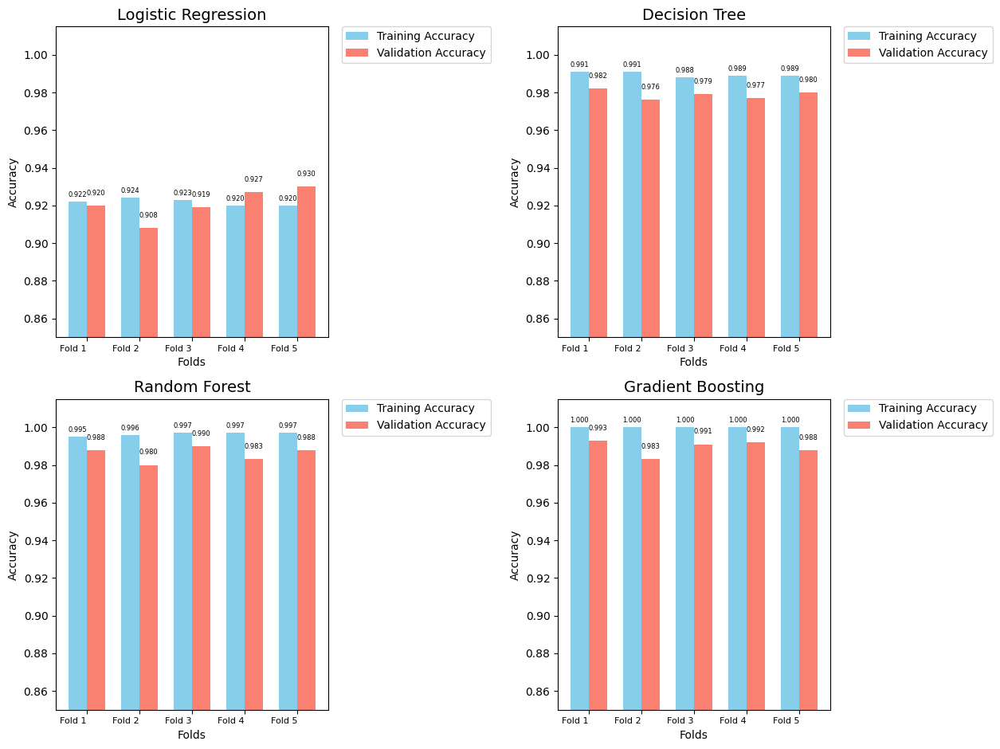

In [162]:
# training and validation accuracies values in 5-fold cross-validation for the optimal hyperparameters

models = {
    'Logistic Regression': {
        'training': [0.922, 0.924, 0.923, 0.920, 0.920],
        'validation': [0.920, 0.908, 0.919, 0.927, 0.930]
    },
    'Decision Tree': {
        'training': [0.991, 0.991, 0.988, 0.989, 0.989],
        'validation': [0.982, 0.976, 0.979, 0.977, 0.980]
    },
    'Random Forest': {
        'training': [0.995, 0.996, 0.997, 0.997, 0.997],
        'validation': [0.988, 0.980, 0.990, 0.983, 0.988]
    },
    'Gradient Boosting': {
        'training': [1.000, 1.000, 1.000, 1.000, 1.000],
        'validation': [0.993, 0.983, 0.991, 0.992, 0.988]
    }
}

folds = ['Fold 1', 'Fold 2', 'Fold 3', 'Fold 4', 'Fold 5']
bar_width = 0.35
x = np.arange(len(folds))

# Create subplots (2 rows, 2 columns)
fig, axes = plt.subplots(2, 2, figsize=(15, 10))
axes = axes.flatten()  # Flatten to easily iterate

colors = ['skyblue', 'salmon']  # Training and Validation bar colors

# Plotting each model
for idx, (model_name, accuracies) in enumerate(models.items()):
    ax = axes[idx]
    bars1 = ax.bar(x - bar_width/2, accuracies['training'], bar_width, label='Training Accuracy', color=colors[0])
    bars2 = ax.bar(x + bar_width/2, accuracies['validation'], bar_width, label='Validation Accuracy', color=colors[1])
    
    ax.set_title(model_name, fontsize=14)
    ax.title.set_position([0.5, 1.05])  # Add padding to title
    ax.set_xlabel('Folds')
    ax.set_ylabel('Accuracy')
    ax.set_xticks(x)
    ax.set_xticklabels(folds, rotation=0, ha='right', fontsize=8)
    ax.set_ylim(0.85, 1.015)  # Extended to avoid title overlap
    
    # Move legend outside the plot
    ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
    
    # Add accuracy labels with staggered positions
    for bar in bars1:
        height = bar.get_height()
        ax.annotate(f'{height:.3f}',
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3),  # Training annotations lower
                    textcoords="offset points",
                    ha='center', va='bottom', fontsize=6)
    for bar in bars2:
        height = bar.get_height()
        ax.annotate(f'{height:.3f}',
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 8),  # Validation annotations higher
                    textcoords="offset points",
                    ha='center', va='bottom', fontsize=6)

# Remove any empty plots if there are extra axes
for j in range(idx+1, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout to reserve space for legends and x-axis labels
plt.tight_layout(rect=[0, 0.05, 0.85, 1])
plt.show()

- High, stable training, validation, and test accuracies, showcasing robust model generalization.

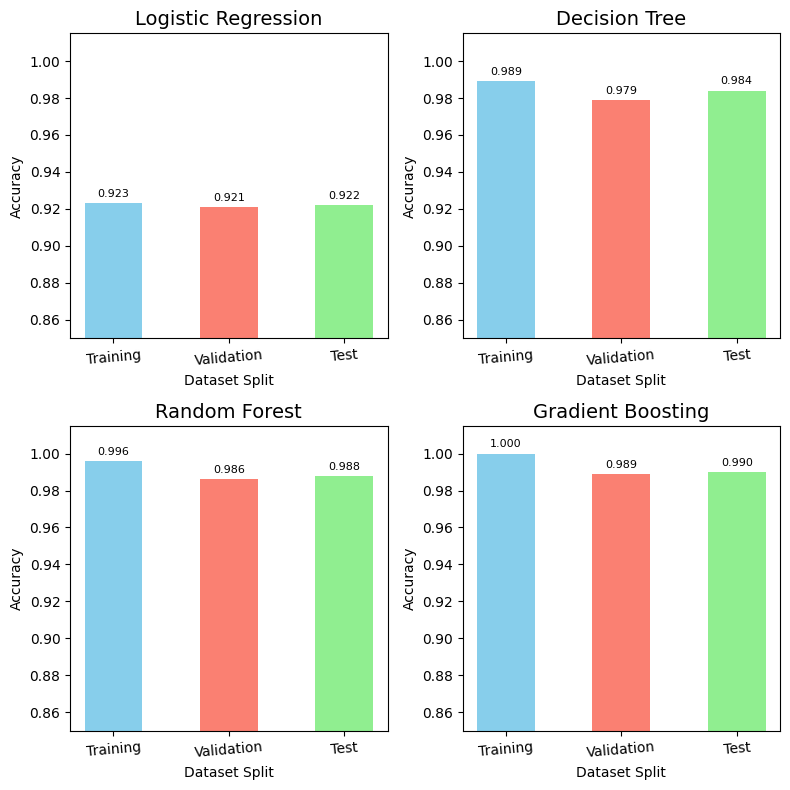

In [163]:
# Training, validation, and test accuracy values
models = {
    'Logistic Regression': {
        'training': 0.923,
        'validation': 0.921,
        'test': 0.922
    },
    'Decision Tree': {
        'training': 0.989,
        'validation': 0.979,
        'test': 0.984
    },
    'Random Forest': {
        'training': 0.996,
        'validation': 0.986,
        'test': 0.988
    },
    'Gradient Boosting': {
        'training': 1.000,
        'validation': 0.989,
        'test': 0.990
    }
}

# Setup
categories = ['Training', 'Validation', 'Test']
bar_width = 0.5
x = np.arange(len(categories))

# Create subplots (2 rows, 3 columns)
fig, axes = plt.subplots(2, 2, figsize=(8, 8))
axes = axes.flatten()

colors = ['skyblue', 'salmon', 'lightgreen']  # Colors for training, validation, test

# Plotting each model
for idx, (model_name, accuracies) in enumerate(models.items()):
    ax = axes[idx]
    values = [accuracies['training'], accuracies['validation'], accuracies['test']]
    
    bars = ax.bar(x, values, color=colors, width=bar_width)
    
    ax.set_title(model_name, fontsize=14)
    ax.set_xlabel('Dataset Split')
    ax.set_ylabel('Accuracy')
    ax.set_xticks(x)
    ax.set_xticklabels(categories, rotation=5)  # Rotate labels
    ax.set_ylim(0.85, 1.015)
    
    # Add accuracy labels on top of bars
    for bar in bars:
        height = bar.get_height()
        ax.annotate(f'{height:.3f}',
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3),
                    textcoords="offset points",
                    ha='center', va='bottom', fontsize=8)

# Remove any empty plots if extra axes exist
for j in range(idx+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

- LR, DT, RF, and GB — performance, with metrics (accuracy, precision, recall, F1-score, FPR and AUC) 

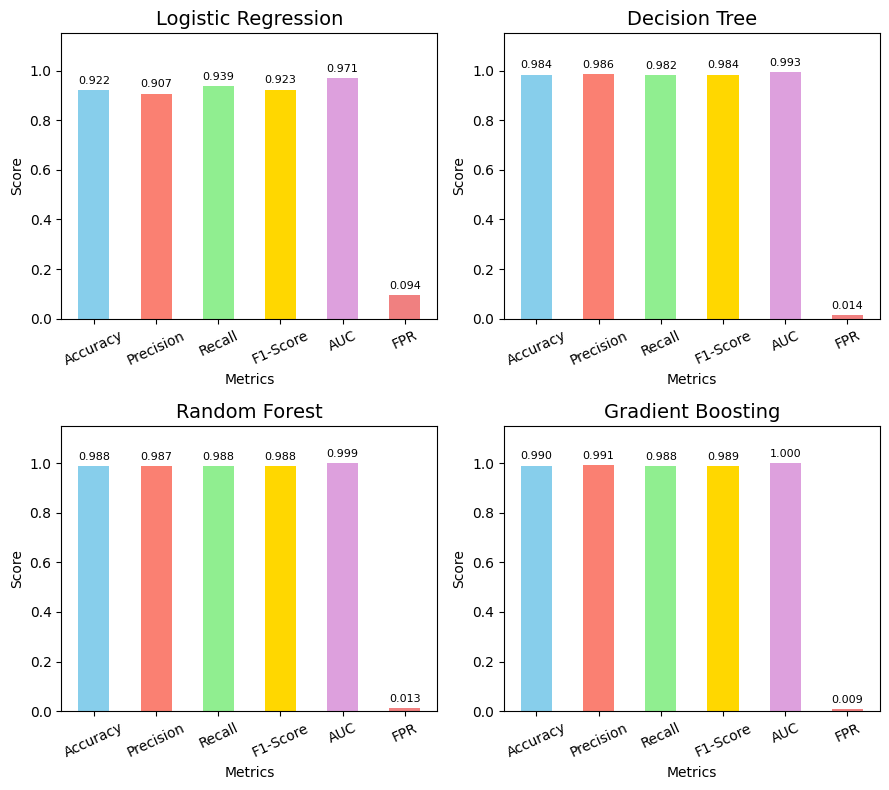

In [164]:
# Test metric values (LR, DT, RF, and GB — performance)
models = {
    'Logistic Regression': {
        'Accuracy': 0.922,
        'Precision': 0.907,
        'Recall': 0.939,
        'F1-Score': 0.923,
        'AUC': 0.971,
        'FPR': 0.094
    },
    'Decision Tree': {
        'Accuracy': 0.984,
        'Precision': 0.986,
        'Recall': 0.982,
        'F1-Score': 0.984,
        'AUC': 0.993,
        'FPR': 0.014
    },
    'Random Forest': {
        'Accuracy': 0.988,
        'Precision': 0.987,
        'Recall': 0.988,
        'F1-Score': 0.988,
        'AUC': 0.999,
        'FPR': 0.013
    },
    'Gradient Boosting': {
        'Accuracy': 0.990,
        'Precision': 0.991,
        'Recall': 0.988,
        'F1-Score': 0.989,
        'AUC': 1.000,
        'FPR': 0.009
    }
}

# Setup
metrics = ['Accuracy', 'Precision', 'Recall', 'F1-Score', 'AUC', 'FPR']
bar_width = 0.5
x = np.arange(len(metrics))

# Create subplots (2 rows, 2 columns)
fig, axes = plt.subplots(2, 2, figsize=(9, 8))
axes = axes.flatten()

colors = ['skyblue', 'salmon', 'lightgreen', 'gold', 'plum', 'lightcoral']

# Plotting each model
for idx, (model_name, scores) in enumerate(models.items()):
    ax = axes[idx]
    values = [scores[metric] for metric in metrics]
    
    bars = ax.bar(x, values, color=colors, width=bar_width)
    
    ax.set_title(model_name, fontsize=14)
    ax.set_xlabel('Metrics')
    ax.set_ylabel('Score')
    ax.set_xticks(x)
    ax.set_xticklabels(metrics, rotation=25)
    ax.set_ylim(0, 1.15)  # Allow space above for annotations
    
    # No legend

    # Add score labels on top of bars
    for bar in bars:
        height = bar.get_height()
        ax.annotate(f'{height:.3f}',
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3),
                    textcoords="offset points",
                    ha='center', va='bottom', fontsize=8)

# Remove any empty plots if extra axes exist
for j in range(idx+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

- Models’ accuracy, precision, recall, F1-score, and False Positive Rate from the confusion matrices, along with AUC values obtained from the AUROC curves.

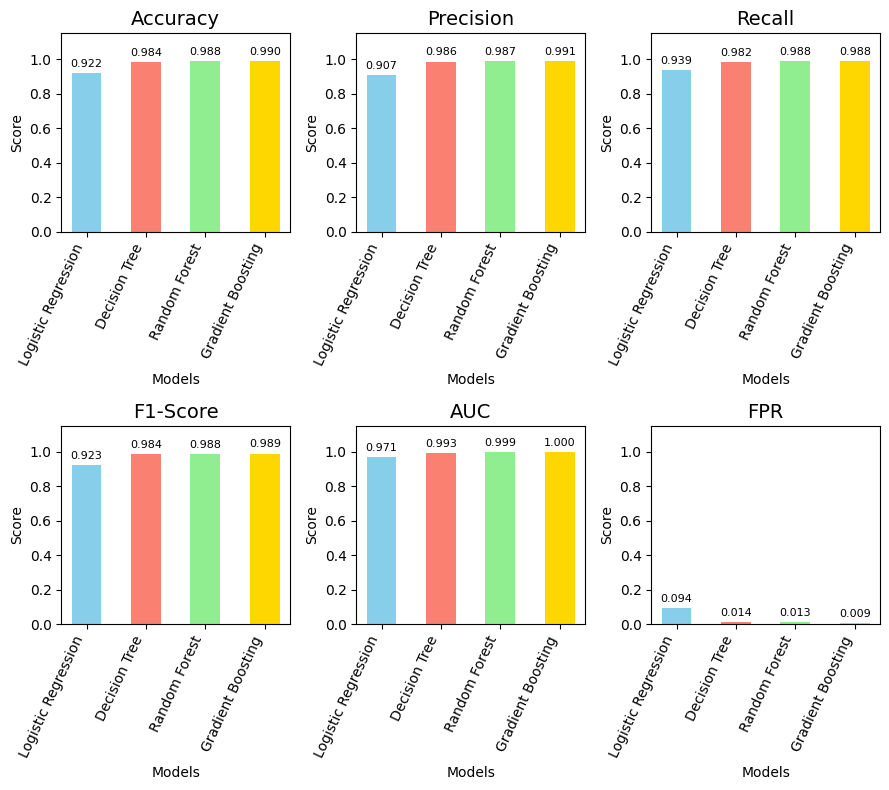

In [165]:
# Test metric values 
# Models’ accuracy, precision, recall, F1-score, and False Positive Rate from the confusion matrices, along with AUC values obtained from the AUROC curves.

models = {
    'Logistic Regression': {
        'Accuracy': 0.922,
        'Precision': 0.907,
        'Recall': 0.939,
        'F1-Score': 0.923,
        'AUC': 0.971,
        'FPR': 0.094
    },
    'Decision Tree': {
        'Accuracy': 0.984,
        'Precision': 0.986,
        'Recall': 0.982,
        'F1-Score': 0.984,
        'AUC': 0.993,
        'FPR': 0.014
    },
    'Random Forest': {
        'Accuracy': 0.988,
        'Precision': 0.987,
        'Recall': 0.988,
        'F1-Score': 0.988,
        'AUC': 0.999,
        'FPR': 0.013
    },
    'Gradient Boosting': {
        'Accuracy': 0.990,
        'Precision': 0.991,
        'Recall': 0.988,
        'F1-Score': 0.989,
        'AUC': 1.000,
        'FPR': 0.009
    }
}

# Setup
metrics = ['Accuracy', 'Precision', 'Recall', 'F1-Score', 'AUC', 'FPR']
models_names = list(models.keys())
x = np.arange(len(models_names))
bar_width = 0.5

# Create subplots (2 rows, 3 columns)
fig, axes = plt.subplots(2, 3, figsize=(9, 8))
axes = axes.flatten()

colors = ['skyblue', 'salmon', 'lightgreen', 'gold']

# Plotting each metric
for idx, metric in enumerate(metrics):
    ax = axes[idx]
    values = [models[model][metric] for model in models_names]
    
    bars = ax.bar(x, values, color=colors, width=bar_width)
    
    ax.set_title(metric, fontsize=14)
    ax.set_xlabel('Models')
    ax.set_ylabel('Score')
    ax.set_xticks(x)
    ax.set_xticklabels(models_names, rotation=65, ha='right')
    ax.set_ylim(0, 1.15)  # Allow space above for annotations

    # Add value labels on top of bars
    for bar in bars:
        height = bar.get_height()
        ax.annotate(f'{height:.3f}',
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3),
                    textcoords="offset points",
                    ha='center', va='bottom', fontsize=8)

# Remove any empty plots if extra axes exist
for j in range(idx+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

# REFLECTING ON PROFESSIONAL, ETHICAL, AND LEGAL ISSUES IN RELATION TO THE PROBLEM AND THE DATA SET.
- The LIME Explanation will aid in ensuring compliance with professional, ethical and legal issues.
- Check the attached report  for more information.

# The models were trained with Python 3.13.1. However, for the deployed web application prototype, the models were retrained with Python 3.12. 
- The files containing the deployed web application prototype codes is saved in another folder submitted along with this submission.
- A prototype web application for loan approval prediction, powered by DT, GB, LR, and RF models, is hosted at https://bankloanapp.onrender.com. 
- The deployed web application prototype is hosted on Render’s free tier, it includes a homepage (bankloanindex.html) and a /predict endpoint for real-time inference. The free tier causes the app to sleep after 15 minutes of inactivity, leading to a 30–60 seconds delay when reactivated.
- The web application was done using the combination of knowledge I acquired in the following courses: Software Development Innovation, Interactive Visualization, Data Science Foundation, Machine Learning.
- I plan to improve the web application with the knowledge I acquired in AI Ethics courses (for model decision explanation) and Big Data (for visualization of the model decision)

---

- A desktop installable version compatible with Windows Operating Systems can be acquired by reaching out to Olawale Onaolapo at olawaleonaolapo@yahoo.com. 

# THANK YOU
